# benchmarking on omnipath


In [1]:
from scprint import scPrint
from scprint.tasks import GRNfer

from bengrn import BenGRN
import scanpy as sc

from bengrn.base import train_classifier

from anndata.utils import make_index_unique
from bengrn import compute_genie3
from grnndata import utils as grnutils
import numpy as np
import joblib
%load_ext autoreload
%autoreload 2 

import torch
torch.set_float32_matmul_precision('medium')

💡 connected lamindb: jkobject/scprint


/pasteur/appa/homes/jkalfon/miniconda3/envs/scprint17/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(


In [2]:
model = scPrint.load_from_checkpoint(
#    '../data/temp/o2uniqsx/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
#    '../data/temp/vbd8bavn/epoch=19-step=100000.ckpt', precpt_gene_emb=None)
#    '../data/temp/1tghqqzx_dir/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
    '/pasteur/zeus/projets/p02/ml4ig_hot/Users/jkalfon/scprint_scale/o2uniqsx/checkpoints/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
NUM_GENES = 5000
MAXCELLS = 1024

[d3graph] INFO> Created a temporary directory at /local/scratch/tmp/tmpjhq3na8t


[d3graph] INFO> Writing /local/scratch/tmp/tmpjhq3na8t/_remote_module_non_scriptable.py


RuntimeError caught: scPrint is not attached to a `Trainer`.


In [3]:
CELLTYPES = [
    'kidney distal convoluted tubule epithelial cell',
    'kidney loop of Henle thick ascending limb epithelial cell',
    'kidney collecting duct principal cell',
    'mesangial cell',
    'blood vessel smooth muscle cell',
    'podocyte',
    'macrophage',
    'leukocyte',
    'kidney interstitial fibroblast',
    'endothelial cell'
]

In [4]:
#adata = sc.read_h5ad('/home/ml4ig1/scprint/.lamindb/yBCKp6HmXuHa0cZptMo7.h5ad')
adata = sc.read_h5ad('../data/yBCKp6HmXuHa0cZptMo7.h5ad')
adata.var["isTF"] = False
adata.var.loc[adata.var.symbol.isin(grnutils.TF), "isTF"] = True
adata

AnnData object with n_obs × n_vars = 15728 × 70116
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'tissue_section_uuid', 'tissue_section_thickness', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_3', 'leide

In [5]:
#model.normalization = "log"
model.organisms = ['NCBITaxon:9606','NCBITaxon:10090']


  0%|          | 0/27 [00:00<?, ?it/s]


  4%|▎         | 1/27 [00:05<02:33,  5.90s/it]


  7%|▋         | 2/27 [00:20<04:42, 11.28s/it]


 11%|█         | 3/27 [00:23<02:58,  7.44s/it]


 15%|█▍        | 4/27 [00:26<02:11,  5.74s/it]


 19%|█▊        | 5/27 [00:27<01:28,  4.03s/it]


 22%|██▏       | 6/27 [00:28<01:01,  2.94s/it]


 26%|██▌       | 7/27 [00:29<00:44,  2.25s/it]


 30%|██▉       | 8/27 [00:30<00:34,  1.79s/it]


 33%|███▎      | 9/27 [00:31<00:26,  1.49s/it]


 37%|███▋      | 10/27 [00:32<00:21,  1.29s/it]


 41%|████      | 11/27 [00:32<00:18,  1.17s/it]


 44%|████▍     | 12/27 [00:33<00:15,  1.06s/it]


 48%|████▊     | 13/27 [00:36<00:22,  1.57s/it]


 52%|█████▏    | 14/27 [00:41<00:32,  2.53s/it]


 56%|█████▌    | 15/27 [00:48<00:47,  4.00s/it]


 59%|█████▉    | 16/27 [00:55<00:51,  4.70s/it]


 63%|██████▎   | 17/27 [01:05<01:05,  6.53s/it]


 67%|██████▋   | 18/27 [01:08<00:47,  5.26s/it]


 70%|███████   | 19/27 [01:09<00:32,  4.00s/it]


 74%|███████▍  | 20/27 [01:10<00:21,  3.10s/it]


 78%|███████▊  | 21/27 [01:11<00:14,  2.47s/it]


 81%|████████▏ | 22/27 [01:12<00:10,  2.03s/it]


 85%|████████▌ | 23/27 [01:13<00:06,  1.75s/it]


 89%|████████▉ | 24/27 [01:15<00:06,  2.02s/it]


 93%|█████████▎| 25/27 [01:19<00:04,  2.37s/it]


 96%|█████████▋| 26/27 [01:20<00:01,  1.95s/it]


100%|██████████| 27/27 [01:21<00:00,  1.66s/it]


100%|██████████| 27/27 [01:21<00:00,  3.01s/it]

avg link count: 535876201, sparsity: 1.0


base enrichment


too many genes for central computation


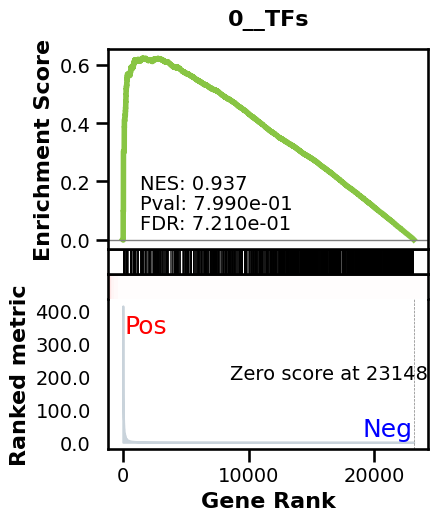

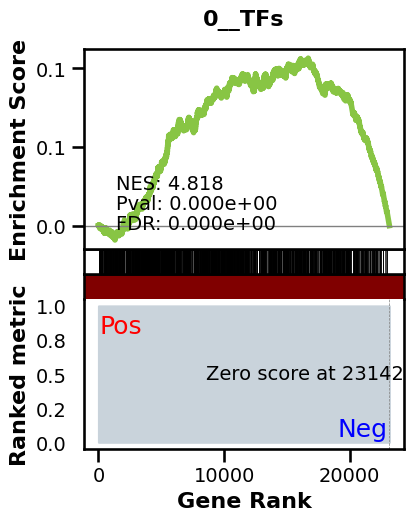

_________________________________________
TF specific enrichment


found some significant results for  60.714285714285715 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:28,  4.39it/s]


  2%|▏         | 2/128 [00:00<00:28,  4.38it/s]


  2%|▏         | 3/128 [00:00<00:28,  4.32it/s]


  3%|▎         | 4/128 [00:00<00:29,  4.24it/s]


  4%|▍         | 5/128 [00:01<00:28,  4.28it/s]


  5%|▍         | 6/128 [00:01<00:28,  4.31it/s]


  5%|▌         | 7/128 [00:01<00:27,  4.33it/s]


  6%|▋         | 8/128 [00:01<00:27,  4.34it/s]


  7%|▋         | 9/128 [00:02<00:27,  4.35it/s]


  8%|▊         | 10/128 [00:02<00:27,  4.36it/s]


  9%|▊         | 11/128 [00:02<00:26,  4.36it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.36it/s]


 10%|█         | 13/128 [00:02<00:26,  4.36it/s]


 11%|█         | 14/128 [00:03<00:26,  4.29it/s]


 12%|█▏        | 15/128 [00:03<00:27,  4.13it/s]


 12%|█▎        | 16/128 [00:03<00:26,  4.19it/s]


 13%|█▎        | 17/128 [00:03<00:26,  4.24it/s]


 14%|█▍        | 18/128 [00:04<00:25,  4.27it/s]


 15%|█▍        | 19/128 [00:04<00:25,  4.30it/s]


 16%|█▌        | 20/128 [00:04<00:25,  4.31it/s]


 16%|█▋        | 21/128 [00:04<00:24,  4.33it/s]


 17%|█▋        | 22/128 [00:05<00:24,  4.34it/s]


 18%|█▊        | 23/128 [00:05<00:24,  4.35it/s]


 19%|█▉        | 24/128 [00:05<00:23,  4.35it/s]


 20%|█▉        | 25/128 [00:05<00:23,  4.32it/s]


 20%|██        | 26/128 [00:06<00:24,  4.12it/s]


 21%|██        | 27/128 [00:06<00:24,  4.18it/s]


 22%|██▏       | 28/128 [00:06<00:23,  4.24it/s]


 23%|██▎       | 29/128 [00:06<00:23,  4.28it/s]


 23%|██▎       | 30/128 [00:06<00:22,  4.30it/s]


 24%|██▍       | 31/128 [00:07<00:22,  4.32it/s]


 25%|██▌       | 32/128 [00:07<00:22,  4.32it/s]


 26%|██▌       | 33/128 [00:07<00:21,  4.33it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.34it/s]


 27%|██▋       | 35/128 [00:08<00:21,  4.34it/s]


 28%|██▊       | 36/128 [00:08<00:21,  4.35it/s]


 29%|██▉       | 37/128 [00:08<00:20,  4.34it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.34it/s]


 30%|███       | 39/128 [00:09<00:20,  4.33it/s]


 31%|███▏      | 40/128 [00:09<00:20,  4.34it/s]


 32%|███▏      | 41/128 [00:09<00:20,  4.34it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.34it/s]


 34%|███▎      | 43/128 [00:09<00:19,  4.34it/s]


 34%|███▍      | 44/128 [00:10<00:19,  4.34it/s]


 35%|███▌      | 45/128 [00:10<00:19,  4.34it/s]


 36%|███▌      | 46/128 [00:10<00:18,  4.34it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.34it/s]


 38%|███▊      | 48/128 [00:11<00:18,  4.34it/s]


 38%|███▊      | 49/128 [00:11<00:18,  4.34it/s]


 39%|███▉      | 50/128 [00:11<00:17,  4.34it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.35it/s]


 41%|████      | 52/128 [00:12<00:17,  4.35it/s]


 41%|████▏     | 53/128 [00:12<00:17,  4.35it/s]


 42%|████▏     | 54/128 [00:12<00:17,  4.35it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.35it/s]


 44%|████▍     | 56/128 [00:12<00:16,  4.34it/s]


 45%|████▍     | 57/128 [00:13<00:16,  4.35it/s]


 45%|████▌     | 58/128 [00:13<00:16,  4.35it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.35it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.35it/s]


 48%|████▊     | 61/128 [00:14<00:15,  4.35it/s]


 48%|████▊     | 62/128 [00:14<00:15,  4.35it/s]


 49%|████▉     | 63/128 [00:14<00:14,  4.35it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.35it/s]


 51%|█████     | 65/128 [00:15<00:14,  4.35it/s]


 52%|█████▏    | 66/128 [00:15<00:14,  4.36it/s]


 52%|█████▏    | 67/128 [00:15<00:14,  4.35it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.36it/s]


 54%|█████▍    | 69/128 [00:15<00:13,  4.36it/s]


 55%|█████▍    | 70/128 [00:16<00:13,  4.36it/s]


 55%|█████▌    | 71/128 [00:16<00:13,  4.36it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.35it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.36it/s]


 58%|█████▊    | 74/128 [00:17<00:12,  4.35it/s]


 59%|█████▊    | 75/128 [00:17<00:12,  4.35it/s]


 59%|█████▉    | 76/128 [00:17<00:11,  4.34it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.34it/s]


 61%|██████    | 78/128 [00:18<00:11,  4.35it/s]


 62%|██████▏   | 79/128 [00:18<00:11,  4.35it/s]


 62%|██████▎   | 80/128 [00:18<00:11,  4.34it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.35it/s]


 64%|██████▍   | 82/128 [00:18<00:10,  4.35it/s]


 65%|██████▍   | 83/128 [00:19<00:10,  4.35it/s]


 66%|██████▌   | 84/128 [00:19<00:10,  4.35it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.35it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.35it/s]


 68%|██████▊   | 87/128 [00:20<00:09,  4.35it/s]


 69%|██████▉   | 88/128 [00:20<00:09,  4.35it/s]


 70%|██████▉   | 89/128 [00:20<00:08,  4.35it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.34it/s]


 71%|███████   | 91/128 [00:21<00:08,  4.34it/s]


 72%|███████▏  | 92/128 [00:21<00:08,  4.34it/s]


 73%|███████▎  | 93/128 [00:21<00:08,  4.34it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.34it/s]


 74%|███████▍  | 95/128 [00:21<00:07,  4.35it/s]


 75%|███████▌  | 96/128 [00:22<00:07,  4.35it/s]


 76%|███████▌  | 97/128 [00:22<00:07,  4.34it/s]


 77%|███████▋  | 98/128 [00:22<00:06,  4.34it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.34it/s]


 78%|███████▊  | 100/128 [00:23<00:06,  4.34it/s]


 79%|███████▉  | 101/128 [00:23<00:06,  4.34it/s]


 80%|███████▉  | 102/128 [00:23<00:05,  4.34it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.33it/s]


 81%|████████▏ | 104/128 [00:24<00:05,  4.33it/s]


 82%|████████▏ | 105/128 [00:24<00:05,  4.34it/s]


 83%|████████▎ | 106/128 [00:24<00:05,  4.34it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.34it/s]


 84%|████████▍ | 108/128 [00:24<00:04,  4.34it/s]


 85%|████████▌ | 109/128 [00:25<00:04,  4.34it/s]


 86%|████████▌ | 110/128 [00:25<00:04,  4.34it/s]


 87%|████████▋ | 111/128 [00:25<00:03,  4.34it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.34it/s]


 88%|████████▊ | 113/128 [00:26<00:03,  4.33it/s]


 89%|████████▉ | 114/128 [00:26<00:03,  4.34it/s]


 90%|████████▉ | 115/128 [00:26<00:02,  4.35it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.34it/s]


 91%|█████████▏| 117/128 [00:27<00:02,  4.34it/s]


 92%|█████████▏| 118/128 [00:27<00:02,  4.35it/s]


 93%|█████████▎| 119/128 [00:27<00:02,  4.35it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.35it/s]


 95%|█████████▍| 121/128 [00:27<00:01,  4.34it/s]


 95%|█████████▌| 122/128 [00:28<00:01,  4.34it/s]


 96%|█████████▌| 123/128 [00:28<00:01,  4.34it/s]


 97%|█████████▋| 124/128 [00:28<00:00,  4.34it/s]


 98%|█████████▊| 125/128 [00:28<00:00,  4.34it/s]


 98%|█████████▊| 126/128 [00:29<00:00,  4.34it/s]


 99%|█████████▉| 127/128 [00:29<00:00,  4.34it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:29<00:00,  4.30it/s]


100%|██████████| 128/128 [00:29<00:00,  4.33it/s]

Average Precision (AP):  0.001026666994495258
Area Under Precision-Recall Curve (AUPRC):  0.0010260415719430312


EPR: 1.810652622818377


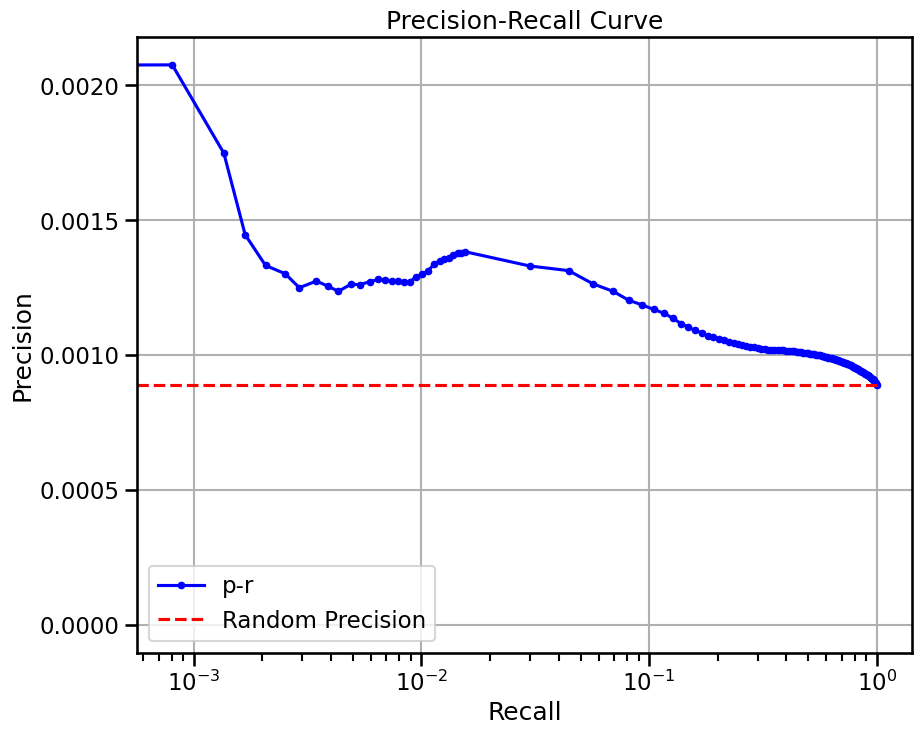


  0%|          | 0/54 [00:00<?, ?it/s]


  2%|▏         | 1/54 [00:05<04:47,  5.42s/it]


  4%|▎         | 2/54 [00:07<03:06,  3.58s/it]


  6%|▌         | 3/54 [00:08<02:07,  2.50s/it]


  7%|▋         | 4/54 [00:10<01:45,  2.11s/it]


  9%|▉         | 5/54 [00:11<01:27,  1.79s/it]


 11%|█         | 6/54 [00:13<01:20,  1.67s/it]


 13%|█▎        | 7/54 [00:14<01:11,  1.52s/it]


 15%|█▍        | 8/54 [00:15<01:05,  1.43s/it]


 17%|█▋        | 9/54 [00:16<01:01,  1.37s/it]


 19%|█▊        | 10/54 [00:23<02:14,  3.06s/it]


 20%|██        | 11/54 [00:26<02:10,  3.04s/it]


 22%|██▏       | 12/54 [00:31<02:27,  3.51s/it]


 24%|██▍       | 13/54 [00:35<02:33,  3.76s/it]


 26%|██▌       | 14/54 [00:41<02:51,  4.29s/it]


 28%|██▊       | 15/54 [00:44<02:37,  4.03s/it]


 30%|██▉       | 16/54 [00:48<02:34,  4.06s/it]


 31%|███▏      | 17/54 [00:50<02:07,  3.44s/it]


 33%|███▎      | 18/54 [00:51<01:41,  2.81s/it]


 35%|███▌      | 19/54 [00:53<01:23,  2.40s/it]


 37%|███▋      | 20/54 [00:54<01:09,  2.04s/it]


 39%|███▉      | 21/54 [00:55<00:59,  1.80s/it]


 41%|████      | 22/54 [00:57<00:52,  1.64s/it]


 43%|████▎     | 23/54 [01:08<02:19,  4.51s/it]


 44%|████▍     | 24/54 [01:19<03:16,  6.54s/it]


 46%|████▋     | 25/54 [01:23<02:48,  5.82s/it]


 48%|████▊     | 26/54 [01:29<02:43,  5.84s/it]


 50%|█████     | 27/54 [01:30<02:01,  4.48s/it]


 52%|█████▏    | 28/54 [01:32<01:31,  3.51s/it]


 54%|█████▎    | 29/54 [01:35<01:23,  3.33s/it]


 56%|█████▌    | 30/54 [01:39<01:28,  3.69s/it]


 57%|█████▋    | 31/54 [01:41<01:12,  3.16s/it]


 59%|█████▉    | 32/54 [01:42<00:57,  2.61s/it]


 61%|██████    | 33/54 [01:44<00:45,  2.19s/it]


 63%|██████▎   | 34/54 [01:45<00:37,  1.89s/it]


 65%|██████▍   | 35/54 [01:46<00:32,  1.69s/it]


 67%|██████▋   | 36/54 [01:47<00:27,  1.54s/it]


 69%|██████▊   | 37/54 [01:48<00:24,  1.44s/it]


 70%|███████   | 38/54 [01:50<00:21,  1.37s/it]


 72%|███████▏  | 39/54 [01:51<00:19,  1.32s/it]


 74%|███████▍  | 40/54 [01:52<00:17,  1.29s/it]


 76%|███████▌  | 41/54 [01:53<00:16,  1.27s/it]


 78%|███████▊  | 42/54 [01:54<00:14,  1.24s/it]


 80%|███████▉  | 43/54 [01:56<00:13,  1.24s/it]


 81%|████████▏ | 44/54 [01:57<00:12,  1.23s/it]


 83%|████████▎ | 45/54 [01:58<00:10,  1.22s/it]


 85%|████████▌ | 46/54 [01:59<00:09,  1.20s/it]


 87%|████████▋ | 47/54 [02:00<00:08,  1.20s/it]


 89%|████████▉ | 48/54 [02:07<00:16,  2.77s/it]


 91%|█████████ | 49/54 [02:13<00:18,  3.71s/it]


 93%|█████████▎| 50/54 [02:23<00:22,  5.59s/it]


 94%|█████████▍| 51/54 [02:30<00:18,  6.16s/it]


 96%|█████████▋| 52/54 [02:35<00:11,  5.84s/it]


 98%|█████████▊| 53/54 [02:38<00:04,  4.92s/it]


100%|██████████| 54/54 [02:39<00:00,  3.70s/it]


100%|██████████| 54/54 [02:39<00:00,  2.96s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


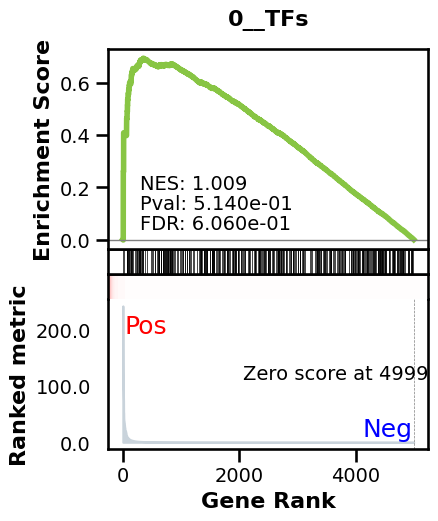

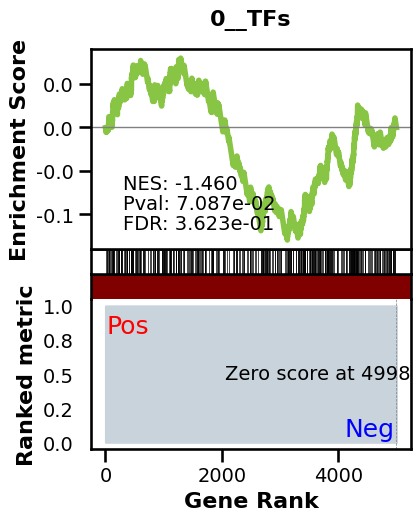

_________________________________________
TF specific enrichment


found some significant results for  20.58823529411765 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3484 genes
intersection pct: 0.6968
precision:  0.0008261483363013599 
recall:  1.0 
random precision: 0.0008263855307705822



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 57.90it/s]


  9%|▉         | 12/128 [00:00<00:01, 58.02it/s]


 14%|█▍        | 18/128 [00:00<00:01, 58.21it/s]


 19%|█▉        | 24/128 [00:00<00:01, 58.06it/s]


 23%|██▎       | 30/128 [00:00<00:01, 58.00it/s]


 28%|██▊       | 36/128 [00:00<00:01, 58.01it/s]


 33%|███▎      | 42/128 [00:00<00:01, 58.01it/s]


 38%|███▊      | 48/128 [00:00<00:01, 58.11it/s]


 42%|████▏     | 54/128 [00:00<00:01, 58.22it/s]


 47%|████▋     | 60/128 [00:01<00:01, 58.18it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 58.36it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 58.54it/s]


 61%|██████    | 78/128 [00:01<00:00, 58.59it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 58.60it/s]


 70%|███████   | 90/128 [00:01<00:00, 57.90it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 58.22it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 58.49it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 58.63it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 58.59it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 58.37it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 58.61it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 58.31it/s]

Average Precision (AP):  0.0008918508112469623
Area Under Precision-Recall Curve (AUPRC):  0.0008897721192899961


EPR: 2.7836056684301527


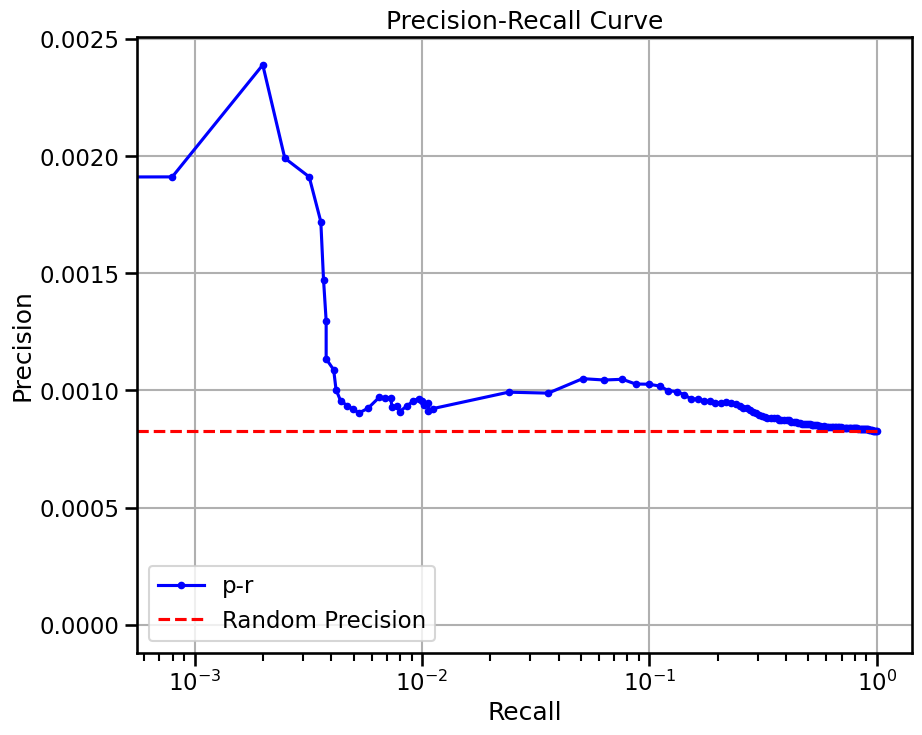

base enrichment


Top central genes: []


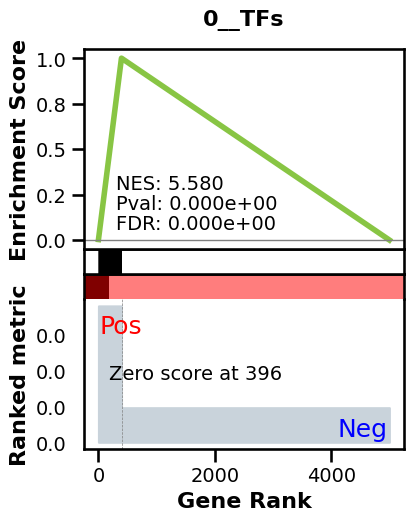

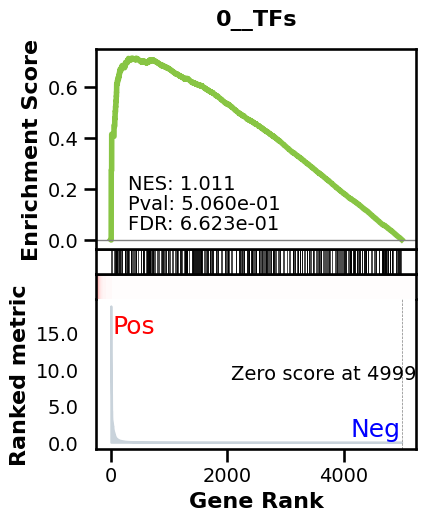

_________________________________________
TF specific enrichment


found some significant results for  14.705882352941176 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3484 genes
intersection pct: 0.6968
precision:  0.0030067336747127975 
recall:  0.3405464698843239 
random precision: 0.0008263855307705822



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 59.23it/s]


  9%|▉         | 12/128 [00:00<00:01, 59.18it/s]


 14%|█▍        | 18/128 [00:00<00:01, 59.21it/s]


 19%|█▉        | 24/128 [00:00<00:01, 59.09it/s]


 23%|██▎       | 30/128 [00:00<00:01, 58.90it/s]


 28%|██▊       | 36/128 [00:00<00:01, 58.99it/s]


 33%|███▎      | 42/128 [00:00<00:01, 59.08it/s]


 38%|███▊      | 48/128 [00:00<00:01, 59.16it/s]


 43%|████▎     | 55/128 [00:00<00:01, 59.65it/s]


 48%|████▊     | 61/128 [00:01<00:01, 59.52it/s]


 52%|█████▏    | 67/128 [00:01<00:01, 59.40it/s]


 57%|█████▋    | 73/128 [00:01<00:00, 59.37it/s]


 62%|██████▏   | 79/128 [00:01<00:00, 59.39it/s]


 66%|██████▋   | 85/128 [00:01<00:00, 59.39it/s]


 71%|███████   | 91/128 [00:01<00:00, 59.39it/s]


 76%|███████▌  | 97/128 [00:01<00:00, 59.27it/s]


 80%|████████  | 103/128 [00:01<00:00, 59.29it/s]


 85%|████████▌ | 109/128 [00:01<00:00, 59.31it/s]


 90%|████████▉ | 115/128 [00:01<00:00, 59.34it/s]


 95%|█████████▍| 121/128 [00:02<00:00, 59.29it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 59.54it/s]


100%|██████████| 128/128 [00:02<00:00, 59.31it/s]

Average Precision (AP):  0.001960723982230119
Area Under Precision-Recall Curve (AUPRC):  0.0016760121281330384
EPR: 4.368297199809487


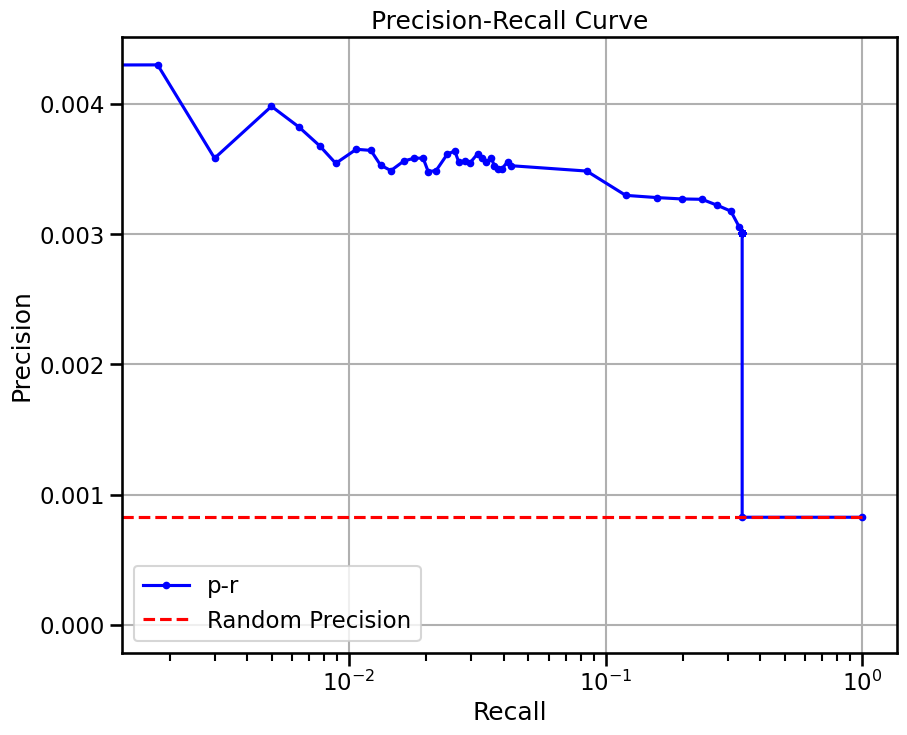

true elem 10028 ...


doing classification....


metrics {'used_heads': 3, 'precision': 0.0008314620117426245, 'random_precision': 0.0008314620117426245, 'recall': 1.0, 'predicted_true': 4855303.0, 'number_of_true': 4037.0}


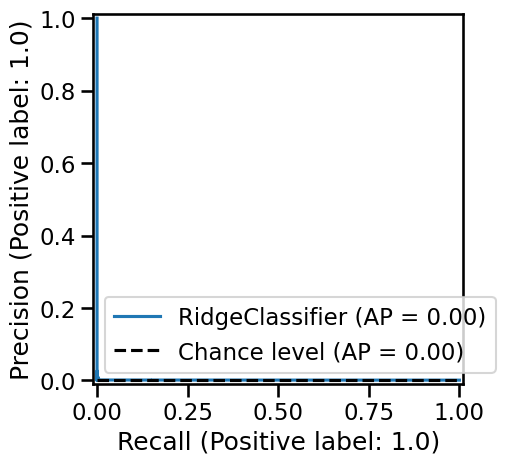

base enrichment


Top central genes: []
The DataFrame contains only the same values.


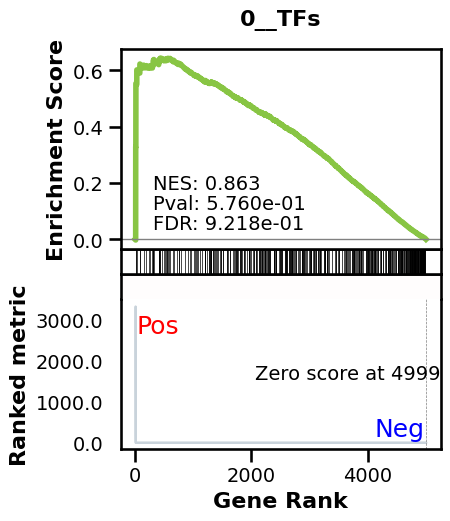

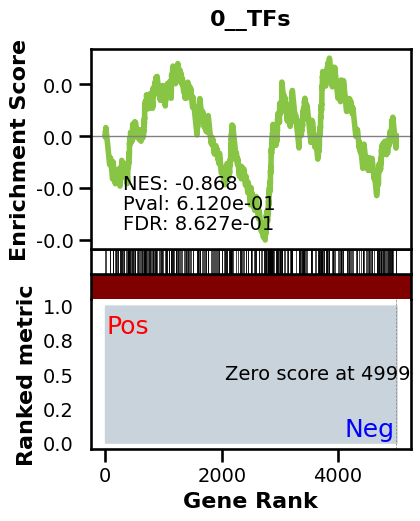

_________________________________________
TF specific enrichment


found some significant results for  2.9411764705882355 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3484 genes
intersection pct: 0.6968
precision:  0.0008261483363013599 
recall:  1.0 
random precision: 0.0008263855307705822



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 59.73it/s]


 10%|█         | 13/128 [00:00<00:01, 59.80it/s]


 15%|█▍        | 19/128 [00:00<00:01, 59.85it/s]


 20%|█▉        | 25/128 [00:00<00:01, 59.89it/s]


 24%|██▍       | 31/128 [00:00<00:01, 59.91it/s]


 29%|██▉       | 37/128 [00:00<00:01, 59.92it/s]


 34%|███▍      | 44/128 [00:00<00:01, 59.94it/s]


 39%|███▉      | 50/128 [00:00<00:01, 59.93it/s]


 44%|████▍     | 56/128 [00:00<00:01, 59.87it/s]


 48%|████▊     | 62/128 [00:01<00:01, 59.83it/s]


 53%|█████▎    | 68/128 [00:01<00:01, 59.80it/s]


 59%|█████▊    | 75/128 [00:01<00:00, 59.88it/s]


 63%|██████▎   | 81/128 [00:01<00:00, 59.90it/s]


 68%|██████▊   | 87/128 [00:01<00:00, 59.91it/s]


 73%|███████▎  | 94/128 [00:01<00:00, 60.02it/s]


 79%|███████▉  | 101/128 [00:01<00:00, 60.03it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 59.96it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 59.55it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 59.55it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 59.37it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 59.74it/s]

Average Precision (AP):  0.0010017141967483515
Area Under Precision-Recall Curve (AUPRC):  0.000993986073729059
EPR: 4.979989927628857


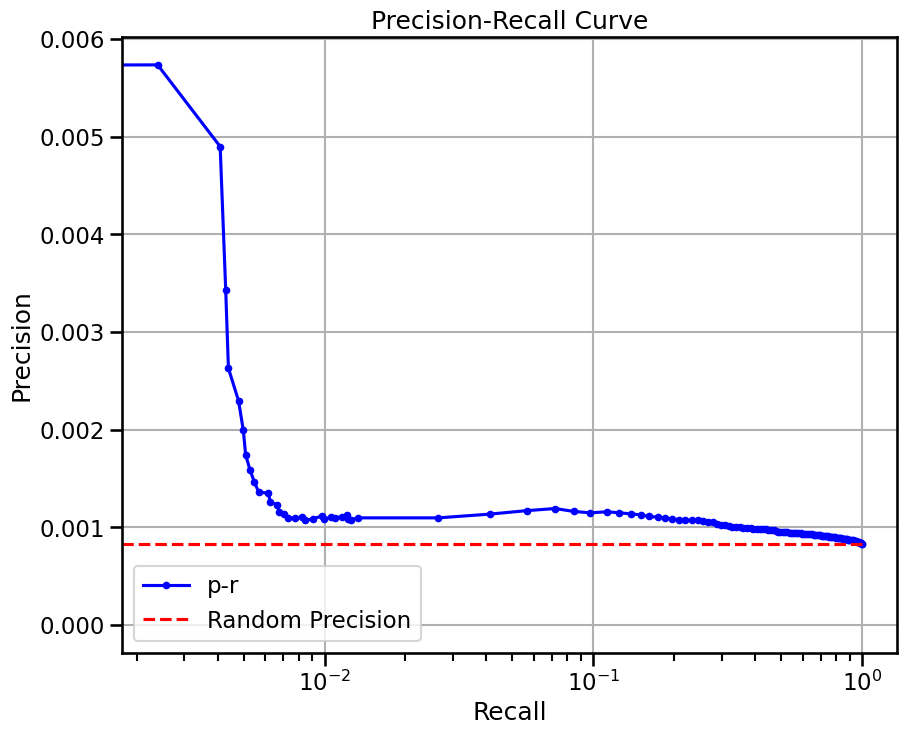

base enrichment


Top central genes: []


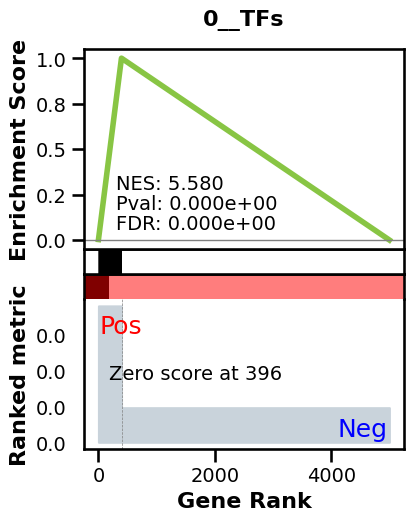

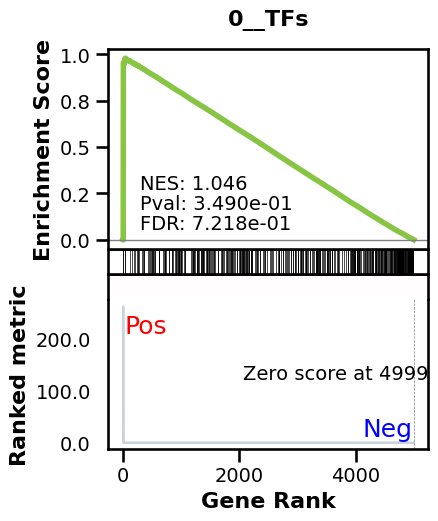

_________________________________________
TF specific enrichment


found some significant results for  8.823529411764707 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3484 genes
intersection pct: 0.6968
precision:  0.0030067336747127975 
recall:  0.3405464698843239 
random precision: 0.0008263855307705822



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 59.34it/s]


  9%|▉         | 12/128 [00:00<00:01, 59.41it/s]


 14%|█▍        | 18/128 [00:00<00:01, 59.44it/s]


 19%|█▉        | 24/128 [00:00<00:01, 59.36it/s]


 23%|██▎       | 30/128 [00:00<00:01, 59.38it/s]


 28%|██▊       | 36/128 [00:00<00:01, 59.46it/s]


 33%|███▎      | 42/128 [00:00<00:01, 59.40it/s]


 38%|███▊      | 48/128 [00:00<00:01, 59.35it/s]


 42%|████▏     | 54/128 [00:00<00:01, 59.31it/s]


 47%|████▋     | 60/128 [00:01<00:01, 59.28it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 59.30it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 59.39it/s]


 61%|██████    | 78/128 [00:01<00:00, 59.41it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 59.43it/s]


 70%|███████   | 90/128 [00:01<00:00, 59.39it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 59.36it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 59.33it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 59.34it/s]


 89%|████████▉ | 114/128 [00:01<00:00, 59.43it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 59.43it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 59.38it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 59.34it/s]

Average Precision (AP):  0.0025784742869048895
Area Under Precision-Recall Curve (AUPRC):  0.002226923771398881
EPR: 12.416585640502555


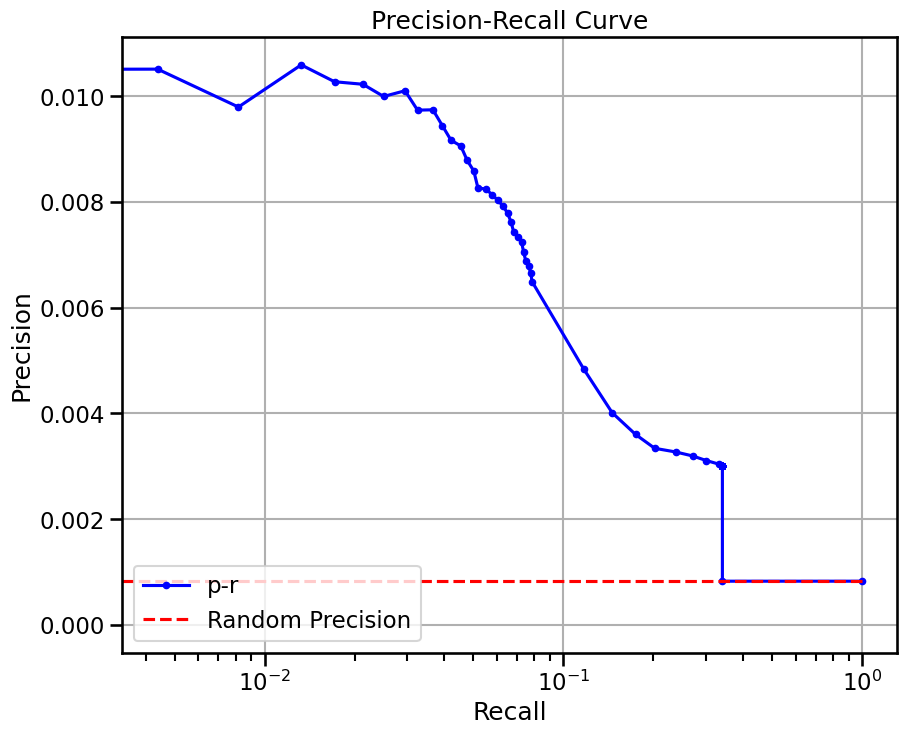


  0%|          | 0/9 [00:00<?, ?it/s]


 11%|█         | 1/9 [00:03<00:28,  3.50s/it]


 22%|██▏       | 2/9 [00:04<00:13,  1.96s/it]


 33%|███▎      | 3/9 [00:05<00:08,  1.44s/it]


 44%|████▍     | 4/9 [00:06<00:06,  1.20s/it]


 56%|█████▌    | 5/9 [00:06<00:04,  1.06s/it]


 67%|██████▋   | 6/9 [00:08<00:03,  1.32s/it]


 78%|███████▊  | 7/9 [00:09<00:02,  1.18s/it]


 89%|████████▉ | 8/9 [00:10<00:01,  1.21s/it]


100%|██████████| 9/9 [00:10<00:00,  1.15it/s]


100%|██████████| 9/9 [00:11<00:00,  1.24s/it]

avg link count: 535876201, sparsity: 1.0


base enrichment


too many genes for central computation


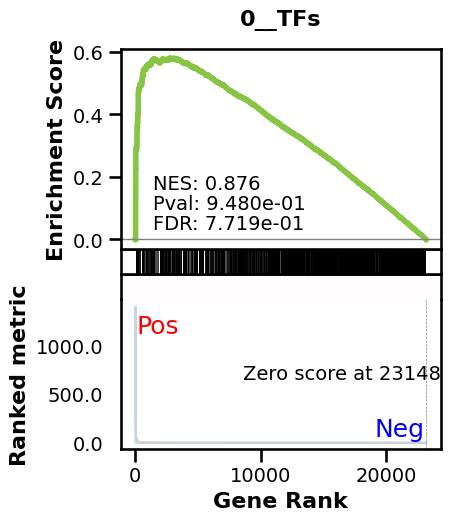

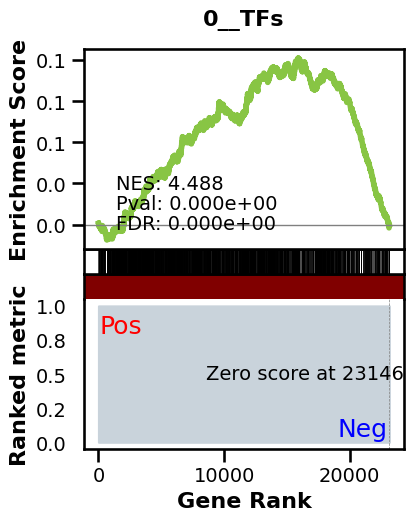

_________________________________________
TF specific enrichment


found some significant results for  66.07142857142857 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:31,  4.08it/s]


  2%|▏         | 2/128 [00:00<00:29,  4.30it/s]


  2%|▏         | 3/128 [00:00<00:28,  4.38it/s]


  3%|▎         | 4/128 [00:00<00:29,  4.21it/s]


  4%|▍         | 5/128 [00:01<00:28,  4.30it/s]


  5%|▍         | 6/128 [00:01<00:28,  4.35it/s]


  5%|▌         | 7/128 [00:01<00:27,  4.39it/s]


  6%|▋         | 8/128 [00:01<00:27,  4.41it/s]


  7%|▋         | 9/128 [00:02<00:26,  4.43it/s]


  8%|▊         | 10/128 [00:02<00:26,  4.44it/s]


  9%|▊         | 11/128 [00:02<00:26,  4.44it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.45it/s]


 10%|█         | 13/128 [00:02<00:25,  4.47it/s]


 11%|█         | 14/128 [00:03<00:25,  4.47it/s]


 12%|█▏        | 15/128 [00:03<00:25,  4.48it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.48it/s]


 13%|█▎        | 17/128 [00:03<00:24,  4.48it/s]


 14%|█▍        | 18/128 [00:04<00:24,  4.49it/s]


 15%|█▍        | 19/128 [00:04<00:24,  4.49it/s]


 16%|█▌        | 20/128 [00:04<00:23,  4.50it/s]


 16%|█▋        | 21/128 [00:04<00:23,  4.50it/s]


 17%|█▋        | 22/128 [00:04<00:23,  4.51it/s]


 18%|█▊        | 23/128 [00:05<00:23,  4.50it/s]


 19%|█▉        | 24/128 [00:05<00:23,  4.49it/s]


 20%|█▉        | 25/128 [00:05<00:22,  4.49it/s]


 20%|██        | 26/128 [00:05<00:22,  4.49it/s]


 21%|██        | 27/128 [00:06<00:22,  4.49it/s]


 22%|██▏       | 28/128 [00:06<00:22,  4.48it/s]


 23%|██▎       | 29/128 [00:06<00:22,  4.49it/s]


 23%|██▎       | 30/128 [00:06<00:21,  4.49it/s]


 24%|██▍       | 31/128 [00:06<00:21,  4.48it/s]


 25%|██▌       | 32/128 [00:07<00:21,  4.49it/s]


 26%|██▌       | 33/128 [00:07<00:21,  4.48it/s]


 27%|██▋       | 34/128 [00:07<00:20,  4.48it/s]


 27%|██▋       | 35/128 [00:07<00:20,  4.48it/s]


 28%|██▊       | 36/128 [00:08<00:20,  4.48it/s]


 29%|██▉       | 37/128 [00:08<00:20,  4.47it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.47it/s]


 30%|███       | 39/128 [00:08<00:19,  4.45it/s]


 31%|███▏      | 40/128 [00:08<00:19,  4.46it/s]


 32%|███▏      | 41/128 [00:09<00:19,  4.46it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.46it/s]


 34%|███▎      | 43/128 [00:09<00:19,  4.46it/s]


 34%|███▍      | 44/128 [00:09<00:18,  4.45it/s]


 35%|███▌      | 45/128 [00:10<00:18,  4.45it/s]


 36%|███▌      | 46/128 [00:10<00:18,  4.45it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.46it/s]


 38%|███▊      | 48/128 [00:10<00:17,  4.47it/s]


 38%|███▊      | 49/128 [00:10<00:17,  4.47it/s]


 39%|███▉      | 50/128 [00:11<00:17,  4.47it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.48it/s]


 41%|████      | 52/128 [00:11<00:16,  4.47it/s]


 41%|████▏     | 53/128 [00:11<00:16,  4.48it/s]


 42%|████▏     | 54/128 [00:12<00:16,  4.47it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.46it/s]


 44%|████▍     | 56/128 [00:12<00:16,  4.46it/s]


 45%|████▍     | 57/128 [00:12<00:15,  4.45it/s]


 45%|████▌     | 58/128 [00:13<00:15,  4.44it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.45it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.44it/s]


 48%|████▊     | 61/128 [00:13<00:15,  4.44it/s]


 48%|████▊     | 62/128 [00:13<00:14,  4.44it/s]


 49%|████▉     | 63/128 [00:14<00:14,  4.43it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.42it/s]


 51%|█████     | 65/128 [00:14<00:14,  4.42it/s]


 52%|█████▏    | 66/128 [00:14<00:14,  4.41it/s]


 52%|█████▏    | 67/128 [00:15<00:13,  4.40it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.41it/s]


 54%|█████▍    | 69/128 [00:15<00:13,  4.41it/s]


 55%|█████▍    | 70/128 [00:15<00:13,  4.42it/s]


 55%|█████▌    | 71/128 [00:15<00:12,  4.44it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.43it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.44it/s]


 58%|█████▊    | 74/128 [00:16<00:12,  4.44it/s]


 59%|█████▊    | 75/128 [00:16<00:11,  4.44it/s]


 59%|█████▉    | 76/128 [00:17<00:11,  4.44it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.44it/s]


 61%|██████    | 78/128 [00:17<00:11,  4.42it/s]


 62%|██████▏   | 79/128 [00:17<00:11,  4.43it/s]


 62%|██████▎   | 80/128 [00:17<00:10,  4.43it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.43it/s]


 64%|██████▍   | 82/128 [00:18<00:10,  4.44it/s]


 65%|██████▍   | 83/128 [00:18<00:10,  4.29it/s]


 66%|██████▌   | 84/128 [00:18<00:10,  4.33it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.35it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.29it/s]


 68%|██████▊   | 87/128 [00:19<00:09,  4.24it/s]


 69%|██████▉   | 88/128 [00:19<00:09,  4.30it/s]


 70%|██████▉   | 89/128 [00:20<00:09,  4.32it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.35it/s]


 71%|███████   | 91/128 [00:20<00:08,  4.37it/s]


 72%|███████▏  | 92/128 [00:20<00:08,  4.38it/s]


 73%|███████▎  | 93/128 [00:20<00:07,  4.39it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.40it/s]


 74%|███████▍  | 95/128 [00:21<00:07,  4.41it/s]


 75%|███████▌  | 96/128 [00:21<00:07,  4.42it/s]


 76%|███████▌  | 97/128 [00:21<00:07,  4.43it/s]


 77%|███████▋  | 98/128 [00:22<00:06,  4.43it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.43it/s]


 78%|███████▊  | 100/128 [00:22<00:06,  4.43it/s]


 79%|███████▉  | 101/128 [00:22<00:06,  4.43it/s]


 80%|███████▉  | 102/128 [00:23<00:05,  4.44it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.43it/s]


 81%|████████▏ | 104/128 [00:23<00:05,  4.44it/s]


 82%|████████▏ | 105/128 [00:23<00:05,  4.44it/s]


 83%|████████▎ | 106/128 [00:23<00:04,  4.44it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.45it/s]


 84%|████████▍ | 108/128 [00:24<00:04,  4.45it/s]


 85%|████████▌ | 109/128 [00:24<00:04,  4.45it/s]


 86%|████████▌ | 110/128 [00:24<00:04,  4.43it/s]


 87%|████████▋ | 111/128 [00:25<00:03,  4.43it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.43it/s]


 88%|████████▊ | 113/128 [00:25<00:03,  4.42it/s]


 89%|████████▉ | 114/128 [00:25<00:03,  4.43it/s]


 90%|████████▉ | 115/128 [00:25<00:02,  4.42it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.42it/s]


 91%|█████████▏| 117/128 [00:26<00:02,  4.41it/s]


 92%|█████████▏| 118/128 [00:26<00:02,  4.42it/s]


 93%|█████████▎| 119/128 [00:26<00:02,  4.43it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.43it/s]


 95%|█████████▍| 121/128 [00:27<00:01,  4.43it/s]


 95%|█████████▌| 122/128 [00:27<00:01,  4.43it/s]


 96%|█████████▌| 123/128 [00:27<00:01,  4.43it/s]


 97%|█████████▋| 124/128 [00:27<00:00,  4.43it/s]


 98%|█████████▊| 125/128 [00:28<00:00,  4.44it/s]


 98%|█████████▊| 126/128 [00:28<00:00,  4.44it/s]


 99%|█████████▉| 127/128 [00:28<00:00,  4.42it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:28<00:00,  4.42it/s]


100%|██████████| 128/128 [00:28<00:00,  4.43it/s]

Average Precision (AP):  0.0010310755398554058
Area Under Precision-Recall Curve (AUPRC):  0.0010299881757537478


EPR: 1.6797648189146888


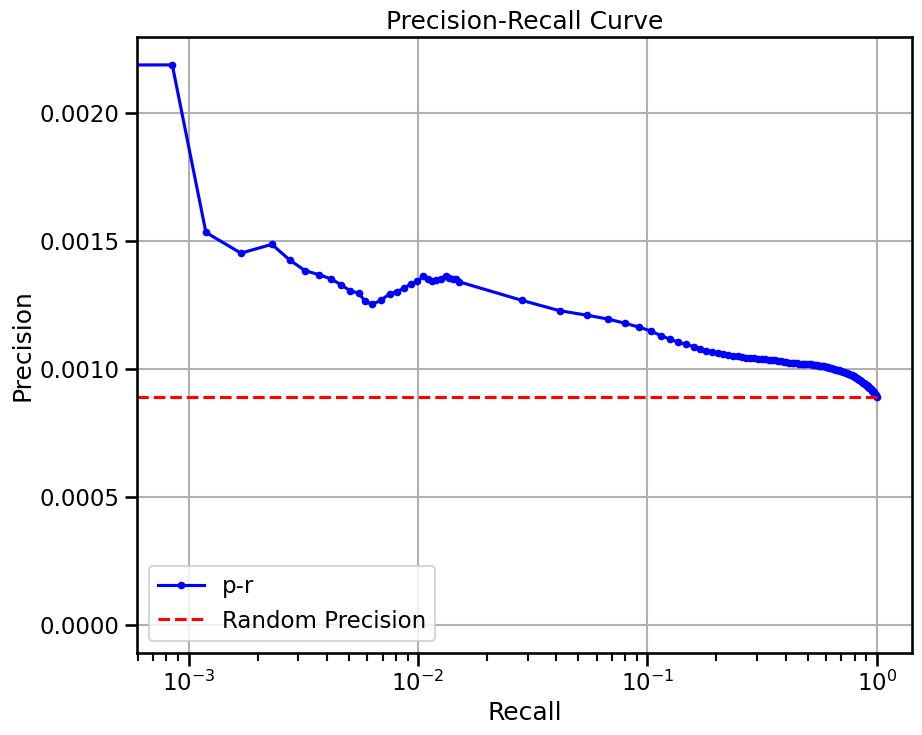


  0%|          | 0/17 [00:00<?, ?it/s]


  6%|▌         | 1/17 [00:03<00:54,  3.44s/it]


 12%|█▏        | 2/17 [00:06<00:45,  3.06s/it]


 18%|█▊        | 3/17 [00:10<00:50,  3.58s/it]


 24%|██▎       | 4/17 [00:12<00:37,  2.87s/it]


 29%|██▉       | 5/17 [00:14<00:31,  2.59s/it]


 35%|███▌      | 6/17 [00:17<00:32,  2.96s/it]


 41%|████      | 7/17 [00:21<00:30,  3.09s/it]


 47%|████▋     | 8/17 [00:23<00:25,  2.81s/it]


 53%|█████▎    | 9/17 [00:25<00:20,  2.59s/it]


 59%|█████▉    | 10/17 [00:27<00:16,  2.31s/it]


 65%|██████▍   | 11/17 [00:29<00:14,  2.41s/it]


 71%|███████   | 12/17 [00:31<00:10,  2.19s/it]


 76%|███████▋  | 13/17 [00:37<00:12,  3.20s/it]


 82%|████████▏ | 14/17 [00:40<00:09,  3.10s/it]


 88%|████████▊ | 15/17 [00:41<00:05,  2.57s/it]


 94%|█████████▍| 16/17 [00:44<00:02,  2.85s/it]


100%|██████████| 17/17 [00:46<00:00,  2.37s/it]


100%|██████████| 17/17 [00:46<00:00,  2.73s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


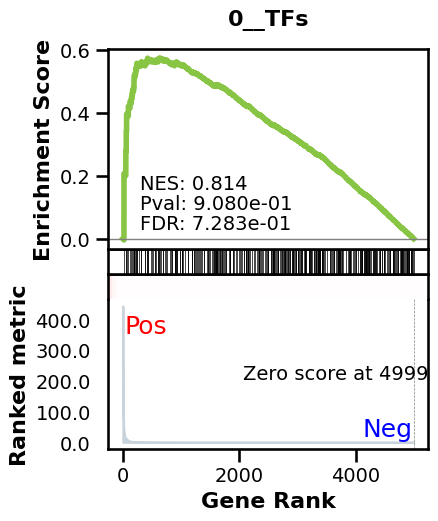

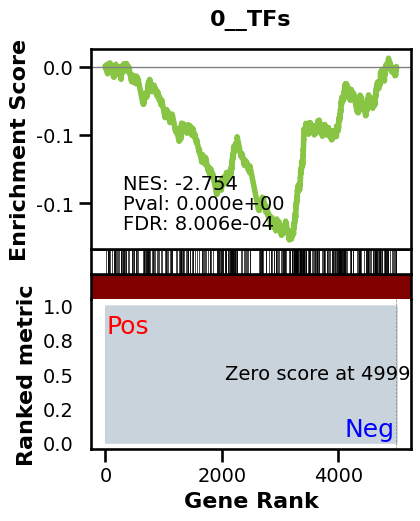

_________________________________________
TF specific enrichment


found some significant results for  23.076923076923077 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3423 genes
intersection pct: 0.6846
precision:  0.0008334948517653389 
recall:  1.0 
random precision: 0.0008337384212719915



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 63.08it/s]


 11%|█         | 14/128 [00:00<00:01, 62.19it/s]


 16%|█▋        | 21/128 [00:00<00:01, 62.13it/s]


 22%|██▏       | 28/128 [00:00<00:01, 62.24it/s]


 27%|██▋       | 35/128 [00:00<00:01, 62.13it/s]


 33%|███▎      | 42/128 [00:00<00:01, 62.16it/s]


 38%|███▊      | 49/128 [00:00<00:01, 62.26it/s]


 44%|████▍     | 56/128 [00:00<00:01, 62.47it/s]


 49%|████▉     | 63/128 [00:01<00:01, 62.54it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 62.06it/s]


 60%|██████    | 77/128 [00:01<00:00, 62.17it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 62.23it/s]


 71%|███████   | 91/128 [00:01<00:00, 62.28it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 61.84it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 62.15it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 62.10it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 62.26it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 62.41it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 62.19it/s]

Average Precision (AP):  0.000899747158513794
Area Under Precision-Recall Curve (AUPRC):  0.0008971103866788577
EPR: 1.9682192241946088


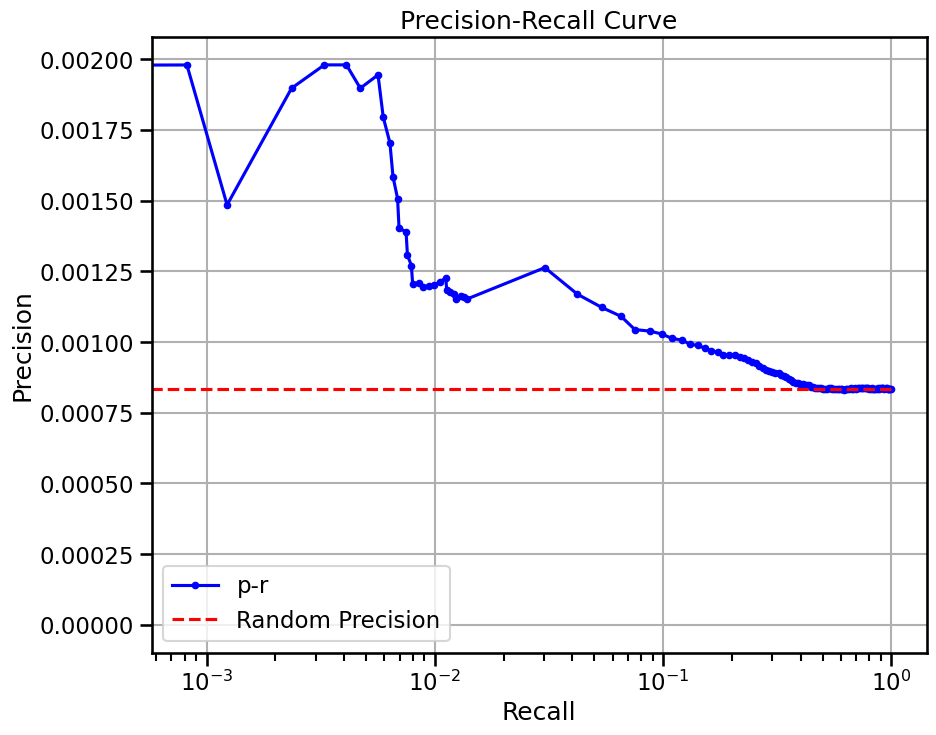

base enrichment


Top central genes: []


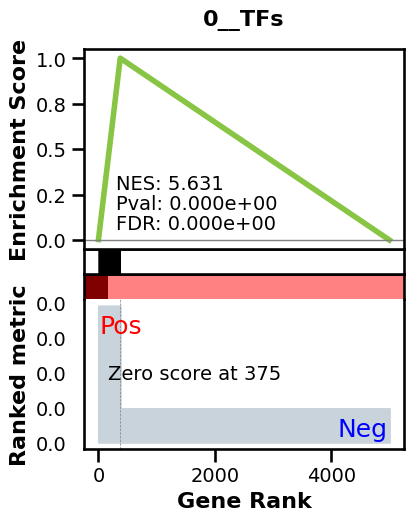

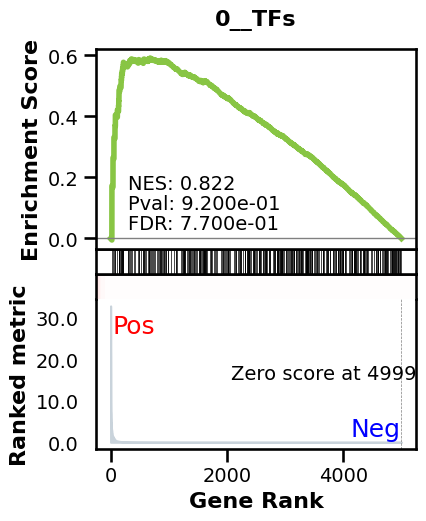

_________________________________________
TF specific enrichment


found some significant results for  3.8461538461538463 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3423 genes
intersection pct: 0.6846
precision:  0.004295594991542786 
recall:  0.4727626459143969 
random precision: 0.0008337384212719915



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 62.17it/s]


 11%|█         | 14/128 [00:00<00:01, 62.01it/s]


 16%|█▋        | 21/128 [00:00<00:01, 62.03it/s]


 22%|██▏       | 28/128 [00:00<00:01, 62.06it/s]


 27%|██▋       | 35/128 [00:00<00:01, 62.18it/s]


 33%|███▎      | 42/128 [00:00<00:01, 61.91it/s]


 38%|███▊      | 49/128 [00:00<00:01, 61.88it/s]


 44%|████▍     | 56/128 [00:00<00:01, 61.93it/s]


 49%|████▉     | 63/128 [00:01<00:01, 62.02it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 61.75it/s]


 60%|██████    | 77/128 [00:01<00:00, 61.86it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 61.81it/s]


 71%|███████   | 91/128 [00:01<00:00, 61.82it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 61.97it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 62.01it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 62.04it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 61.81it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 61.92it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 61.92it/s]

Average Precision (AP):  0.003047007926377257
Area Under Precision-Recall Curve (AUPRC):  0.0026885263680121803
EPR: 9.971629931447707


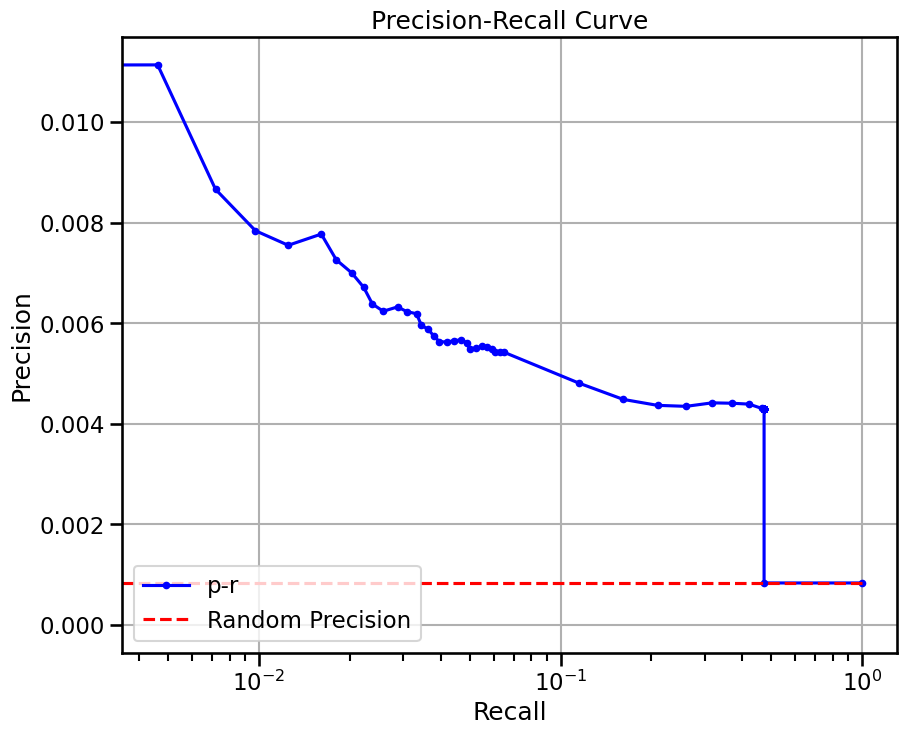

base enrichment


Top central genes: []
The DataFrame contains only the same values.


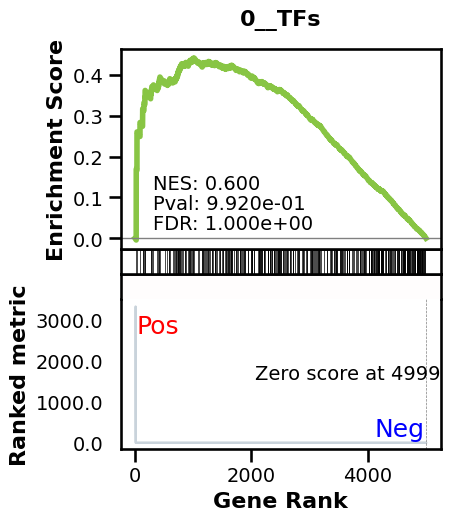

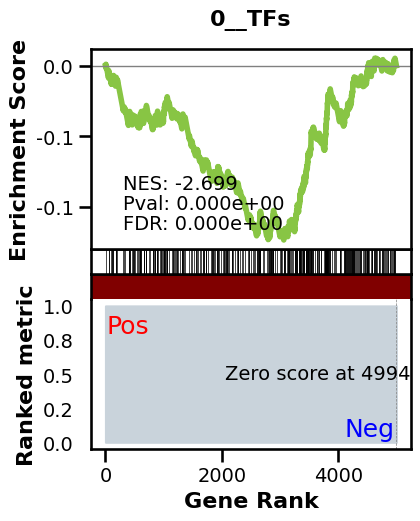

_________________________________________
TF specific enrichment


found some significant results for  7.6923076923076925 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3423 genes
intersection pct: 0.6846
precision:  0.0008334948517653389 
recall:  1.0 
random precision: 0.0008337384212719915



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 62.24it/s]


 11%|█         | 14/128 [00:00<00:01, 61.70it/s]


 16%|█▋        | 21/128 [00:00<00:01, 61.77it/s]


 22%|██▏       | 28/128 [00:00<00:01, 61.55it/s]


 27%|██▋       | 35/128 [00:00<00:01, 61.59it/s]


 33%|███▎      | 42/128 [00:00<00:01, 61.45it/s]


 38%|███▊      | 49/128 [00:00<00:01, 61.60it/s]


 44%|████▍     | 56/128 [00:00<00:01, 61.58it/s]


 49%|████▉     | 63/128 [00:01<00:01, 61.37it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 61.41it/s]


 60%|██████    | 77/128 [00:01<00:00, 61.23it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 61.47it/s]


 71%|███████   | 91/128 [00:01<00:00, 61.23it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 61.32it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 61.63it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 61.67it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 61.84it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 61.93it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 61.54it/s]

Average Precision (AP):  0.0009684761615370829
Area Under Precision-Recall Curve (AUPRC):  0.0009588673532022363
EPR: 5.319019774843278


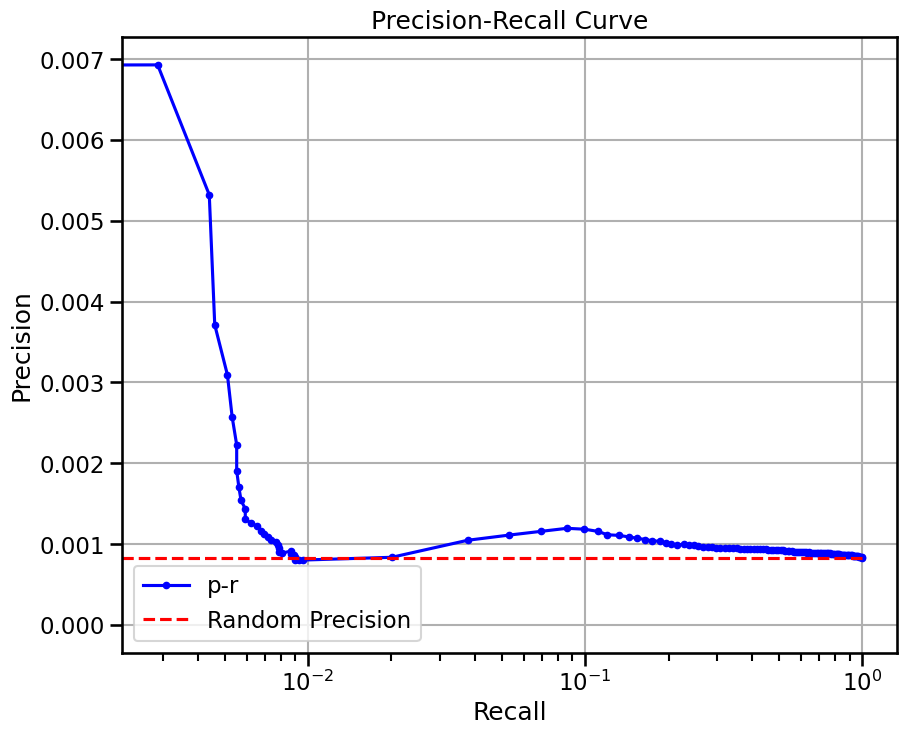

base enrichment


Top central genes: []


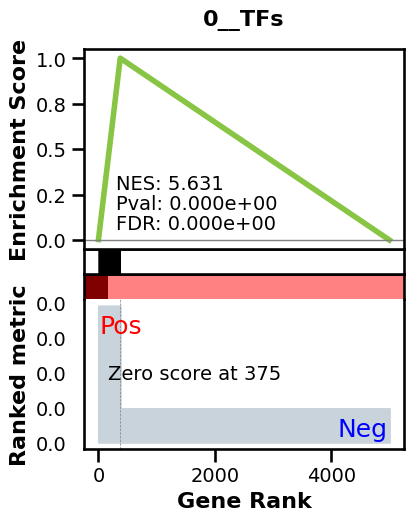

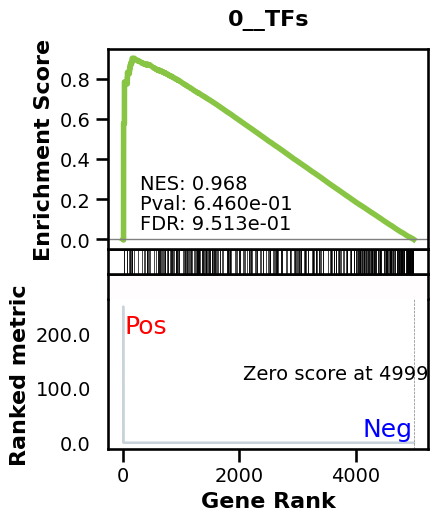

_________________________________________
TF specific enrichment


found some significant results for  3.8461538461538463 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3423 genes
intersection pct: 0.6846
precision:  0.004295594991542786 
recall:  0.4727626459143969 
random precision: 0.0008337384212719915



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 63.25it/s]


 11%|█         | 14/128 [00:00<00:01, 63.47it/s]


 16%|█▋        | 21/128 [00:00<00:01, 63.20it/s]


 22%|██▏       | 28/128 [00:00<00:01, 63.32it/s]


 27%|██▋       | 35/128 [00:00<00:01, 63.39it/s]


 33%|███▎      | 42/128 [00:00<00:01, 63.46it/s]


 38%|███▊      | 49/128 [00:00<00:01, 63.54it/s]


 44%|████▍     | 56/128 [00:00<00:01, 63.35it/s]


 49%|████▉     | 63/128 [00:00<00:01, 63.52it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 63.40it/s]


 60%|██████    | 77/128 [00:01<00:00, 63.33it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 63.05it/s]


 71%|███████   | 91/128 [00:01<00:00, 62.90it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 63.03it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 63.22it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 63.43it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 63.49it/s]


 98%|█████████▊| 126/128 [00:01<00:00, 63.36it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 63.28it/s]

Average Precision (AP):  0.003970596525500093
Area Under Precision-Recall Curve (AUPRC):  0.003497649942138272
EPR: 18.57911694960466


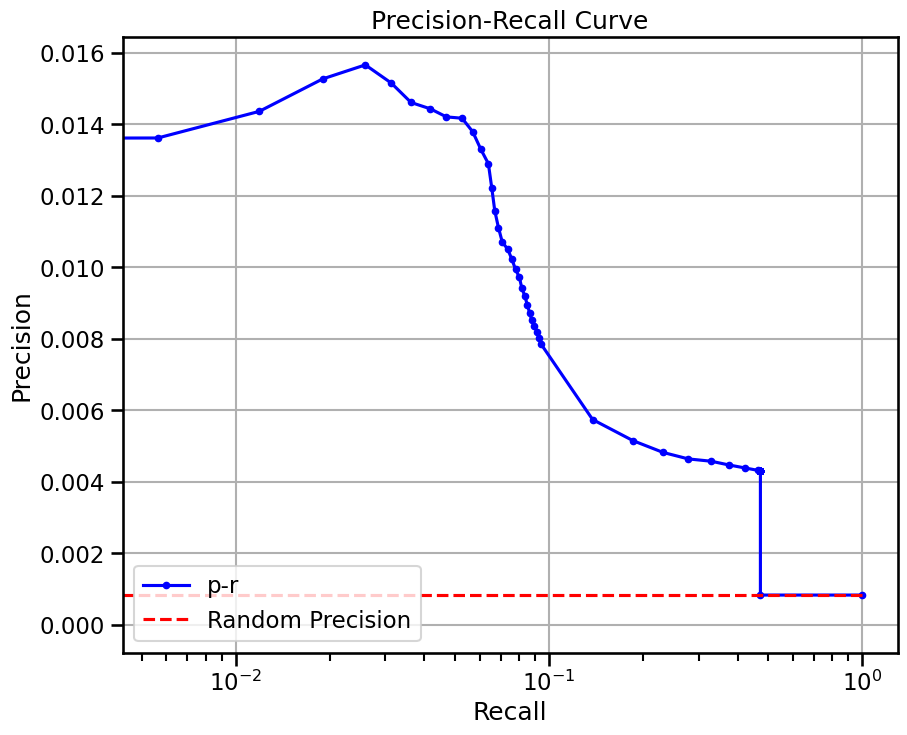


  0%|          | 0/11 [00:00<?, ?it/s]


  9%|▉         | 1/11 [00:05<00:58,  5.83s/it]


 18%|█▊        | 2/11 [00:07<00:31,  3.56s/it]


 27%|██▋       | 3/11 [00:09<00:20,  2.51s/it]


 36%|███▋      | 4/11 [00:10<00:14,  2.05s/it]


 45%|████▌     | 5/11 [00:11<00:09,  1.65s/it]


 55%|█████▍    | 6/11 [00:13<00:08,  1.78s/it]


 64%|██████▎   | 7/11 [00:15<00:06,  1.73s/it]


 73%|███████▎  | 8/11 [00:16<00:04,  1.58s/it]


 82%|████████▏ | 9/11 [00:17<00:03,  1.57s/it]


 91%|█████████ | 10/11 [00:19<00:01,  1.52s/it]


100%|██████████| 11/11 [00:20<00:00,  1.48s/it]


100%|██████████| 11/11 [00:20<00:00,  1.89s/it]

avg link count: 535876201, sparsity: 1.0


base enrichment


too many genes for central computation


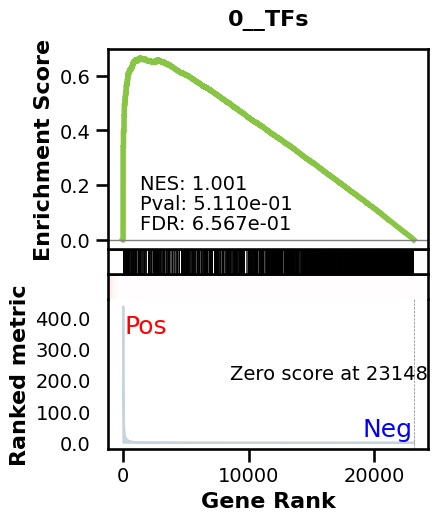

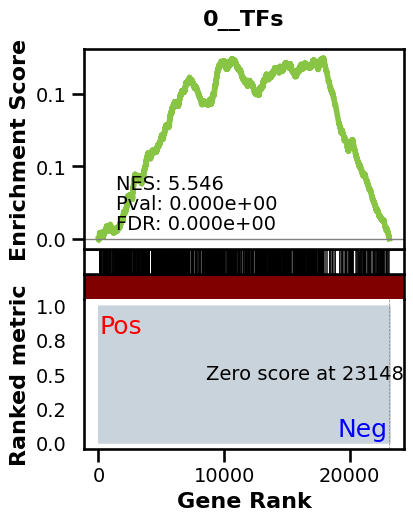

_________________________________________
TF specific enrichment


found some significant results for  60.714285714285715 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:38,  3.28it/s]


  2%|▏         | 2/128 [00:00<00:38,  3.31it/s]


  2%|▏         | 3/128 [00:00<00:37,  3.33it/s]


  3%|▎         | 4/128 [00:01<00:37,  3.33it/s]


  4%|▍         | 5/128 [00:01<00:37,  3.30it/s]


  5%|▍         | 6/128 [00:01<00:36,  3.31it/s]


  5%|▌         | 7/128 [00:02<00:36,  3.31it/s]


  6%|▋         | 8/128 [00:02<00:36,  3.31it/s]


  7%|▋         | 9/128 [00:02<00:35,  3.31it/s]


  8%|▊         | 10/128 [00:03<00:36,  3.20it/s]


  9%|▊         | 11/128 [00:03<00:36,  3.23it/s]


  9%|▉         | 12/128 [00:03<00:35,  3.25it/s]


 10%|█         | 13/128 [00:03<00:35,  3.26it/s]


 11%|█         | 14/128 [00:04<00:34,  3.29it/s]


 12%|█▏        | 15/128 [00:04<00:34,  3.28it/s]


 12%|█▎        | 16/128 [00:04<00:34,  3.29it/s]


 13%|█▎        | 17/128 [00:05<00:33,  3.31it/s]


 14%|█▍        | 18/128 [00:05<00:33,  3.31it/s]


 15%|█▍        | 19/128 [00:05<00:32,  3.31it/s]


 16%|█▌        | 20/128 [00:06<00:32,  3.31it/s]


 16%|█▋        | 21/128 [00:06<00:32,  3.31it/s]


 17%|█▋        | 22/128 [00:06<00:32,  3.31it/s]


 18%|█▊        | 23/128 [00:06<00:31,  3.32it/s]


 19%|█▉        | 24/128 [00:07<00:31,  3.32it/s]


 20%|█▉        | 25/128 [00:07<00:31,  3.31it/s]


 20%|██        | 26/128 [00:07<00:30,  3.32it/s]


 21%|██        | 27/128 [00:08<00:30,  3.33it/s]


 22%|██▏       | 28/128 [00:08<00:29,  3.34it/s]


 23%|██▎       | 29/128 [00:08<00:29,  3.34it/s]


 23%|██▎       | 30/128 [00:09<00:29,  3.34it/s]


 24%|██▍       | 31/128 [00:09<00:29,  3.34it/s]


 25%|██▌       | 32/128 [00:09<00:28,  3.34it/s]


 26%|██▌       | 33/128 [00:09<00:28,  3.34it/s]


 27%|██▋       | 34/128 [00:10<00:28,  3.34it/s]


 27%|██▋       | 35/128 [00:10<00:27,  3.35it/s]


 28%|██▊       | 36/128 [00:10<00:27,  3.36it/s]


 29%|██▉       | 37/128 [00:11<00:27,  3.35it/s]


 30%|██▉       | 38/128 [00:11<00:26,  3.35it/s]


 30%|███       | 39/128 [00:11<00:26,  3.35it/s]


 31%|███▏      | 40/128 [00:12<00:26,  3.35it/s]


 32%|███▏      | 41/128 [00:12<00:25,  3.35it/s]


 33%|███▎      | 42/128 [00:12<00:25,  3.35it/s]


 34%|███▎      | 43/128 [00:12<00:25,  3.34it/s]


 34%|███▍      | 44/128 [00:13<00:25,  3.35it/s]


 35%|███▌      | 45/128 [00:13<00:24,  3.35it/s]


 36%|███▌      | 46/128 [00:13<00:24,  3.36it/s]


 37%|███▋      | 47/128 [00:14<00:24,  3.35it/s]


 38%|███▊      | 48/128 [00:14<00:23,  3.36it/s]


 38%|███▊      | 49/128 [00:14<00:23,  3.36it/s]


 39%|███▉      | 50/128 [00:15<00:23,  3.36it/s]


 40%|███▉      | 51/128 [00:15<00:22,  3.37it/s]


 41%|████      | 52/128 [00:15<00:22,  3.36it/s]


 41%|████▏     | 53/128 [00:15<00:22,  3.36it/s]


 42%|████▏     | 54/128 [00:16<00:22,  3.35it/s]


 43%|████▎     | 55/128 [00:16<00:21,  3.35it/s]


 44%|████▍     | 56/128 [00:16<00:21,  3.34it/s]


 45%|████▍     | 57/128 [00:17<00:21,  3.34it/s]


 45%|████▌     | 58/128 [00:17<00:21,  3.33it/s]


 46%|████▌     | 59/128 [00:17<00:20,  3.34it/s]


 47%|████▋     | 60/128 [00:18<00:20,  3.34it/s]


 48%|████▊     | 61/128 [00:18<00:20,  3.35it/s]


 48%|████▊     | 62/128 [00:18<00:19,  3.35it/s]


 49%|████▉     | 63/128 [00:18<00:19,  3.35it/s]


 50%|█████     | 64/128 [00:19<00:19,  3.36it/s]


 51%|█████     | 65/128 [00:19<00:18,  3.36it/s]


 52%|█████▏    | 66/128 [00:19<00:18,  3.36it/s]


 52%|█████▏    | 67/128 [00:20<00:18,  3.37it/s]


 53%|█████▎    | 68/128 [00:20<00:17,  3.36it/s]


 54%|█████▍    | 69/128 [00:20<00:17,  3.36it/s]


 55%|█████▍    | 70/128 [00:21<00:17,  3.35it/s]


 55%|█████▌    | 71/128 [00:21<00:17,  3.35it/s]


 56%|█████▋    | 72/128 [00:21<00:16,  3.35it/s]


 57%|█████▋    | 73/128 [00:21<00:16,  3.34it/s]


 58%|█████▊    | 74/128 [00:22<00:16,  3.35it/s]


 59%|█████▊    | 75/128 [00:22<00:15,  3.35it/s]


 59%|█████▉    | 76/128 [00:22<00:15,  3.35it/s]


 60%|██████    | 77/128 [00:23<00:15,  3.35it/s]


 61%|██████    | 78/128 [00:23<00:14,  3.35it/s]


 62%|██████▏   | 79/128 [00:23<00:14,  3.34it/s]


 62%|██████▎   | 80/128 [00:24<00:14,  3.34it/s]


 63%|██████▎   | 81/128 [00:24<00:14,  3.34it/s]


 64%|██████▍   | 82/128 [00:24<00:13,  3.35it/s]


 65%|██████▍   | 83/128 [00:24<00:13,  3.33it/s]


 66%|██████▌   | 84/128 [00:25<00:13,  3.34it/s]


 66%|██████▋   | 85/128 [00:25<00:12,  3.33it/s]


 67%|██████▋   | 86/128 [00:25<00:12,  3.33it/s]


 68%|██████▊   | 87/128 [00:26<00:12,  3.33it/s]


 69%|██████▉   | 88/128 [00:26<00:12,  3.33it/s]


 70%|██████▉   | 89/128 [00:26<00:11,  3.32it/s]


 70%|███████   | 90/128 [00:27<00:11,  3.31it/s]


 71%|███████   | 91/128 [00:27<00:11,  3.32it/s]


 72%|███████▏  | 92/128 [00:27<00:10,  3.31it/s]


 73%|███████▎  | 93/128 [00:27<00:10,  3.31it/s]


 73%|███████▎  | 94/128 [00:28<00:10,  3.33it/s]


 74%|███████▍  | 95/128 [00:28<00:09,  3.34it/s]


 75%|███████▌  | 96/128 [00:28<00:09,  3.35it/s]


 76%|███████▌  | 97/128 [00:29<00:09,  3.35it/s]


 77%|███████▋  | 98/128 [00:29<00:08,  3.34it/s]


 77%|███████▋  | 99/128 [00:29<00:08,  3.33it/s]


 78%|███████▊  | 100/128 [00:30<00:08,  3.34it/s]


 79%|███████▉  | 101/128 [00:30<00:08,  3.34it/s]


 80%|███████▉  | 102/128 [00:30<00:07,  3.33it/s]


 80%|████████  | 103/128 [00:30<00:07,  3.33it/s]


 81%|████████▏ | 104/128 [00:31<00:07,  3.33it/s]


 82%|████████▏ | 105/128 [00:31<00:06,  3.33it/s]


 83%|████████▎ | 106/128 [00:31<00:06,  3.33it/s]


 84%|████████▎ | 107/128 [00:32<00:06,  3.33it/s]


 84%|████████▍ | 108/128 [00:32<00:06,  3.33it/s]


 85%|████████▌ | 109/128 [00:32<00:05,  3.34it/s]


 86%|████████▌ | 110/128 [00:33<00:05,  3.34it/s]


 87%|████████▋ | 111/128 [00:33<00:05,  3.34it/s]


 88%|████████▊ | 112/128 [00:33<00:04,  3.34it/s]


 88%|████████▊ | 113/128 [00:33<00:04,  3.34it/s]


 89%|████████▉ | 114/128 [00:34<00:04,  3.35it/s]


 90%|████████▉ | 115/128 [00:34<00:03,  3.34it/s]


 91%|█████████ | 116/128 [00:34<00:03,  3.34it/s]


 91%|█████████▏| 117/128 [00:35<00:03,  3.34it/s]


 92%|█████████▏| 118/128 [00:35<00:03,  3.33it/s]


 93%|█████████▎| 119/128 [00:35<00:02,  3.33it/s]


 94%|█████████▍| 120/128 [00:36<00:02,  3.33it/s]


 95%|█████████▍| 121/128 [00:36<00:02,  3.35it/s]


 95%|█████████▌| 122/128 [00:36<00:01,  3.36it/s]


 96%|█████████▌| 123/128 [00:36<00:01,  3.34it/s]


 97%|█████████▋| 124/128 [00:37<00:01,  3.35it/s]


 98%|█████████▊| 125/128 [00:37<00:00,  3.35it/s]


 98%|█████████▊| 126/128 [00:37<00:00,  3.36it/s]


 99%|█████████▉| 127/128 [00:38<00:00,  3.36it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:38<00:00,  3.36it/s]


100%|██████████| 128/128 [00:38<00:00,  3.33it/s]

Average Precision (AP):  0.0010515293925700347
Area Under Precision-Recall Curve (AUPRC):  0.0010510453673885718


EPR: 1.8433840708355442


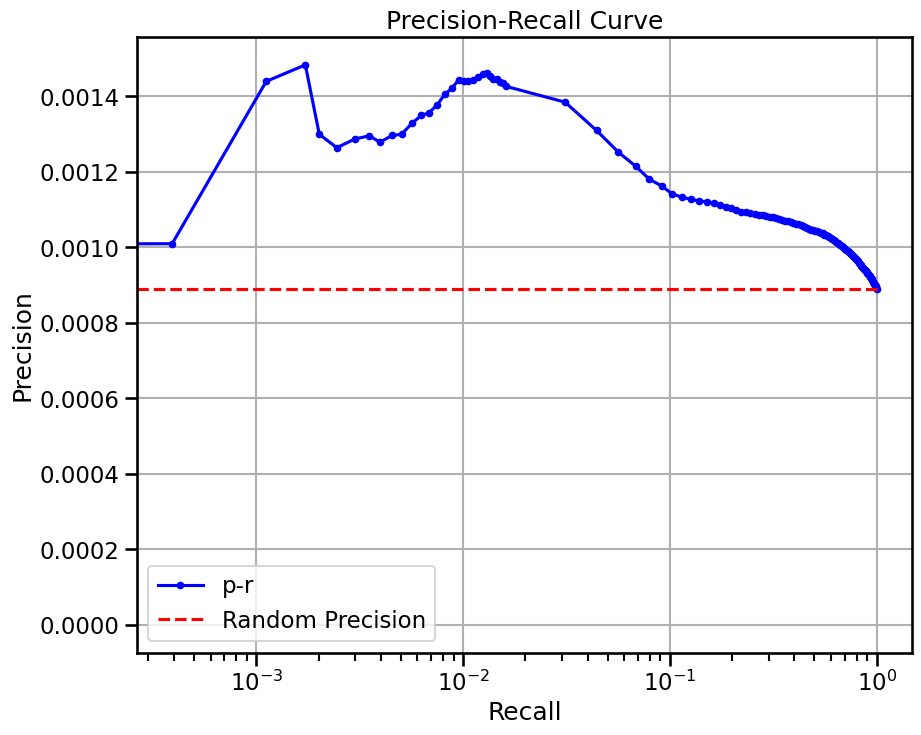


  0%|          | 0/22 [00:00<?, ?it/s]


  5%|▍         | 1/22 [00:02<00:59,  2.85s/it]


  9%|▉         | 2/22 [00:04<00:38,  1.91s/it]


 14%|█▎        | 3/22 [00:05<00:30,  1.60s/it]


 18%|█▊        | 4/22 [00:06<00:26,  1.48s/it]


 23%|██▎       | 5/22 [00:07<00:24,  1.41s/it]


 27%|██▋       | 6/22 [00:09<00:21,  1.35s/it]


 32%|███▏      | 7/22 [00:10<00:19,  1.31s/it]


 36%|███▋      | 8/22 [00:11<00:18,  1.32s/it]


 41%|████      | 9/22 [00:13<00:17,  1.31s/it]


 45%|████▌     | 10/22 [00:14<00:15,  1.30s/it]


 50%|█████     | 11/22 [00:15<00:14,  1.30s/it]


 55%|█████▍    | 12/22 [00:17<00:13,  1.37s/it]


 59%|█████▉    | 13/22 [00:18<00:12,  1.36s/it]


 64%|██████▎   | 14/22 [00:19<00:10,  1.34s/it]


 68%|██████▊   | 15/22 [00:21<00:10,  1.45s/it]


 73%|███████▎  | 16/22 [00:23<00:08,  1.48s/it]


 77%|███████▋  | 17/22 [00:24<00:07,  1.42s/it]


 82%|████████▏ | 18/22 [00:25<00:05,  1.36s/it]


 86%|████████▋ | 19/22 [00:26<00:04,  1.33s/it]


 91%|█████████ | 20/22 [00:28<00:02,  1.31s/it]


 95%|█████████▌| 21/22 [00:29<00:01,  1.36s/it]


100%|██████████| 22/22 [00:30<00:00,  1.22s/it]


100%|██████████| 22/22 [00:30<00:00,  1.40s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


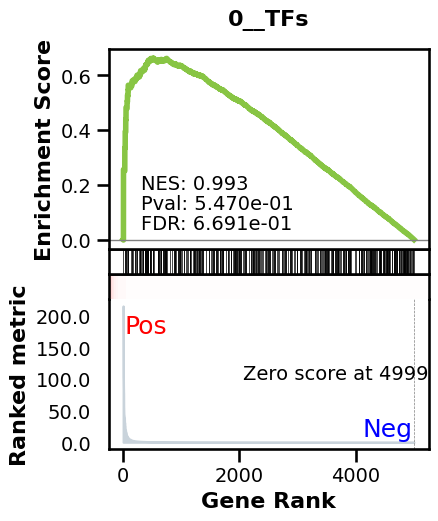

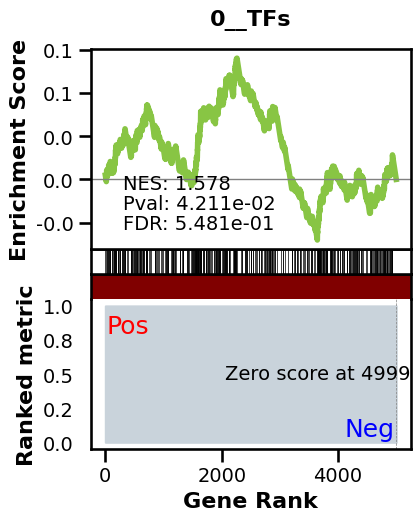

_________________________________________
TF specific enrichment


found some significant results for  12.5 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3518 genes
intersection pct: 0.7036
precision:  0.0012585320164533508 
recall:  1.0 
random precision: 0.001258889858937415



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 49.97it/s]


  8%|▊         | 10/128 [00:00<00:02, 49.69it/s]


 12%|█▏        | 15/128 [00:00<00:02, 49.71it/s]


 16%|█▌        | 20/128 [00:00<00:02, 49.75it/s]


 20%|█▉        | 25/128 [00:00<00:02, 49.63it/s]


 24%|██▍       | 31/128 [00:00<00:01, 50.23it/s]


 29%|██▉       | 37/128 [00:00<00:01, 50.11it/s]


 34%|███▎      | 43/128 [00:00<00:01, 50.02it/s]


 38%|███▊      | 49/128 [00:00<00:01, 50.01it/s]


 42%|████▏     | 54/128 [00:01<00:01, 49.91it/s]


 46%|████▌     | 59/128 [00:01<00:01, 49.85it/s]


 50%|█████     | 64/128 [00:01<00:01, 49.81it/s]


 54%|█████▍    | 69/128 [00:01<00:01, 49.82it/s]


 58%|█████▊    | 74/128 [00:01<00:01, 49.78it/s]


 62%|██████▎   | 80/128 [00:01<00:00, 50.21it/s]


 67%|██████▋   | 86/128 [00:01<00:00, 50.17it/s]


 72%|███████▏  | 92/128 [00:01<00:00, 50.02it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 49.92it/s]


 80%|████████  | 103/128 [00:02<00:00, 49.93it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 49.90it/s]


 88%|████████▊ | 113/128 [00:02<00:00, 49.85it/s]


 92%|█████████▏| 118/128 [00:02<00:00, 49.80it/s]


 96%|█████████▌| 123/128 [00:02<00:00, 49.73it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:02<00:00, 49.75it/s]


100%|██████████| 128/128 [00:02<00:00, 49.88it/s]

Average Precision (AP):  0.0014028690491749987
Area Under Precision-Recall Curve (AUPRC):  0.0014015066352564994
EPR: 0.6624155847472746


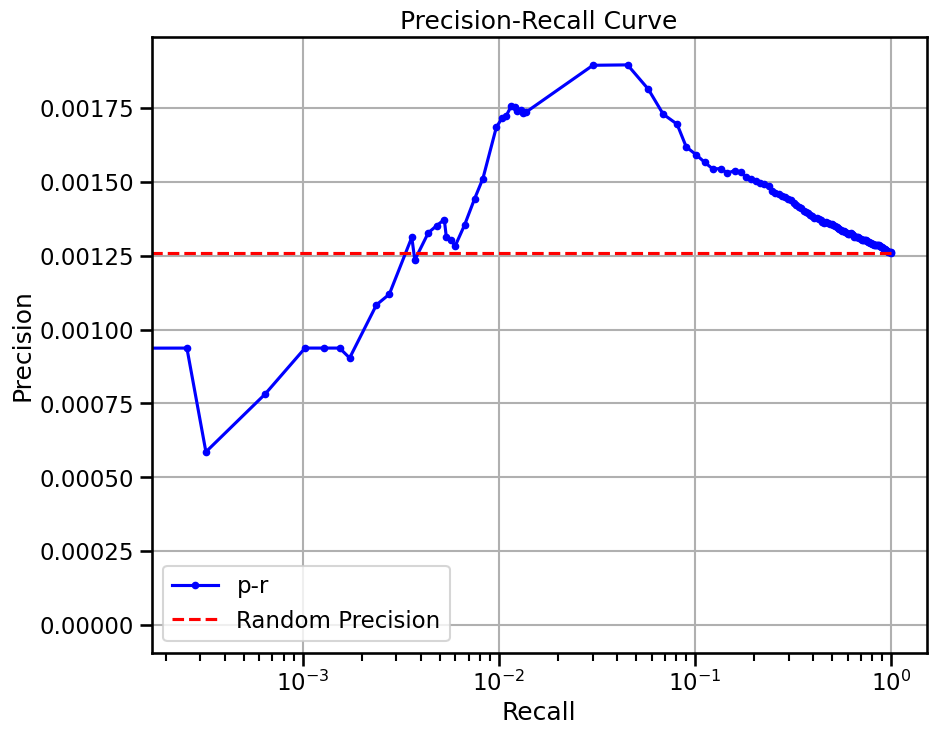

base enrichment


Top central genes: []


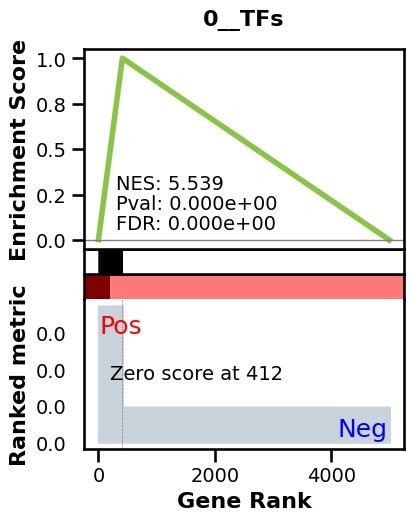

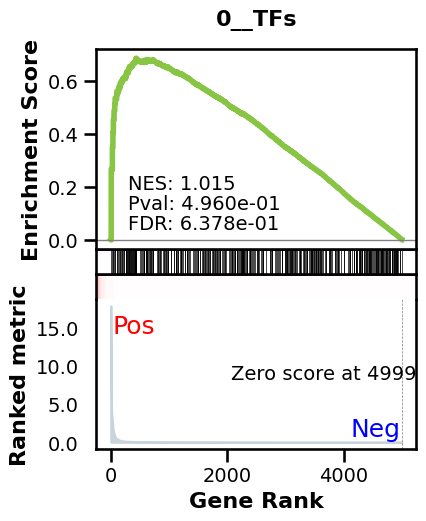

_________________________________________
TF specific enrichment


found some significant results for  9.375 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3518 genes
intersection pct: 0.7036
precision:  0.005945748396004223 
recall:  0.4700179763739086 
random precision: 0.001258889858937415



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 56.95it/s]


  9%|▉         | 12/128 [00:00<00:02, 56.89it/s]


 14%|█▍        | 18/128 [00:00<00:01, 56.84it/s]


 19%|█▉        | 24/128 [00:00<00:01, 56.83it/s]


 23%|██▎       | 30/128 [00:00<00:01, 56.72it/s]


 28%|██▊       | 36/128 [00:00<00:01, 56.70it/s]


 33%|███▎      | 42/128 [00:00<00:01, 56.71it/s]


 38%|███▊      | 48/128 [00:00<00:01, 56.75it/s]


 42%|████▏     | 54/128 [00:00<00:01, 56.77it/s]


 47%|████▋     | 60/128 [00:01<00:01, 56.80it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 56.84it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 56.83it/s]


 61%|██████    | 78/128 [00:01<00:00, 56.83it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 56.57it/s]


 70%|███████   | 90/128 [00:01<00:00, 56.66it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 56.66it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 56.71it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 56.71it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 56.28it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 56.46it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 56.52it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 56.65it/s]

Average Precision (AP):  0.004349661146410022
Area Under Precision-Recall Curve (AUPRC):  0.003924508615983171
EPR: 6.9881310342455984


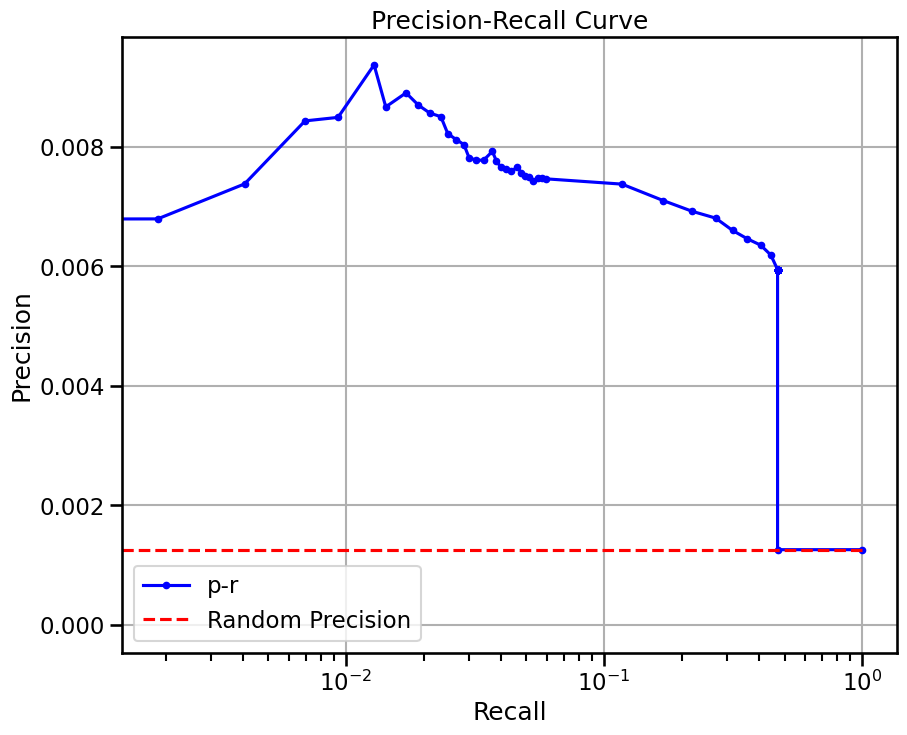

base enrichment


Top central genes: []
The DataFrame contains only the same values.


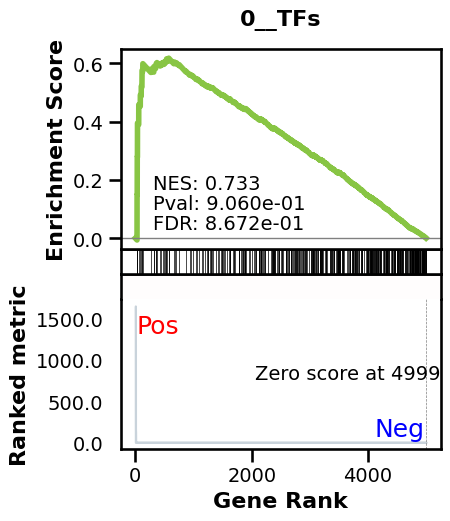

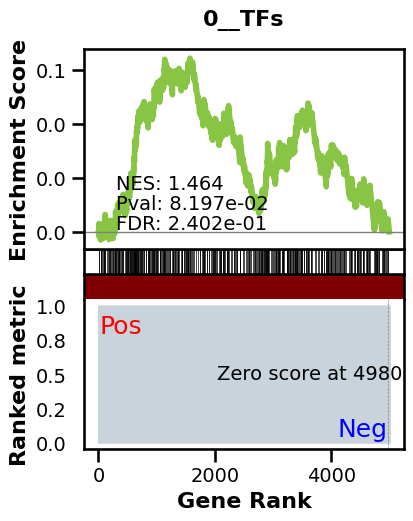

_________________________________________
TF specific enrichment


found some significant results for  6.25 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3518 genes
intersection pct: 0.7036
precision:  0.0012585320164533508 
recall:  1.0 
random precision: 0.001258889858937415



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 50.75it/s]


  9%|▉         | 12/128 [00:00<00:02, 50.85it/s]


 14%|█▍        | 18/128 [00:00<00:02, 50.39it/s]


 19%|█▉        | 24/128 [00:00<00:02, 50.66it/s]


 23%|██▎       | 30/128 [00:00<00:01, 50.56it/s]


 28%|██▊       | 36/128 [00:00<00:01, 50.45it/s]


 33%|███▎      | 42/128 [00:00<00:01, 50.31it/s]


 38%|███▊      | 48/128 [00:00<00:01, 50.33it/s]


 42%|████▏     | 54/128 [00:01<00:01, 50.42it/s]


 47%|████▋     | 60/128 [00:01<00:01, 50.44it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 50.41it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 50.33it/s]


 61%|██████    | 78/128 [00:01<00:00, 50.41it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 50.44it/s]


 70%|███████   | 90/128 [00:01<00:00, 50.53it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 50.33it/s]


 80%|███████▉  | 102/128 [00:02<00:00, 50.33it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 50.39it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 50.31it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 50.24it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 50.43it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 50.40it/s]

Average Precision (AP):  0.0018889537390434357
Area Under Precision-Recall Curve (AUPRC):  0.0018893867841103503
EPR: 1.7371594010847209


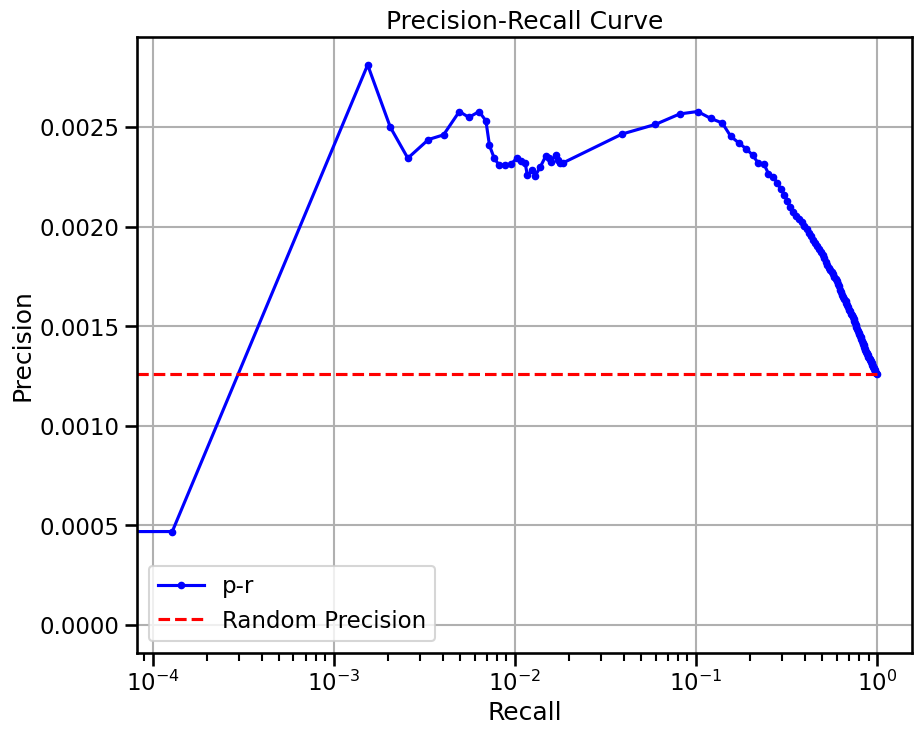

base enrichment


Top central genes: []


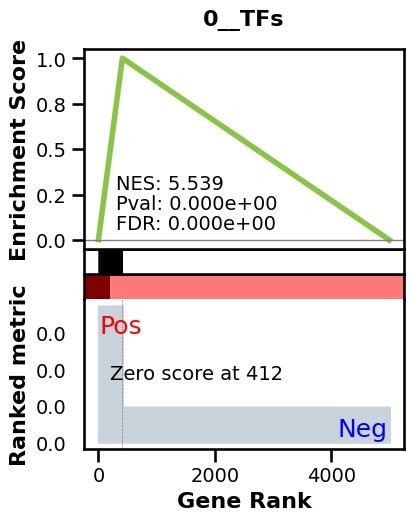

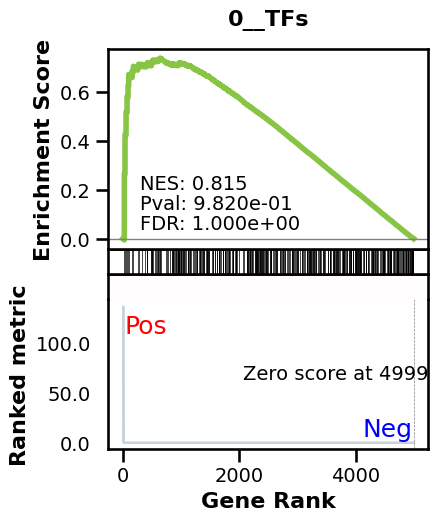

_________________________________________
TF specific enrichment


found some significant results for  4.6875 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3518 genes
intersection pct: 0.7036
precision:  0.005945748396004223 
recall:  0.4700179763739086 
random precision: 0.001258889858937415



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 57.10it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.97it/s]


 14%|█▍        | 18/128 [00:00<00:01, 56.47it/s]


 19%|█▉        | 24/128 [00:00<00:01, 56.65it/s]


 23%|██▎       | 30/128 [00:00<00:01, 56.81it/s]


 28%|██▊       | 36/128 [00:00<00:01, 56.89it/s]


 33%|███▎      | 42/128 [00:00<00:01, 56.87it/s]


 38%|███▊      | 48/128 [00:00<00:01, 56.93it/s]


 42%|████▏     | 54/128 [00:00<00:01, 56.90it/s]


 47%|████▋     | 60/128 [00:01<00:01, 56.90it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 56.94it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 56.96it/s]


 61%|██████    | 78/128 [00:01<00:00, 56.94it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 56.96it/s]


 70%|███████   | 90/128 [00:01<00:00, 56.96it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 56.99it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 57.04it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 57.01it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 57.05it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 57.08it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 57.03it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 56.89it/s]

Average Precision (AP):  0.006009419277470047
Area Under Precision-Recall Curve (AUPRC):  0.0055711118745016
EPR: 12.3237295387727


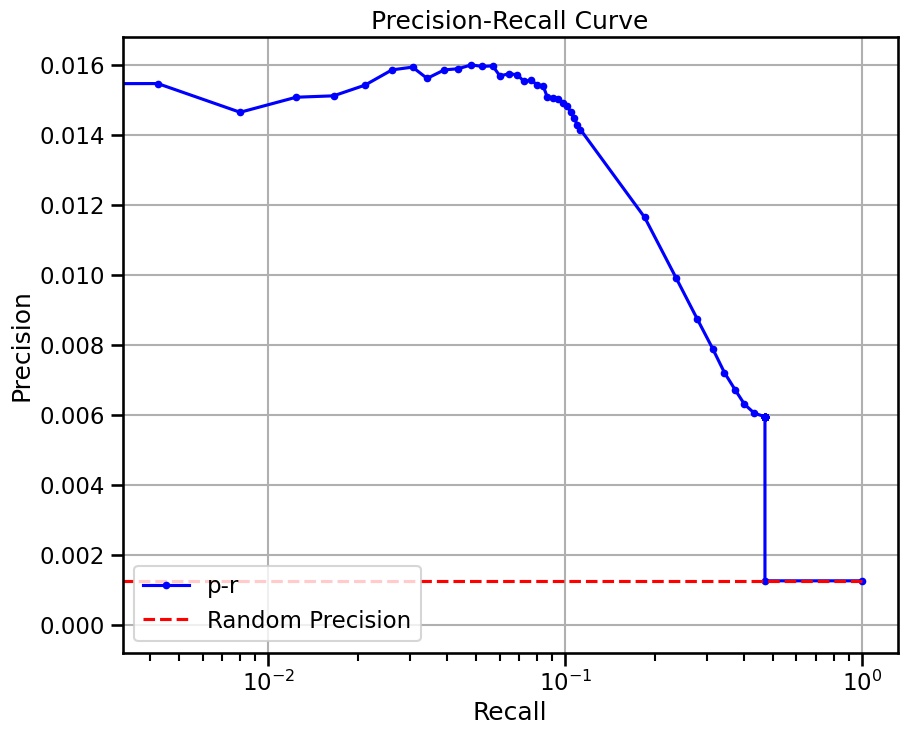


  0%|          | 0/1 [00:00<?, ?it/s]


100%|██████████| 1/1 [00:05<00:00,  5.56s/it]


100%|██████████| 1/1 [00:05<00:00,  5.82s/it]

avg link count: 100100025, sparsity: 1.0


base enrichment
too many genes for central computation


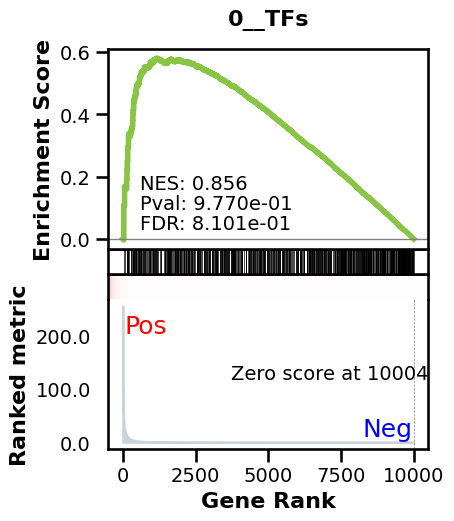

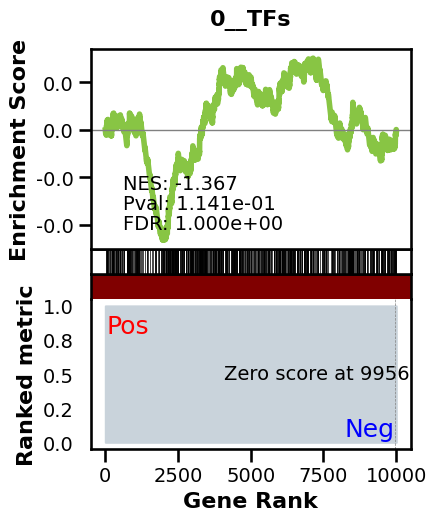

_________________________________________
TF specific enrichment


found some significant results for  36.507936507936506 % TFs

_________________________________________
loading GT,  omnipath


intersection of 5827 genes
intersection pct: 0.5824087956021989
precision:  0.0010894762723925116 
recall:  1.0 
random precision: 0.0010896632748422872



  0%|          | 0/128 [00:00<?, ?it/s]


  2%|▏         | 2/128 [00:00<00:06, 19.46it/s]


  3%|▎         | 4/128 [00:00<00:06, 19.17it/s]


  5%|▍         | 6/128 [00:00<00:06, 19.23it/s]


  6%|▋         | 8/128 [00:00<00:06, 19.27it/s]


  8%|▊         | 10/128 [00:00<00:06, 19.30it/s]


  9%|▉         | 12/128 [00:00<00:05, 19.34it/s]


 11%|█         | 14/128 [00:00<00:05, 19.34it/s]


 12%|█▎        | 16/128 [00:00<00:05, 19.25it/s]


 14%|█▍        | 18/128 [00:00<00:05, 19.26it/s]


 16%|█▌        | 20/128 [00:01<00:05, 19.24it/s]


 17%|█▋        | 22/128 [00:01<00:05, 19.23it/s]


 19%|█▉        | 24/128 [00:01<00:05, 19.19it/s]


 20%|██        | 26/128 [00:01<00:05, 19.20it/s]


 22%|██▏       | 28/128 [00:01<00:05, 19.27it/s]


 23%|██▎       | 30/128 [00:01<00:05, 19.23it/s]


 25%|██▌       | 32/128 [00:01<00:04, 19.27it/s]


 27%|██▋       | 34/128 [00:01<00:04, 19.27it/s]


 28%|██▊       | 36/128 [00:01<00:04, 19.27it/s]


 30%|██▉       | 38/128 [00:01<00:04, 19.31it/s]


 31%|███▏      | 40/128 [00:02<00:04, 19.34it/s]


 33%|███▎      | 42/128 [00:02<00:04, 19.31it/s]


 34%|███▍      | 44/128 [00:02<00:04, 19.31it/s]


 36%|███▌      | 46/128 [00:02<00:04, 19.40it/s]


 38%|███▊      | 48/128 [00:02<00:04, 19.48it/s]


 39%|███▉      | 50/128 [00:02<00:03, 19.54it/s]


 41%|████      | 52/128 [00:02<00:03, 19.56it/s]


 42%|████▏     | 54/128 [00:02<00:03, 19.61it/s]


 44%|████▍     | 56/128 [00:02<00:03, 19.62it/s]


 45%|████▌     | 58/128 [00:02<00:03, 19.62it/s]


 47%|████▋     | 60/128 [00:03<00:03, 19.66it/s]


 48%|████▊     | 62/128 [00:03<00:03, 19.68it/s]


 50%|█████     | 64/128 [00:03<00:03, 19.50it/s]


 52%|█████▏    | 66/128 [00:03<00:03, 19.59it/s]


 53%|█████▎    | 68/128 [00:03<00:03, 19.61it/s]


 55%|█████▍    | 70/128 [00:03<00:02, 19.65it/s]


 56%|█████▋    | 72/128 [00:03<00:02, 19.72it/s]


 58%|█████▊    | 74/128 [00:03<00:02, 19.43it/s]


 59%|█████▉    | 76/128 [00:03<00:02, 19.49it/s]


 61%|██████    | 78/128 [00:04<00:02, 19.58it/s]


 62%|██████▎   | 80/128 [00:04<00:02, 19.65it/s]


 64%|██████▍   | 82/128 [00:04<00:02, 19.67it/s]


 66%|██████▌   | 84/128 [00:04<00:02, 19.68it/s]


 67%|██████▋   | 86/128 [00:04<00:02, 19.67it/s]


 69%|██████▉   | 88/128 [00:04<00:02, 19.66it/s]


 70%|███████   | 90/128 [00:04<00:01, 19.65it/s]


 72%|███████▏  | 92/128 [00:04<00:01, 19.62it/s]


 73%|███████▎  | 94/128 [00:04<00:01, 19.59it/s]


 75%|███████▌  | 96/128 [00:04<00:01, 19.59it/s]


 77%|███████▋  | 98/128 [00:05<00:01, 19.61it/s]


 78%|███████▊  | 100/128 [00:05<00:01, 19.62it/s]


 80%|███████▉  | 102/128 [00:05<00:01, 19.64it/s]


 81%|████████▏ | 104/128 [00:05<00:01, 19.62it/s]


 83%|████████▎ | 106/128 [00:05<00:01, 19.57it/s]


 84%|████████▍ | 108/128 [00:05<00:01, 19.60it/s]


 86%|████████▌ | 110/128 [00:05<00:00, 19.62it/s]


 88%|████████▊ | 112/128 [00:05<00:00, 19.64it/s]


 89%|████████▉ | 114/128 [00:05<00:00, 19.65it/s]


 91%|█████████ | 116/128 [00:05<00:00, 19.62it/s]


 92%|█████████▏| 118/128 [00:06<00:00, 19.64it/s]


 94%|█████████▍| 120/128 [00:06<00:00, 19.59it/s]


 95%|█████████▌| 122/128 [00:06<00:00, 19.54it/s]


 97%|█████████▋| 124/128 [00:06<00:00, 19.52it/s]


 98%|█████████▊| 126/128 [00:06<00:00, 19.53it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:06<00:00, 19.52it/s]


100%|██████████| 128/128 [00:06<00:00, 19.49it/s]

Average Precision (AP):  0.0012075645232777644
Area Under Precision-Recall Curve (AUPRC):  0.0012076968280973165


EPR: 1.340650869779844


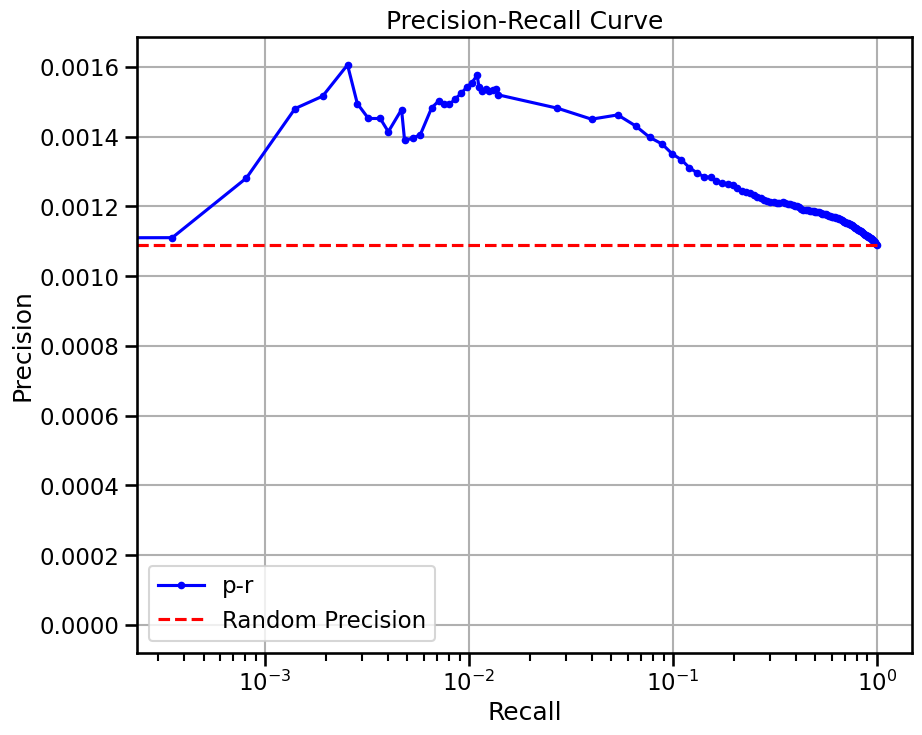


  0%|          | 0/1 [00:00<?, ?it/s]


100%|██████████| 1/1 [00:07<00:00,  7.19s/it]


100%|██████████| 1/1 [00:07<00:00,  7.43s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


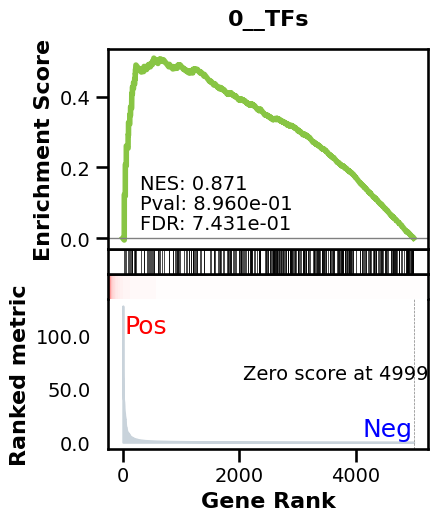

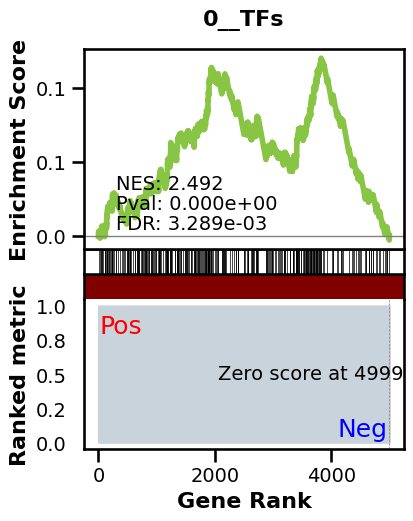

_________________________________________
TF specific enrichment


found some significant results for  28.125 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2812 genes
intersection pct: 0.5624
precision:  0.0010440926814363964 
recall:  1.0 
random precision: 0.0010444641124863559



  0%|          | 0/128 [00:00<?, ?it/s]


  8%|▊         | 10/128 [00:00<00:01, 91.49it/s]


 16%|█▌        | 20/128 [00:00<00:01, 91.42it/s]


 23%|██▎       | 30/128 [00:00<00:01, 91.39it/s]


 31%|███▏      | 40/128 [00:00<00:00, 91.00it/s]


 39%|███▉      | 50/128 [00:00<00:00, 91.19it/s]


 47%|████▋     | 60/128 [00:00<00:00, 91.30it/s]


 55%|█████▍    | 70/128 [00:00<00:00, 91.35it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 91.32it/s]


 70%|███████   | 90/128 [00:00<00:00, 91.31it/s]


 78%|███████▊  | 100/128 [00:01<00:00, 91.44it/s]


 86%|████████▌ | 110/128 [00:01<00:00, 91.45it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 91.42it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 91.31it/s]

Average Precision (AP):  0.0013487486901086058
Area Under Precision-Recall Curve (AUPRC):  0.001348506340494253
EPR: 0.463350649405576


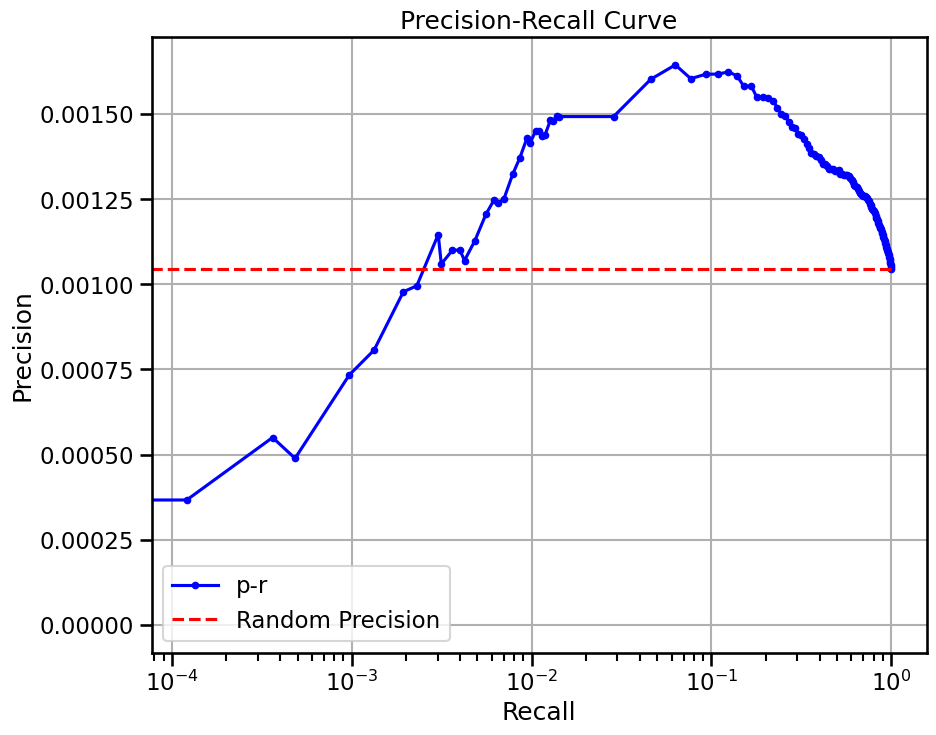

base enrichment


Top central genes: []


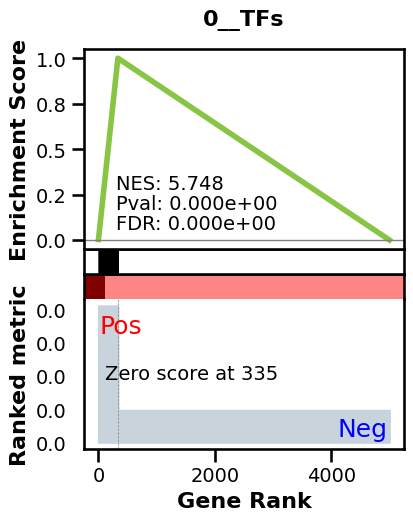

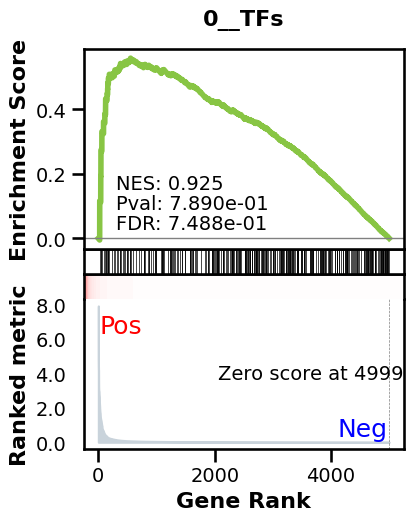

_________________________________________
TF specific enrichment


found some significant results for  6.25 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2812 genes
intersection pct: 0.5624
precision:  0.005769883888623644 
recall:  0.5679505813953488 
random precision: 0.0010444641124863559



  0%|          | 0/128 [00:00<?, ?it/s]


  8%|▊         | 10/128 [00:00<00:01, 92.12it/s]


 16%|█▌        | 20/128 [00:00<00:01, 91.33it/s]


 23%|██▎       | 30/128 [00:00<00:01, 91.31it/s]


 31%|███▏      | 40/128 [00:00<00:00, 91.55it/s]


 39%|███▉      | 50/128 [00:00<00:00, 91.66it/s]


 47%|████▋     | 60/128 [00:00<00:00, 91.43it/s]


 55%|█████▍    | 70/128 [00:00<00:00, 91.49it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 91.44it/s]


 70%|███████   | 90/128 [00:00<00:00, 91.30it/s]


 78%|███████▊  | 100/128 [00:01<00:00, 90.93it/s]


 86%|████████▌ | 110/128 [00:01<00:00, 90.49it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 90.08it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:01<00:00, 90.87it/s]

Average Precision (AP):  0.005543112322723293
Area Under Precision-Recall Curve (AUPRC):  0.0052320452336782515
EPR: 10.767181339856279


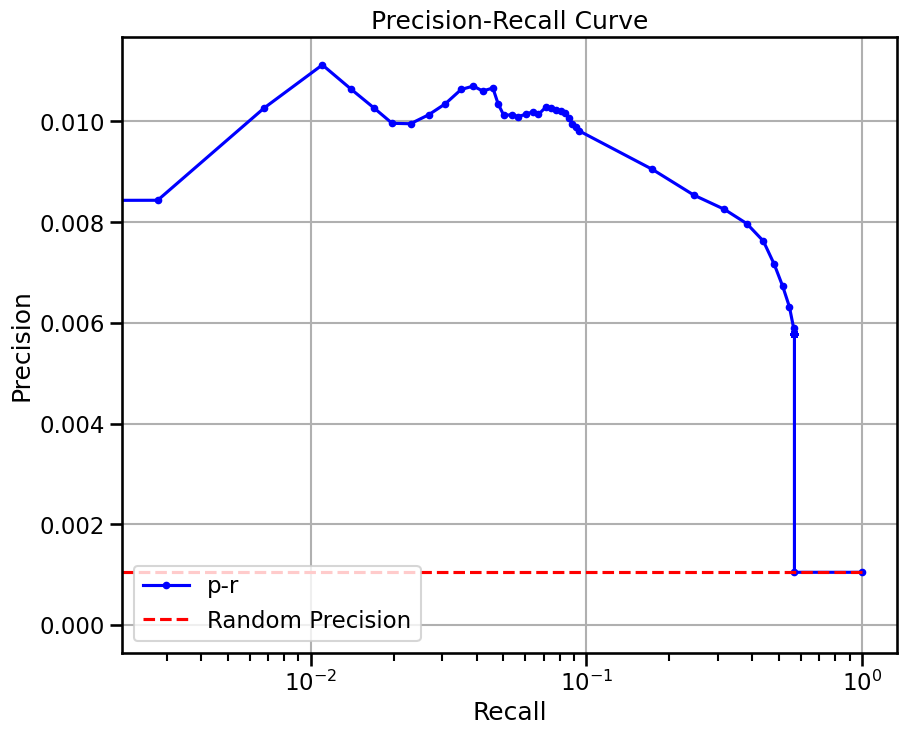

base enrichment


Top central genes: []
The DataFrame contains only the same values.


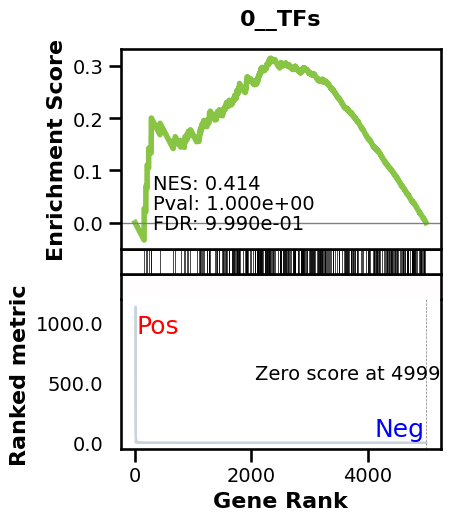

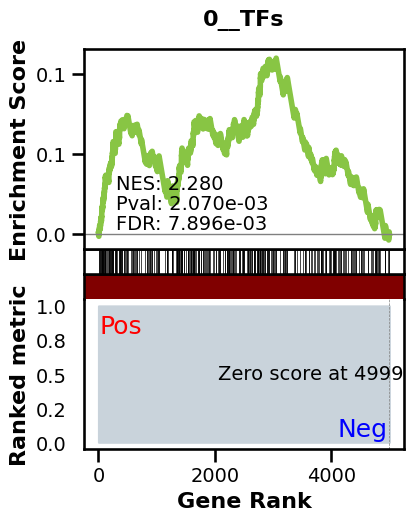

_________________________________________
TF specific enrichment


found some significant results for  28.125 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2812 genes
intersection pct: 0.5624
precision:  0.0010440926814363964 
recall:  1.0 
random precision: 0.0010444641124863559



  0%|          | 0/128 [00:00<?, ?it/s]


  8%|▊         | 10/128 [00:00<00:01, 91.01it/s]


 16%|█▌        | 20/128 [00:00<00:01, 91.61it/s]


 23%|██▎       | 30/128 [00:00<00:01, 92.04it/s]


 31%|███▏      | 40/128 [00:00<00:00, 91.62it/s]


 39%|███▉      | 50/128 [00:00<00:00, 91.18it/s]


 47%|████▋     | 60/128 [00:00<00:00, 91.47it/s]


 55%|█████▍    | 70/128 [00:00<00:00, 91.46it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 91.66it/s]


 70%|███████   | 90/128 [00:00<00:00, 91.86it/s]


 78%|███████▊  | 100/128 [00:01<00:00, 90.64it/s]


 86%|████████▌ | 110/128 [00:01<00:00, 90.98it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 91.40it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 91.40it/s]

Average Precision (AP):  0.0011063063141330558
Area Under Precision-Recall Curve (AUPRC):  0.001092971252691999
EPR: 2.3257681777557204


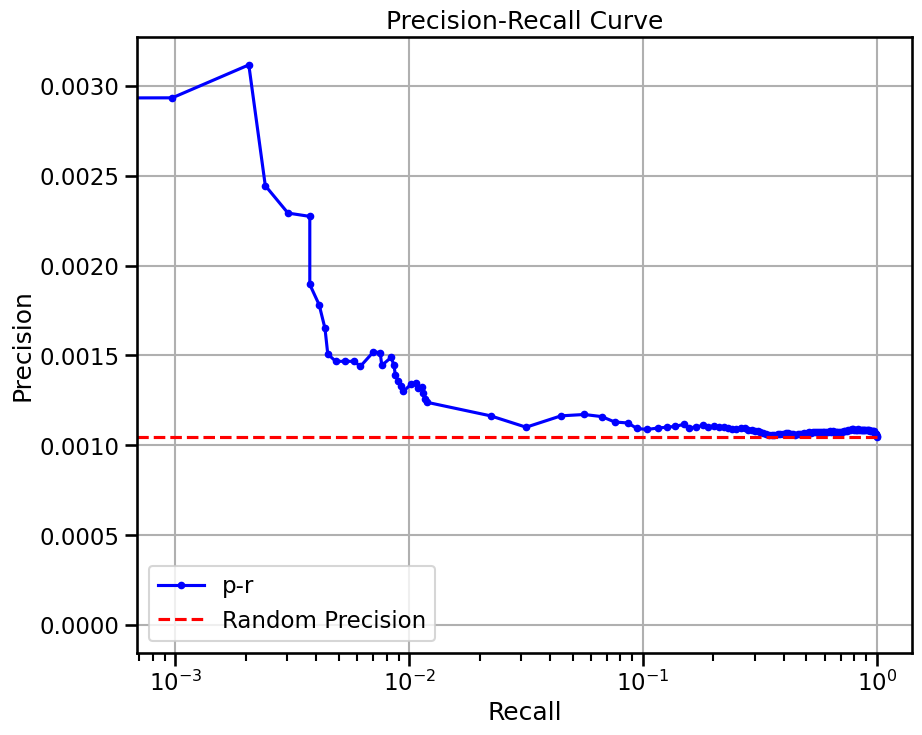

base enrichment


Top central genes: []


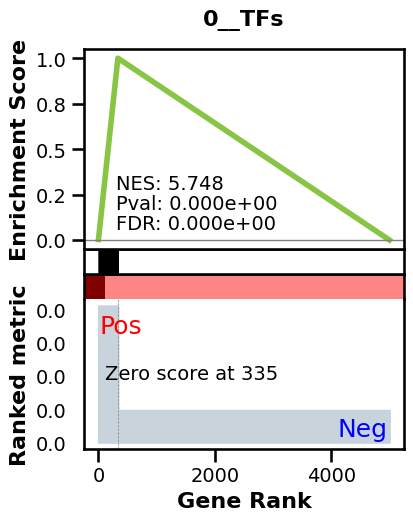

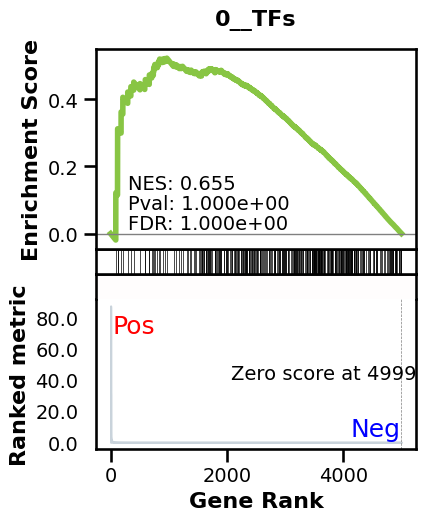

_________________________________________
TF specific enrichment


found some significant results for  18.75 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2812 genes
intersection pct: 0.5624
precision:  0.005769883888623644 
recall:  0.5679505813953488 
random precision: 0.0010444641124863559



  0%|          | 0/128 [00:00<?, ?it/s]


  7%|▋         | 9/128 [00:00<00:01, 86.90it/s]


 14%|█▍        | 18/128 [00:00<00:01, 88.53it/s]


 22%|██▏       | 28/128 [00:00<00:01, 89.22it/s]


 30%|██▉       | 38/128 [00:00<00:01, 89.64it/s]


 37%|███▋      | 47/128 [00:00<00:00, 89.52it/s]


 44%|████▍     | 56/128 [00:00<00:00, 88.62it/s]


 51%|█████     | 65/128 [00:00<00:00, 88.82it/s]


 59%|█████▊    | 75/128 [00:00<00:00, 89.72it/s]


 66%|██████▋   | 85/128 [00:00<00:00, 90.23it/s]


 74%|███████▍  | 95/128 [00:01<00:00, 89.29it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 89.69it/s]


 90%|████████▉ | 115/128 [00:01<00:00, 90.16it/s]


 98%|█████████▊| 125/128 [00:01<00:00, 90.50it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 89.68it/s]

Average Precision (AP):  0.0037677141100156885
Area Under Precision-Recall Curve (AUPRC):  0.003420158165950436
EPR: 6.450599772652123


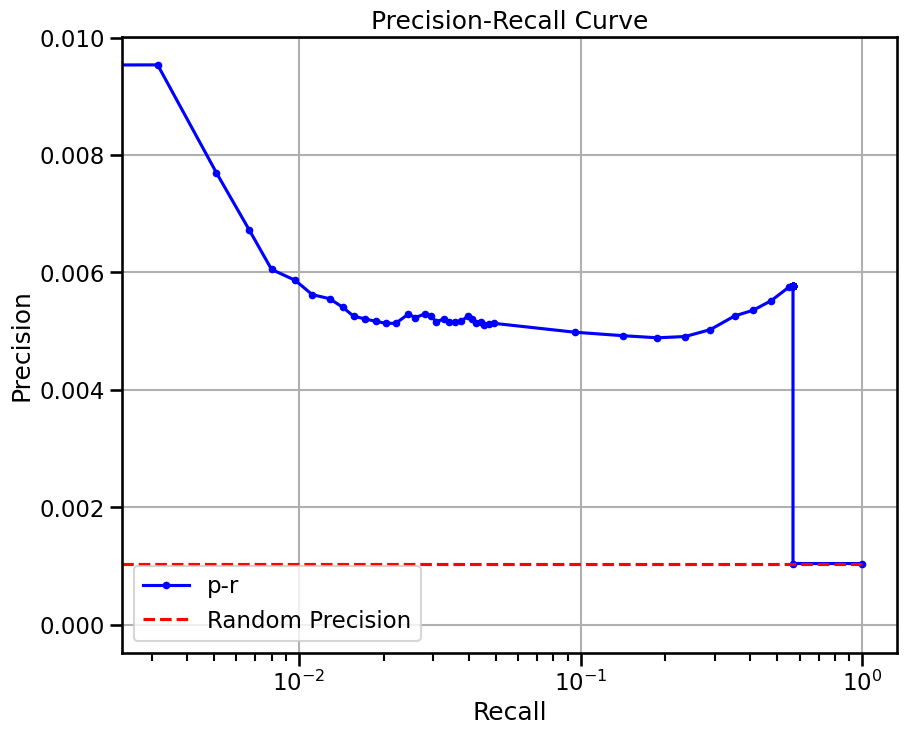


  0%|          | 0/7 [00:00<?, ?it/s]


 14%|█▍        | 1/7 [00:02<00:14,  2.35s/it]


 29%|██▊       | 2/7 [00:09<00:25,  5.14s/it]


 43%|████▎     | 3/7 [00:22<00:34,  8.72s/it]


 57%|█████▋    | 4/7 [00:35<00:30, 10.29s/it]


 71%|███████▏  | 5/7 [00:39<00:16,  8.23s/it]


 86%|████████▌ | 6/7 [00:45<00:07,  7.43s/it]


100%|██████████| 7/7 [00:47<00:00,  5.52s/it]


100%|██████████| 7/7 [00:47<00:00,  6.77s/it]

avg link count: 535876201, sparsity: 1.0


base enrichment


too many genes for central computation


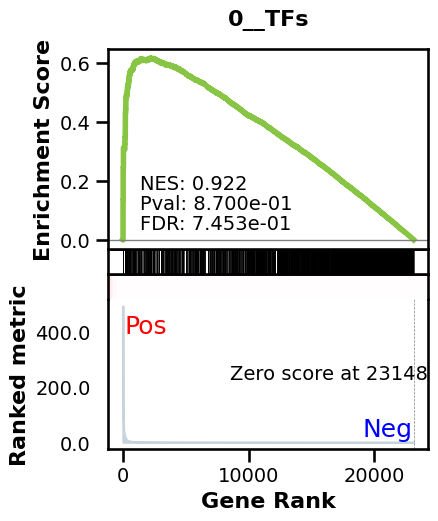

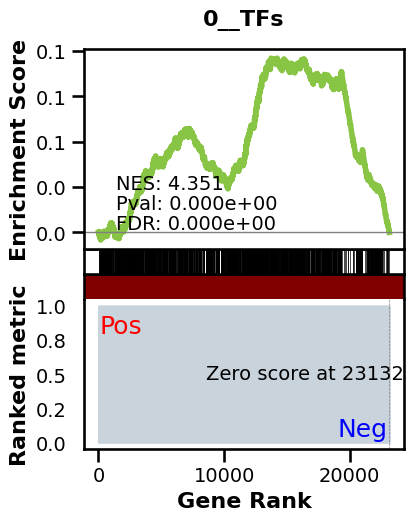

_________________________________________
TF specific enrichment


found some significant results for  67.85714285714286 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:29,  4.32it/s]


  2%|▏         | 2/128 [00:00<00:29,  4.33it/s]


  2%|▏         | 3/128 [00:00<00:28,  4.33it/s]


  3%|▎         | 4/128 [00:00<00:28,  4.33it/s]


  4%|▍         | 5/128 [00:01<00:28,  4.33it/s]


  5%|▍         | 6/128 [00:01<00:28,  4.33it/s]


  5%|▌         | 7/128 [00:01<00:27,  4.33it/s]


  6%|▋         | 8/128 [00:01<00:27,  4.33it/s]


  7%|▋         | 9/128 [00:02<00:27,  4.33it/s]


  8%|▊         | 10/128 [00:02<00:27,  4.33it/s]


  9%|▊         | 11/128 [00:02<00:27,  4.33it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.32it/s]


 10%|█         | 13/128 [00:03<00:26,  4.32it/s]


 11%|█         | 14/128 [00:03<00:26,  4.33it/s]


 12%|█▏        | 15/128 [00:03<00:26,  4.33it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.32it/s]


 13%|█▎        | 17/128 [00:03<00:25,  4.31it/s]


 14%|█▍        | 18/128 [00:04<00:25,  4.29it/s]


 15%|█▍        | 19/128 [00:04<00:25,  4.30it/s]


 16%|█▌        | 20/128 [00:04<00:25,  4.30it/s]


 16%|█▋        | 21/128 [00:04<00:24,  4.30it/s]


 17%|█▋        | 22/128 [00:05<00:24,  4.31it/s]


 18%|█▊        | 23/128 [00:05<00:24,  4.29it/s]


 19%|█▉        | 24/128 [00:05<00:24,  4.30it/s]


 20%|█▉        | 25/128 [00:05<00:23,  4.30it/s]


 20%|██        | 26/128 [00:06<00:23,  4.31it/s]


 21%|██        | 27/128 [00:06<00:23,  4.31it/s]


 22%|██▏       | 28/128 [00:06<00:23,  4.32it/s]


 23%|██▎       | 29/128 [00:06<00:22,  4.31it/s]


 23%|██▎       | 30/128 [00:06<00:22,  4.32it/s]


 24%|██▍       | 31/128 [00:07<00:22,  4.32it/s]


 25%|██▌       | 32/128 [00:07<00:22,  4.32it/s]


 26%|██▌       | 33/128 [00:07<00:22,  4.31it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.32it/s]


 27%|██▋       | 35/128 [00:08<00:21,  4.32it/s]


 28%|██▊       | 36/128 [00:08<00:21,  4.31it/s]


 29%|██▉       | 37/128 [00:08<00:21,  4.31it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.32it/s]


 30%|███       | 39/128 [00:09<00:20,  4.32it/s]


 31%|███▏      | 40/128 [00:09<00:20,  4.31it/s]


 32%|███▏      | 41/128 [00:09<00:20,  4.31it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.31it/s]


 34%|███▎      | 43/128 [00:09<00:19,  4.28it/s]


 34%|███▍      | 44/128 [00:10<00:19,  4.29it/s]


 35%|███▌      | 45/128 [00:10<00:19,  4.30it/s]


 36%|███▌      | 46/128 [00:10<00:19,  4.31it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.28it/s]


 38%|███▊      | 48/128 [00:11<00:18,  4.30it/s]


 38%|███▊      | 49/128 [00:11<00:18,  4.30it/s]


 39%|███▉      | 50/128 [00:11<00:18,  4.31it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.31it/s]


 41%|████      | 52/128 [00:12<00:17,  4.31it/s]


 41%|████▏     | 53/128 [00:12<00:17,  4.32it/s]


 42%|████▏     | 54/128 [00:12<00:17,  4.32it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.32it/s]


 44%|████▍     | 56/128 [00:12<00:16,  4.32it/s]


 45%|████▍     | 57/128 [00:13<00:16,  4.32it/s]


 45%|████▌     | 58/128 [00:13<00:16,  4.32it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.33it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.32it/s]


 48%|████▊     | 61/128 [00:14<00:15,  4.33it/s]


 48%|████▊     | 62/128 [00:14<00:15,  4.33it/s]


 49%|████▉     | 63/128 [00:14<00:15,  4.32it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.32it/s]


 51%|█████     | 65/128 [00:15<00:14,  4.30it/s]


 52%|█████▏    | 66/128 [00:15<00:14,  4.31it/s]


 52%|█████▏    | 67/128 [00:15<00:14,  4.30it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.31it/s]


 54%|█████▍    | 69/128 [00:16<00:13,  4.28it/s]


 55%|█████▍    | 70/128 [00:16<00:13,  4.29it/s]


 55%|█████▌    | 71/128 [00:16<00:13,  4.30it/s]


 56%|█████▋    | 72/128 [00:16<00:13,  4.30it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.30it/s]


 58%|█████▊    | 74/128 [00:17<00:12,  4.31it/s]


 59%|█████▊    | 75/128 [00:17<00:12,  4.31it/s]


 59%|█████▉    | 76/128 [00:17<00:12,  4.31it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.31it/s]


 61%|██████    | 78/128 [00:18<00:11,  4.31it/s]


 62%|██████▏   | 79/128 [00:18<00:11,  4.31it/s]


 62%|██████▎   | 80/128 [00:18<00:11,  4.32it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.32it/s]


 64%|██████▍   | 82/128 [00:19<00:10,  4.31it/s]


 65%|██████▍   | 83/128 [00:19<00:10,  4.31it/s]


 66%|██████▌   | 84/128 [00:19<00:10,  4.32it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.30it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.30it/s]


 68%|██████▊   | 87/128 [00:20<00:09,  4.28it/s]


 69%|██████▉   | 88/128 [00:20<00:09,  4.29it/s]


 70%|██████▉   | 89/128 [00:20<00:09,  4.29it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.30it/s]


 71%|███████   | 91/128 [00:21<00:08,  4.27it/s]


 72%|███████▏  | 92/128 [00:21<00:08,  4.28it/s]


 73%|███████▎  | 93/128 [00:21<00:08,  4.30it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.31it/s]


 74%|███████▍  | 95/128 [00:22<00:07,  4.32it/s]


 75%|███████▌  | 96/128 [00:22<00:07,  4.32it/s]


 76%|███████▌  | 97/128 [00:22<00:07,  4.32it/s]


 77%|███████▋  | 98/128 [00:22<00:06,  4.32it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.32it/s]


 78%|███████▊  | 100/128 [00:23<00:06,  4.32it/s]


 79%|███████▉  | 101/128 [00:23<00:06,  4.31it/s]


 80%|███████▉  | 102/128 [00:23<00:06,  4.31it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.31it/s]


 81%|████████▏ | 104/128 [00:24<00:05,  4.31it/s]


 82%|████████▏ | 105/128 [00:24<00:05,  4.32it/s]


 83%|████████▎ | 106/128 [00:24<00:05,  4.32it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.32it/s]


 84%|████████▍ | 108/128 [00:25<00:04,  4.32it/s]


 85%|████████▌ | 109/128 [00:25<00:04,  4.31it/s]


 86%|████████▌ | 110/128 [00:25<00:04,  4.31it/s]


 87%|████████▋ | 111/128 [00:25<00:03,  4.28it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.29it/s]


 88%|████████▊ | 113/128 [00:26<00:03,  4.29it/s]


 89%|████████▉ | 114/128 [00:26<00:03,  4.30it/s]


 90%|████████▉ | 115/128 [00:26<00:03,  4.27it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.29it/s]


 91%|█████████▏| 117/128 [00:27<00:02,  4.29it/s]


 92%|█████████▏| 118/128 [00:27<00:02,  4.30it/s]


 93%|█████████▎| 119/128 [00:27<00:02,  4.31it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.32it/s]


 95%|█████████▍| 121/128 [00:28<00:01,  4.32it/s]


 95%|█████████▌| 122/128 [00:28<00:01,  4.32it/s]


 96%|█████████▌| 123/128 [00:28<00:01,  4.31it/s]


 97%|█████████▋| 124/128 [00:28<00:00,  4.32it/s]


 98%|█████████▊| 125/128 [00:29<00:00,  4.32it/s]


 98%|█████████▊| 126/128 [00:29<00:00,  4.32it/s]


 99%|█████████▉| 127/128 [00:29<00:00,  4.32it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:29<00:00,  4.31it/s]


100%|██████████| 128/128 [00:29<00:00,  4.31it/s]

Average Precision (AP):  0.0010796909448825272
Area Under Precision-Recall Curve (AUPRC):  0.0010795164159658442


EPR: 1.794288323583073


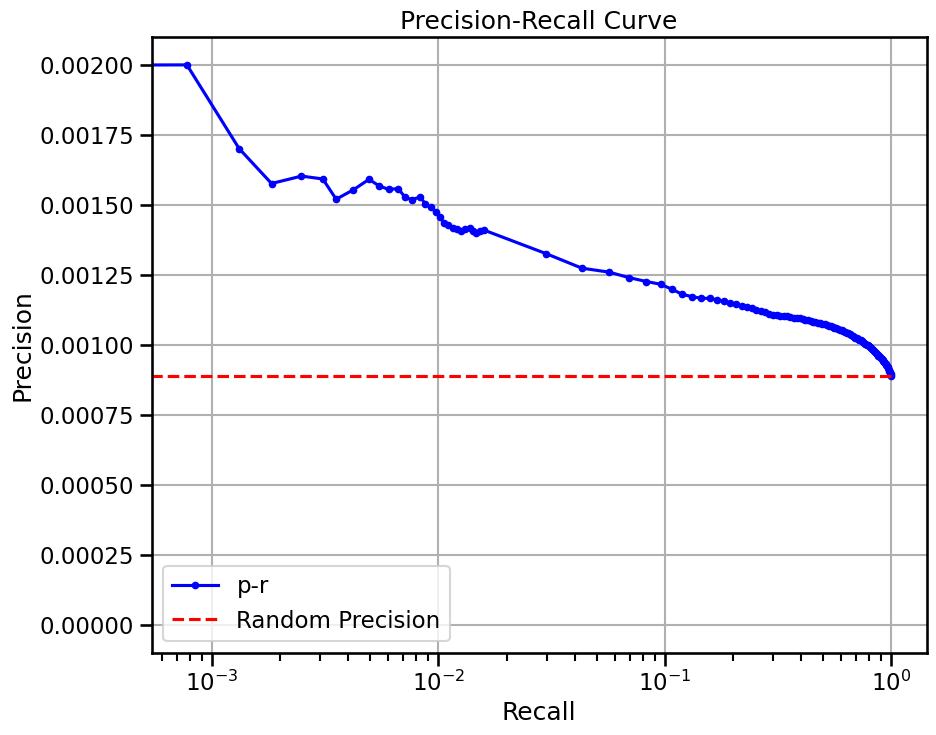


  0%|          | 0/14 [00:00<?, ?it/s]


  7%|▋         | 1/14 [00:12<02:36, 12.04s/it]


 14%|█▍        | 2/14 [00:22<02:10, 10.84s/it]


 21%|██▏       | 3/14 [00:33<02:04, 11.30s/it]


 29%|██▊       | 4/14 [00:41<01:39,  9.95s/it]


 36%|███▌      | 5/14 [00:44<01:07,  7.46s/it]


 43%|████▎     | 6/14 [00:47<00:45,  5.72s/it]


 50%|█████     | 7/14 [00:48<00:29,  4.24s/it]


 57%|█████▋    | 8/14 [00:50<00:21,  3.59s/it]


 64%|██████▍   | 9/14 [00:51<00:14,  2.85s/it]


 71%|███████▏  | 10/14 [01:05<00:25,  6.31s/it]


 79%|███████▊  | 11/14 [01:18<00:25,  8.34s/it]


 86%|████████▌ | 12/14 [01:26<00:16,  8.02s/it]


 93%|█████████▎| 13/14 [01:37<00:08,  8.96s/it]


100%|██████████| 14/14 [01:44<00:00,  8.59s/it]


100%|██████████| 14/14 [01:45<00:00,  7.51s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


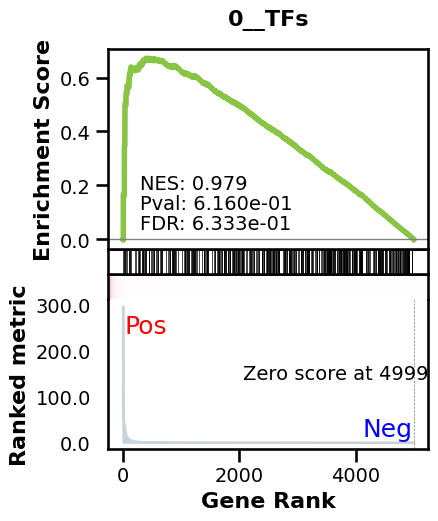

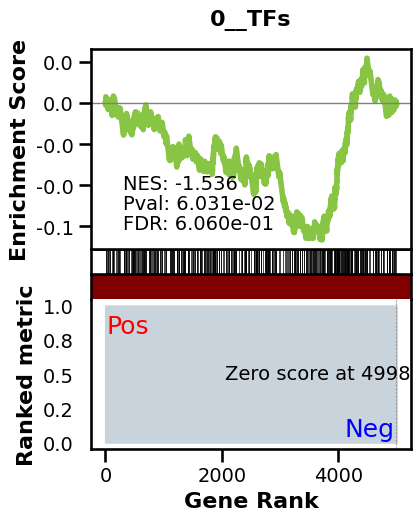

_________________________________________
TF specific enrichment


found some significant results for  27.272727272727273 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3538 genes
intersection pct: 0.7076
precision:  0.0015724456206874184 
recall:  1.0 
random precision: 0.0015728901911201826



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.05it/s]


  9%|▉         | 12/128 [00:00<00:02, 54.99it/s]


 14%|█▍        | 18/128 [00:00<00:02, 54.92it/s]


 19%|█▉        | 24/128 [00:00<00:01, 54.45it/s]


 23%|██▎       | 30/128 [00:00<00:01, 54.66it/s]


 28%|██▊       | 36/128 [00:00<00:01, 54.80it/s]


 33%|███▎      | 42/128 [00:00<00:01, 54.86it/s]


 38%|███▊      | 48/128 [00:00<00:01, 54.91it/s]


 42%|████▏     | 54/128 [00:00<00:01, 54.92it/s]


 47%|████▋     | 60/128 [00:01<00:01, 54.85it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 54.84it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 54.82it/s]


 61%|██████    | 78/128 [00:01<00:00, 54.57it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 54.62it/s]


 70%|███████   | 90/128 [00:01<00:00, 54.63it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 54.55it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 54.68it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 54.05it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 54.20it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 54.42it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 54.54it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 54.61it/s]

Average Precision (AP):  0.0017755526252304639
Area Under Precision-Recall Curve (AUPRC):  0.0017725191002754606
EPR: 1.3581511360943601


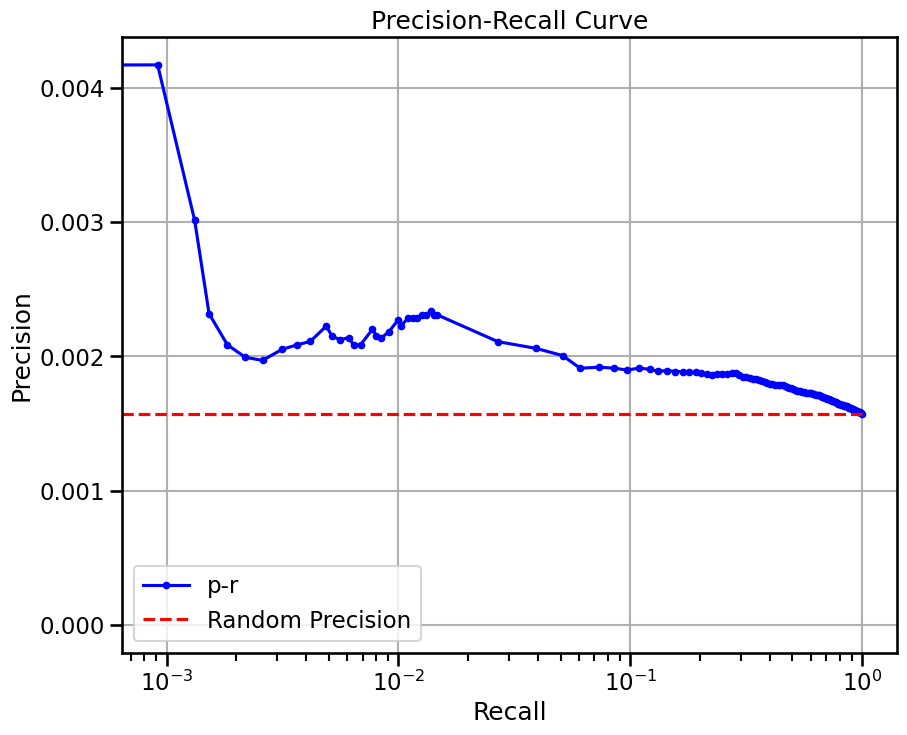

base enrichment


Top central genes: []


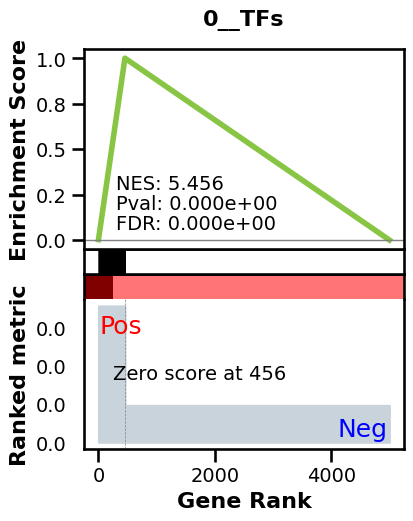

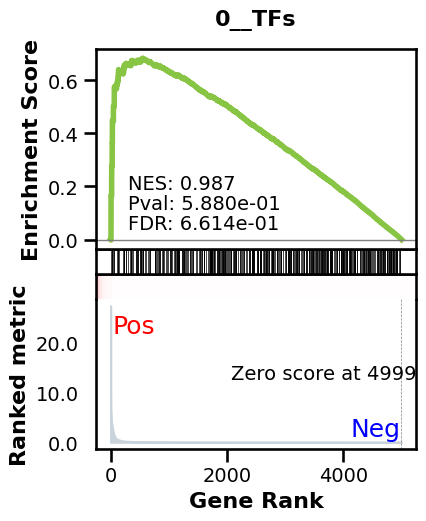

_________________________________________
TF specific enrichment


found some significant results for  12.727272727272727 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3538 genes
intersection pct: 0.7076
precision:  0.007216602122232253 
recall:  0.5214652237971854 
random precision: 0.0015728901911201826



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.08it/s]


  9%|▉         | 12/128 [00:00<00:02, 54.73it/s]


 14%|█▍        | 18/128 [00:00<00:02, 54.85it/s]


 19%|█▉        | 24/128 [00:00<00:01, 54.88it/s]


 23%|██▎       | 30/128 [00:00<00:01, 54.81it/s]


 28%|██▊       | 36/128 [00:00<00:01, 54.83it/s]


 33%|███▎      | 42/128 [00:00<00:01, 54.82it/s]


 38%|███▊      | 48/128 [00:00<00:01, 54.88it/s]


 42%|████▏     | 54/128 [00:00<00:01, 54.89it/s]


 47%|████▋     | 60/128 [00:01<00:01, 54.92it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 54.95it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 54.93it/s]


 61%|██████    | 78/128 [00:01<00:00, 54.88it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 54.83it/s]


 70%|███████   | 90/128 [00:01<00:00, 54.72it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 54.69it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 54.34it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 54.37it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 54.46it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 54.34it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 54.47it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 54.68it/s]

Average Precision (AP):  0.005631883805503823
Area Under Precision-Recall Curve (AUPRC):  0.005196111087909642
EPR: 6.975755784831108


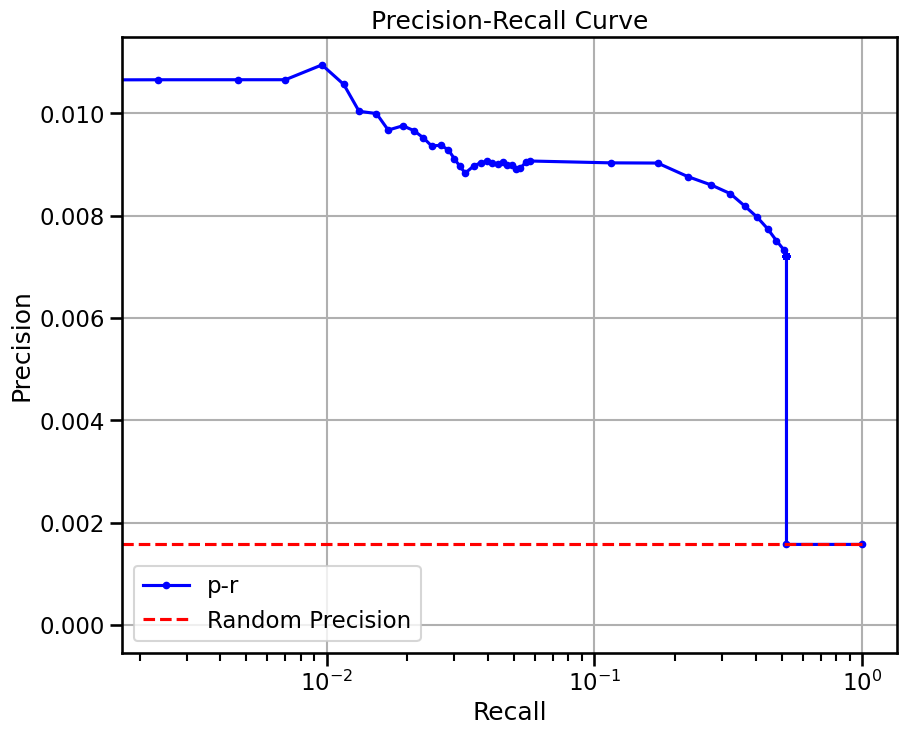

base enrichment


Top central genes: []
The DataFrame contains only the same values.


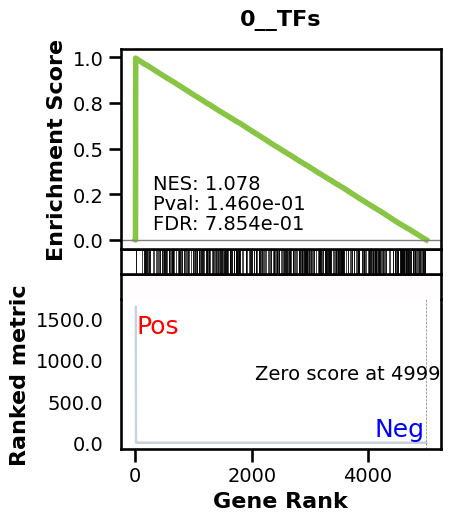

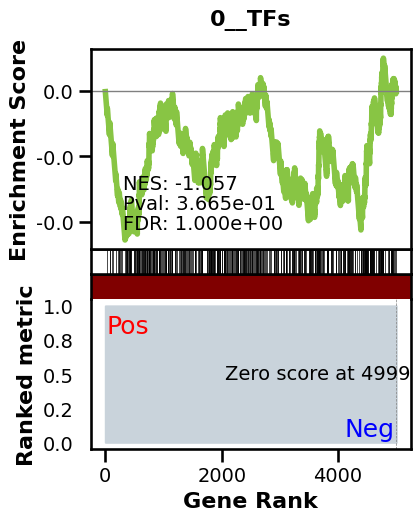

_________________________________________
TF specific enrichment


found some significant results for  18.181818181818183 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3538 genes
intersection pct: 0.7076
precision:  0.0015724456206874184 
recall:  1.0 
random precision: 0.0015728901911201826



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 54.45it/s]


  9%|▉         | 12/128 [00:00<00:02, 54.49it/s]


 14%|█▍        | 18/128 [00:00<00:02, 54.43it/s]


 19%|█▉        | 24/128 [00:00<00:01, 54.48it/s]


 23%|██▎       | 30/128 [00:00<00:01, 54.37it/s]


 28%|██▊       | 36/128 [00:00<00:01, 54.35it/s]


 33%|███▎      | 42/128 [00:00<00:01, 54.35it/s]


 38%|███▊      | 48/128 [00:00<00:01, 54.33it/s]


 42%|████▏     | 54/128 [00:00<00:01, 54.32it/s]


 47%|████▋     | 60/128 [00:01<00:01, 54.31it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 54.31it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 54.26it/s]


 61%|██████    | 78/128 [00:01<00:00, 54.31it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 54.36it/s]


 70%|███████   | 90/128 [00:01<00:00, 54.38it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 54.34it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 54.33it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 54.30it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 54.38it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 54.40it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 54.37it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 54.32it/s]

Average Precision (AP):  0.0020298605985163676
Area Under Precision-Recall Curve (AUPRC):  0.002026964583324305
EPR: 1.9437798309165844


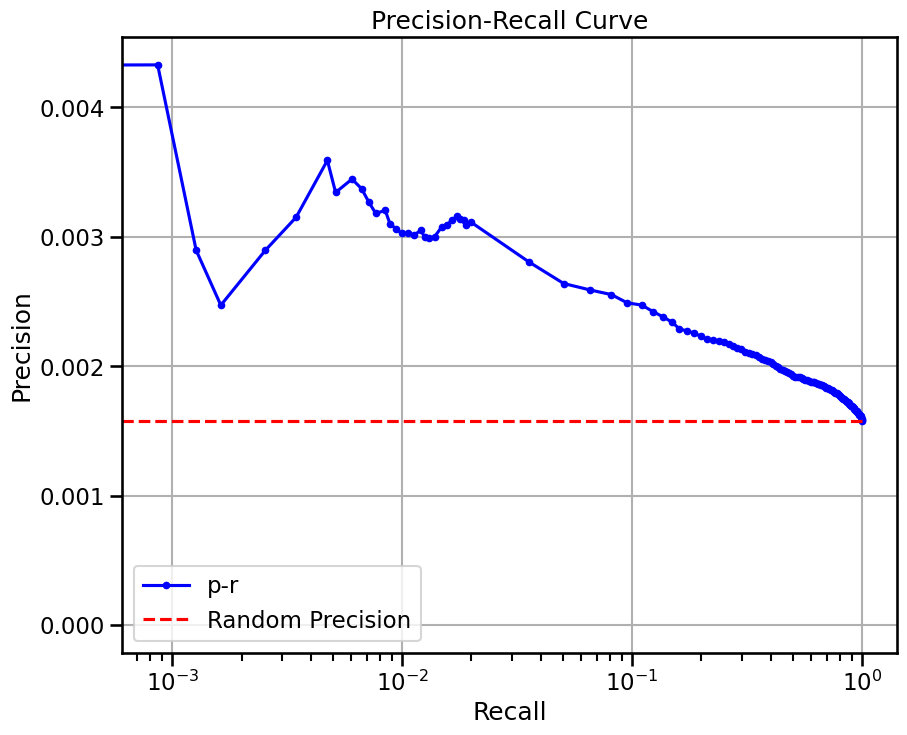

base enrichment


Top central genes: []


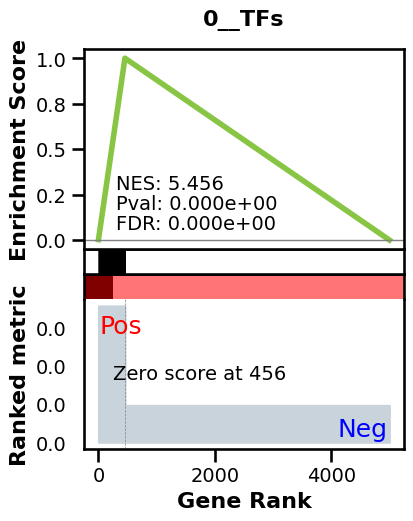

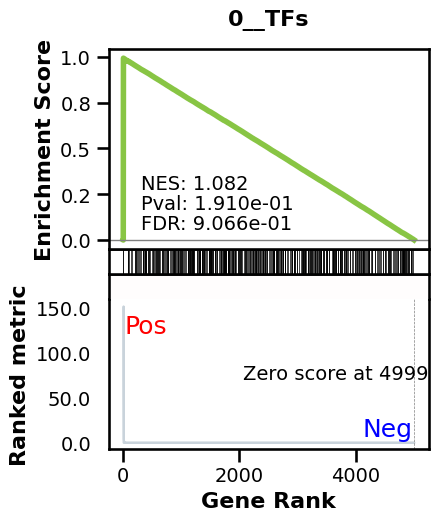

_________________________________________
TF specific enrichment


found some significant results for  7.2727272727272725 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3538 genes
intersection pct: 0.7076
precision:  0.007216602122232253 
recall:  0.5214652237971854 
random precision: 0.0015728901911201826



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 54.58it/s]


  9%|▉         | 12/128 [00:00<00:02, 54.53it/s]


 14%|█▍        | 18/128 [00:00<00:02, 54.50it/s]


 19%|█▉        | 24/128 [00:00<00:01, 54.49it/s]


 23%|██▎       | 30/128 [00:00<00:01, 54.50it/s]


 28%|██▊       | 36/128 [00:00<00:01, 54.48it/s]


 33%|███▎      | 42/128 [00:00<00:01, 54.44it/s]


 38%|███▊      | 48/128 [00:00<00:01, 54.40it/s]


 42%|████▏     | 54/128 [00:00<00:01, 54.43it/s]


 47%|████▋     | 60/128 [00:01<00:01, 54.44it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 54.45it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 54.13it/s]


 61%|██████    | 78/128 [00:01<00:00, 54.22it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 54.31it/s]


 70%|███████   | 90/128 [00:01<00:00, 54.35it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 54.37it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 54.47it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 54.47it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 54.44it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 54.42it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 54.40it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 54.38it/s]

Average Precision (AP):  0.006161087989108012
Area Under Precision-Recall Curve (AUPRC):  0.005753278836134164
EPR: 9.141688504249943


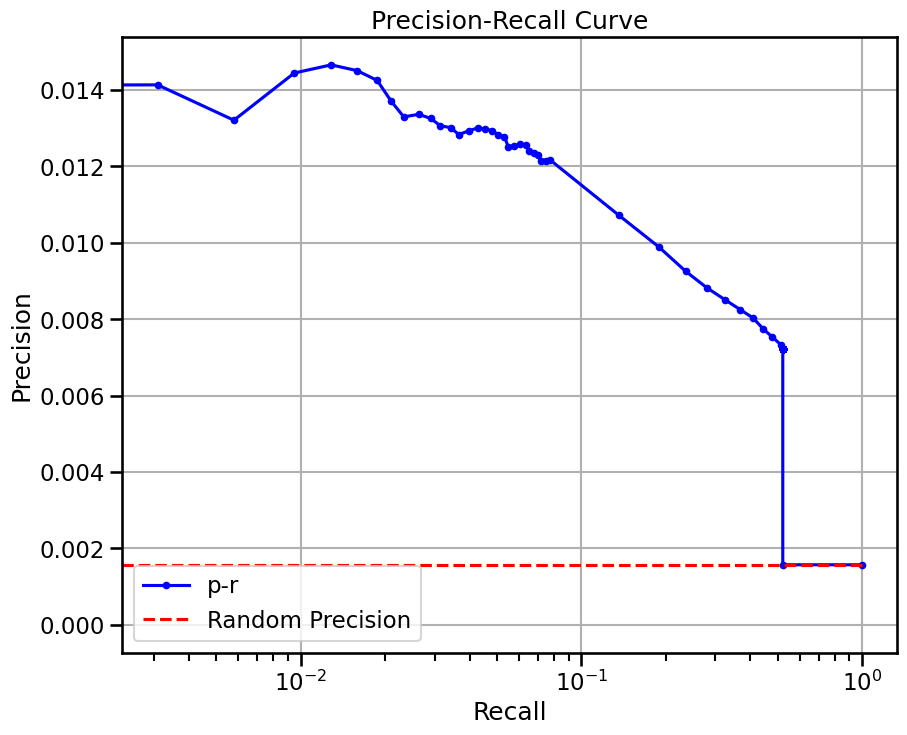


  0%|          | 0/11 [00:00<?, ?it/s]


  9%|▉         | 1/11 [00:17<02:53, 17.38s/it]


 18%|█▊        | 2/11 [00:21<01:27,  9.74s/it]


 27%|██▋       | 3/11 [00:22<00:45,  5.66s/it]


 36%|███▋      | 4/11 [00:23<00:26,  3.75s/it]


 45%|████▌     | 5/11 [00:24<00:16,  2.70s/it]


 55%|█████▍    | 6/11 [00:25<00:10,  2.05s/it]


 64%|██████▎   | 7/11 [00:25<00:06,  1.64s/it]


 73%|███████▎  | 8/11 [00:28<00:05,  1.85s/it]


 82%|████████▏ | 9/11 [00:32<00:05,  2.66s/it]


 91%|█████████ | 10/11 [00:41<00:04,  4.46s/it]


100%|██████████| 11/11 [00:53<00:00,  6.81s/it]


100%|██████████| 11/11 [00:53<00:00,  4.86s/it]

avg link count: 535876201, sparsity: 1.0


base enrichment


too many genes for central computation


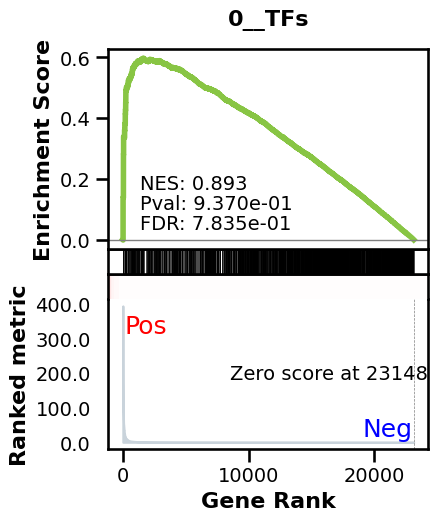

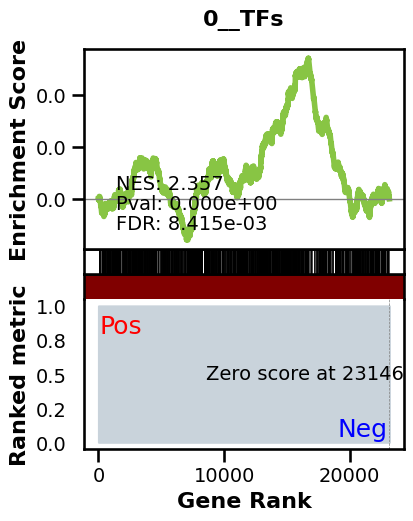

_________________________________________
TF specific enrichment


found some significant results for  64.28571428571429 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:37,  3.39it/s]


  2%|▏         | 2/128 [00:00<00:37,  3.39it/s]


  2%|▏         | 3/128 [00:00<00:36,  3.39it/s]


  3%|▎         | 4/128 [00:01<00:36,  3.39it/s]


  4%|▍         | 5/128 [00:01<00:36,  3.39it/s]


  5%|▍         | 6/128 [00:01<00:35,  3.39it/s]


  5%|▌         | 7/128 [00:02<00:35,  3.39it/s]


  6%|▋         | 8/128 [00:02<00:35,  3.36it/s]


  7%|▋         | 9/128 [00:02<00:35,  3.35it/s]


  8%|▊         | 10/128 [00:02<00:35,  3.34it/s]


  9%|▊         | 11/128 [00:03<00:35,  3.34it/s]


  9%|▉         | 12/128 [00:03<00:34,  3.33it/s]


 10%|█         | 13/128 [00:03<00:34,  3.32it/s]


 11%|█         | 14/128 [00:04<00:34,  3.31it/s]


 12%|█▏        | 15/128 [00:04<00:34,  3.31it/s]


 12%|█▎        | 16/128 [00:04<00:33,  3.31it/s]


 13%|█▎        | 17/128 [00:05<00:33,  3.31it/s]


 14%|█▍        | 18/128 [00:05<00:33,  3.31it/s]


 15%|█▍        | 19/128 [00:05<00:32,  3.31it/s]


 16%|█▌        | 20/128 [00:05<00:32,  3.31it/s]


 16%|█▋        | 21/128 [00:06<00:32,  3.32it/s]


 17%|█▋        | 22/128 [00:06<00:31,  3.34it/s]


 18%|█▊        | 23/128 [00:06<00:31,  3.35it/s]


 19%|█▉        | 24/128 [00:07<00:30,  3.36it/s]


 20%|█▉        | 25/128 [00:07<00:30,  3.36it/s]


 20%|██        | 26/128 [00:07<00:30,  3.37it/s]


 21%|██        | 27/128 [00:08<00:29,  3.38it/s]


 22%|██▏       | 28/128 [00:08<00:29,  3.38it/s]


 23%|██▎       | 29/128 [00:08<00:29,  3.38it/s]


 23%|██▎       | 30/128 [00:08<00:28,  3.38it/s]


 24%|██▍       | 31/128 [00:09<00:28,  3.38it/s]


 25%|██▌       | 32/128 [00:09<00:28,  3.37it/s]


 26%|██▌       | 33/128 [00:09<00:28,  3.38it/s]


 27%|██▋       | 34/128 [00:10<00:27,  3.38it/s]


 27%|██▋       | 35/128 [00:10<00:27,  3.38it/s]


 28%|██▊       | 36/128 [00:10<00:27,  3.37it/s]


 29%|██▉       | 37/128 [00:11<00:26,  3.37it/s]


 30%|██▉       | 38/128 [00:11<00:26,  3.37it/s]


 30%|███       | 39/128 [00:11<00:26,  3.37it/s]


 31%|███▏      | 40/128 [00:11<00:26,  3.37it/s]


 32%|███▏      | 41/128 [00:12<00:25,  3.37it/s]


 33%|███▎      | 42/128 [00:12<00:25,  3.37it/s]


 34%|███▎      | 43/128 [00:12<00:25,  3.37it/s]


 34%|███▍      | 44/128 [00:13<00:24,  3.37it/s]


 35%|███▌      | 45/128 [00:13<00:24,  3.37it/s]


 36%|███▌      | 46/128 [00:13<00:24,  3.37it/s]


 37%|███▋      | 47/128 [00:13<00:24,  3.37it/s]


 38%|███▊      | 48/128 [00:14<00:23,  3.37it/s]


 38%|███▊      | 49/128 [00:14<00:23,  3.37it/s]


 39%|███▉      | 50/128 [00:14<00:23,  3.37it/s]


 40%|███▉      | 51/128 [00:15<00:22,  3.36it/s]


 41%|████      | 52/128 [00:15<00:22,  3.34it/s]


 41%|████▏     | 53/128 [00:15<00:22,  3.33it/s]


 42%|████▏     | 54/128 [00:16<00:22,  3.32it/s]


 43%|████▎     | 55/128 [00:16<00:22,  3.28it/s]


 44%|████▍     | 56/128 [00:16<00:22,  3.24it/s]


 45%|████▍     | 57/128 [00:17<00:22,  3.22it/s]


 45%|████▌     | 58/128 [00:17<00:21,  3.21it/s]


 46%|████▌     | 59/128 [00:17<00:21,  3.20it/s]


 47%|████▋     | 60/128 [00:17<00:21,  3.20it/s]


 48%|████▊     | 61/128 [00:18<00:20,  3.20it/s]


 48%|████▊     | 62/128 [00:18<00:20,  3.19it/s]


 49%|████▉     | 63/128 [00:18<00:20,  3.18it/s]


 50%|█████     | 64/128 [00:19<00:20,  3.18it/s]


 51%|█████     | 65/128 [00:19<00:19,  3.18it/s]


 52%|█████▏    | 66/128 [00:19<00:19,  3.18it/s]


 52%|█████▏    | 67/128 [00:20<00:19,  3.18it/s]


 53%|█████▎    | 68/128 [00:20<00:18,  3.19it/s]


 54%|█████▍    | 69/128 [00:20<00:18,  3.18it/s]


 55%|█████▍    | 70/128 [00:21<00:18,  3.18it/s]


 55%|█████▌    | 71/128 [00:21<00:17,  3.18it/s]


 56%|█████▋    | 72/128 [00:21<00:17,  3.18it/s]


 57%|█████▋    | 73/128 [00:22<00:17,  3.18it/s]


 58%|█████▊    | 74/128 [00:22<00:16,  3.18it/s]


 59%|█████▊    | 75/128 [00:22<00:16,  3.18it/s]


 59%|█████▉    | 76/128 [00:23<00:16,  3.18it/s]


 60%|██████    | 77/128 [00:23<00:16,  3.18it/s]


 61%|██████    | 78/128 [00:23<00:15,  3.18it/s]


 62%|██████▏   | 79/128 [00:23<00:15,  3.18it/s]


 62%|██████▎   | 80/128 [00:24<00:15,  3.18it/s]


 63%|██████▎   | 81/128 [00:24<00:14,  3.18it/s]


 64%|██████▍   | 82/128 [00:24<00:14,  3.18it/s]


 65%|██████▍   | 83/128 [00:25<00:14,  3.17it/s]


 66%|██████▌   | 84/128 [00:25<00:13,  3.17it/s]


 66%|██████▋   | 85/128 [00:25<00:13,  3.17it/s]


 67%|██████▋   | 86/128 [00:26<00:13,  3.17it/s]


 68%|██████▊   | 87/128 [00:26<00:12,  3.18it/s]


 69%|██████▉   | 88/128 [00:26<00:12,  3.18it/s]


 70%|██████▉   | 89/128 [00:27<00:12,  3.18it/s]


 70%|███████   | 90/128 [00:27<00:11,  3.18it/s]


 71%|███████   | 91/128 [00:27<00:11,  3.18it/s]


 72%|███████▏  | 92/128 [00:28<00:11,  3.18it/s]


 73%|███████▎  | 93/128 [00:28<00:11,  3.18it/s]


 73%|███████▎  | 94/128 [00:28<00:10,  3.19it/s]


 74%|███████▍  | 95/128 [00:28<00:10,  3.18it/s]


 75%|███████▌  | 96/128 [00:29<00:10,  3.18it/s]


 76%|███████▌  | 97/128 [00:29<00:09,  3.19it/s]


 77%|███████▋  | 98/128 [00:29<00:09,  3.19it/s]


 77%|███████▋  | 99/128 [00:30<00:09,  3.20it/s]


 78%|███████▊  | 100/128 [00:30<00:08,  3.24it/s]


 79%|███████▉  | 101/128 [00:30<00:08,  3.27it/s]


 80%|███████▉  | 102/128 [00:31<00:07,  3.29it/s]


 80%|████████  | 103/128 [00:31<00:07,  3.31it/s]


 81%|████████▏ | 104/128 [00:31<00:07,  3.32it/s]


 82%|████████▏ | 105/128 [00:32<00:06,  3.33it/s]


 83%|████████▎ | 106/128 [00:32<00:06,  3.34it/s]


 84%|████████▎ | 107/128 [00:32<00:06,  3.35it/s]


 84%|████████▍ | 108/128 [00:32<00:05,  3.35it/s]


 85%|████████▌ | 109/128 [00:33<00:05,  3.35it/s]


 86%|████████▌ | 110/128 [00:33<00:05,  3.35it/s]


 87%|████████▋ | 111/128 [00:33<00:05,  3.35it/s]


 88%|████████▊ | 112/128 [00:34<00:04,  3.35it/s]


 88%|████████▊ | 113/128 [00:34<00:04,  3.35it/s]


 89%|████████▉ | 114/128 [00:34<00:04,  3.35it/s]


 90%|████████▉ | 115/128 [00:35<00:03,  3.35it/s]


 91%|█████████ | 116/128 [00:35<00:03,  3.37it/s]


 91%|█████████▏| 117/128 [00:35<00:03,  3.37it/s]


 92%|█████████▏| 118/128 [00:35<00:02,  3.36it/s]


 93%|█████████▎| 119/128 [00:36<00:02,  3.36it/s]


 94%|█████████▍| 120/128 [00:36<00:02,  3.35it/s]


 95%|█████████▍| 121/128 [00:36<00:02,  3.35it/s]


 95%|█████████▌| 122/128 [00:37<00:01,  3.35it/s]


 96%|█████████▌| 123/128 [00:37<00:01,  3.35it/s]


 97%|█████████▋| 124/128 [00:37<00:01,  3.35it/s]


 98%|█████████▊| 125/128 [00:37<00:00,  3.36it/s]


 98%|█████████▊| 126/128 [00:38<00:00,  3.36it/s]


 99%|█████████▉| 127/128 [00:38<00:00,  3.36it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:38<00:00,  3.36it/s]


100%|██████████| 128/128 [00:38<00:00,  3.29it/s]

Average Precision (AP):  0.001046144495122256
Area Under Precision-Recall Curve (AUPRC):  0.001045856201950366


EPR: 1.516240500202576


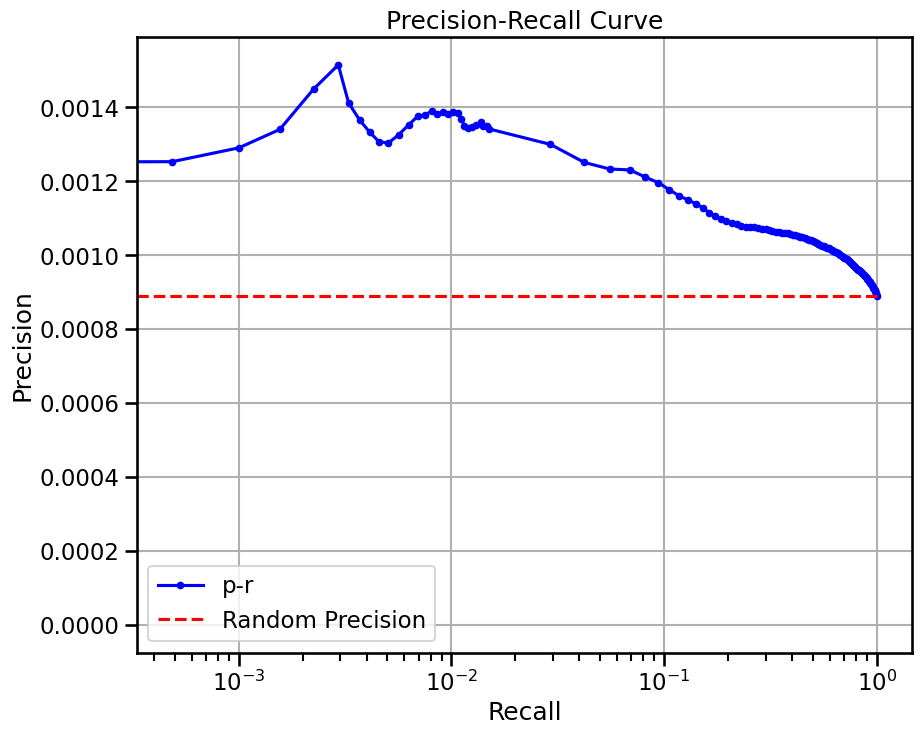


  0%|          | 0/22 [00:00<?, ?it/s]


  5%|▍         | 1/22 [00:09<03:18,  9.45s/it]


  9%|▉         | 2/22 [00:13<02:07,  6.37s/it]


 14%|█▎        | 3/22 [00:26<02:52,  9.10s/it]


 18%|█▊        | 4/22 [00:39<03:14, 10.82s/it]


 23%|██▎       | 5/22 [00:49<02:59, 10.56s/it]


 27%|██▋       | 6/22 [00:53<02:14,  8.41s/it]


 32%|███▏      | 7/22 [00:58<01:47,  7.14s/it]


 36%|███▋      | 8/22 [00:59<01:13,  5.24s/it]


 41%|████      | 9/22 [01:00<00:51,  3.99s/it]


 45%|████▌     | 10/22 [01:01<00:37,  3.10s/it]


 50%|█████     | 11/22 [01:02<00:27,  2.50s/it]


 55%|█████▍    | 12/22 [01:04<00:20,  2.10s/it]


 59%|█████▉    | 13/22 [01:05<00:16,  1.82s/it]


 64%|██████▎   | 14/22 [01:06<00:12,  1.61s/it]


 68%|██████▊   | 15/22 [01:07<00:10,  1.46s/it]


 73%|███████▎  | 16/22 [01:08<00:08,  1.37s/it]


 77%|███████▋  | 17/22 [01:09<00:06,  1.31s/it]


 82%|████████▏ | 18/22 [01:11<00:05,  1.27s/it]


 86%|████████▋ | 19/22 [01:12<00:03,  1.24s/it]


 91%|█████████ | 20/22 [01:13<00:02,  1.22s/it]


 95%|█████████▌| 21/22 [01:14<00:01,  1.20s/it]


100%|██████████| 22/22 [01:26<00:00,  4.44s/it]


100%|██████████| 22/22 [01:26<00:00,  3.95s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


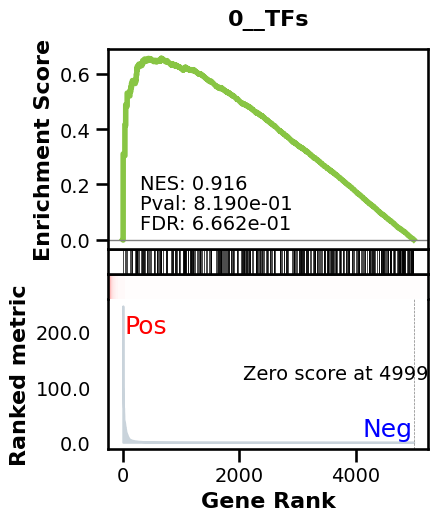

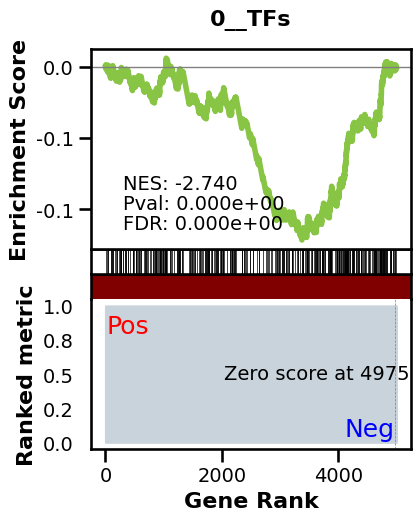

_________________________________________
TF specific enrichment


found some significant results for  18.75 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3511 genes
intersection pct: 0.7022
precision:  0.0014142799441978382 
recall:  1.0 
random precision: 0.001414682872956869



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.29it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.68it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.42it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.23it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.16it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.03it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.11it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.12it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.13it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.20it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.19it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 55.22it/s]


 61%|██████    | 78/128 [00:01<00:00, 55.23it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.18it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.14it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.06it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.08it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.09it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.07it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.08it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.06it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.10it/s]

Average Precision (AP):  0.0015423929337149778
Area Under Precision-Recall Curve (AUPRC):  0.0015404916197116207


EPR: 0.9730204636563655


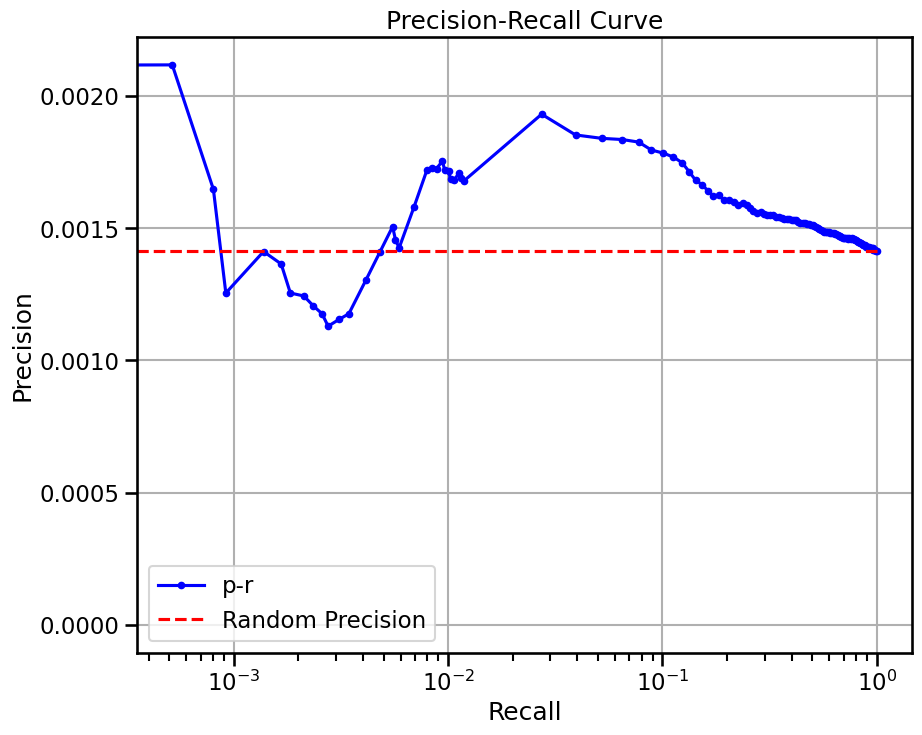

base enrichment


Top central genes: []


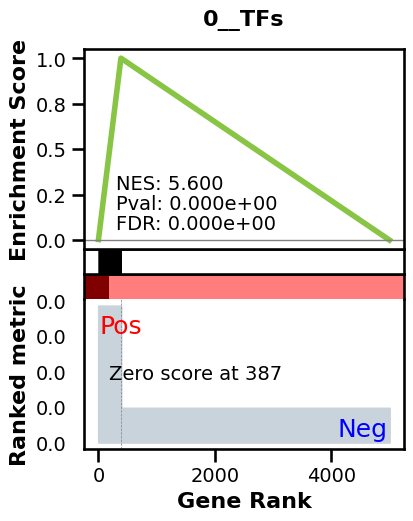

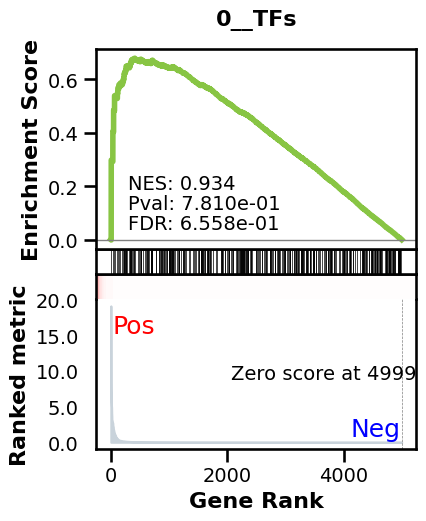

_________________________________________
TF specific enrichment


found some significant results for  4.166666666666667 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3511 genes
intersection pct: 0.7022
precision:  0.007612673505194292 
recall:  0.50745669381668 
random precision: 0.001414682872956869



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 56.56it/s]


  9%|▉         | 12/128 [00:00<00:02, 56.43it/s]


 14%|█▍        | 18/128 [00:00<00:01, 56.43it/s]


 19%|█▉        | 24/128 [00:00<00:01, 56.47it/s]


 23%|██▎       | 30/128 [00:00<00:01, 56.41it/s]


 28%|██▊       | 36/128 [00:00<00:01, 56.43it/s]


 33%|███▎      | 42/128 [00:00<00:01, 56.41it/s]


 38%|███▊      | 48/128 [00:00<00:01, 56.39it/s]


 42%|████▏     | 54/128 [00:00<00:01, 56.43it/s]


 47%|████▋     | 60/128 [00:01<00:01, 56.45it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 56.40it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 56.41it/s]


 61%|██████    | 78/128 [00:01<00:00, 56.37it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 56.44it/s]


 70%|███████   | 90/128 [00:01<00:00, 56.46it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 56.47it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 56.34it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 56.39it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 56.41it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 56.44it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 56.47it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 56.40it/s]

Average Precision (AP):  0.005704904936338686
Area Under Precision-Recall Curve (AUPRC):  0.005149764855301861
EPR: 8.74137467270064


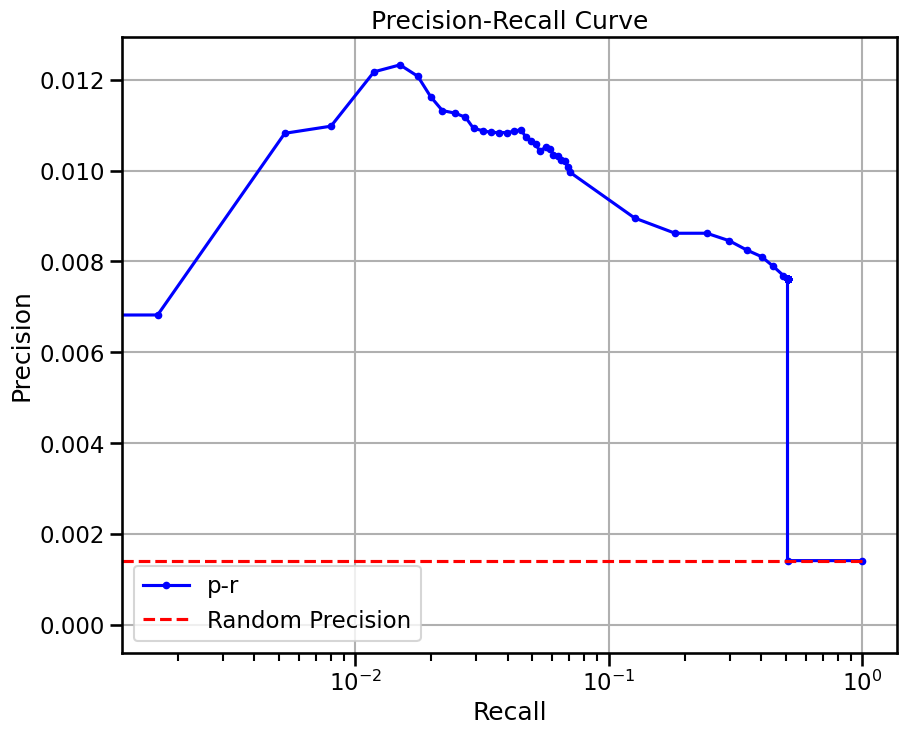

base enrichment


Top central genes: []
The DataFrame contains only the same values.


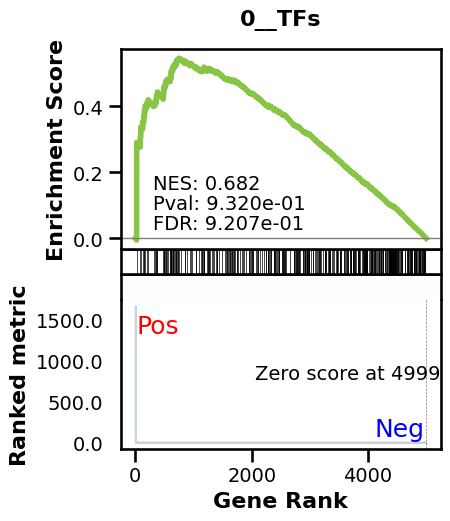

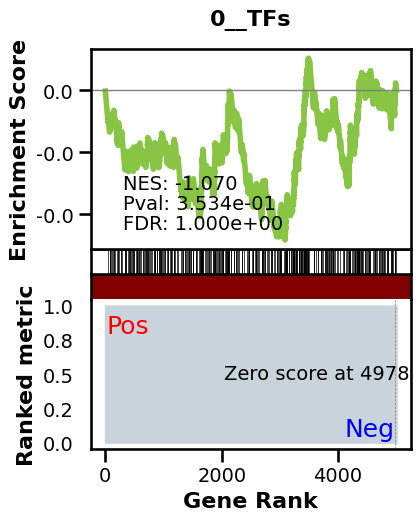

_________________________________________
TF specific enrichment


found some significant results for  8.333333333333334 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3511 genes
intersection pct: 0.7022
precision:  0.0014142799441978382 
recall:  1.0 
random precision: 0.001414682872956869



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 56.67it/s]


  9%|▉         | 12/128 [00:00<00:02, 56.73it/s]


 14%|█▍        | 18/128 [00:00<00:01, 56.71it/s]


 19%|█▉        | 24/128 [00:00<00:01, 56.67it/s]


 23%|██▎       | 30/128 [00:00<00:01, 56.64it/s]


 28%|██▊       | 36/128 [00:00<00:01, 56.62it/s]


 33%|███▎      | 42/128 [00:00<00:01, 56.63it/s]


 38%|███▊      | 48/128 [00:00<00:01, 56.60it/s]


 42%|████▏     | 54/128 [00:00<00:01, 56.05it/s]


 47%|████▋     | 60/128 [00:01<00:01, 56.22it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 56.35it/s]


 56%|█████▋    | 72/128 [00:01<00:00, 56.41it/s]


 61%|██████    | 78/128 [00:01<00:00, 56.45it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 56.50it/s]


 70%|███████   | 90/128 [00:01<00:00, 56.55it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 56.56it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 56.56it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 56.57it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 56.53it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 56.56it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 56.57it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 56.50it/s]

Average Precision (AP):  0.0018686315433811998
Area Under Precision-Recall Curve (AUPRC):  0.001866511333769028
EPR: 1.7471423519160048


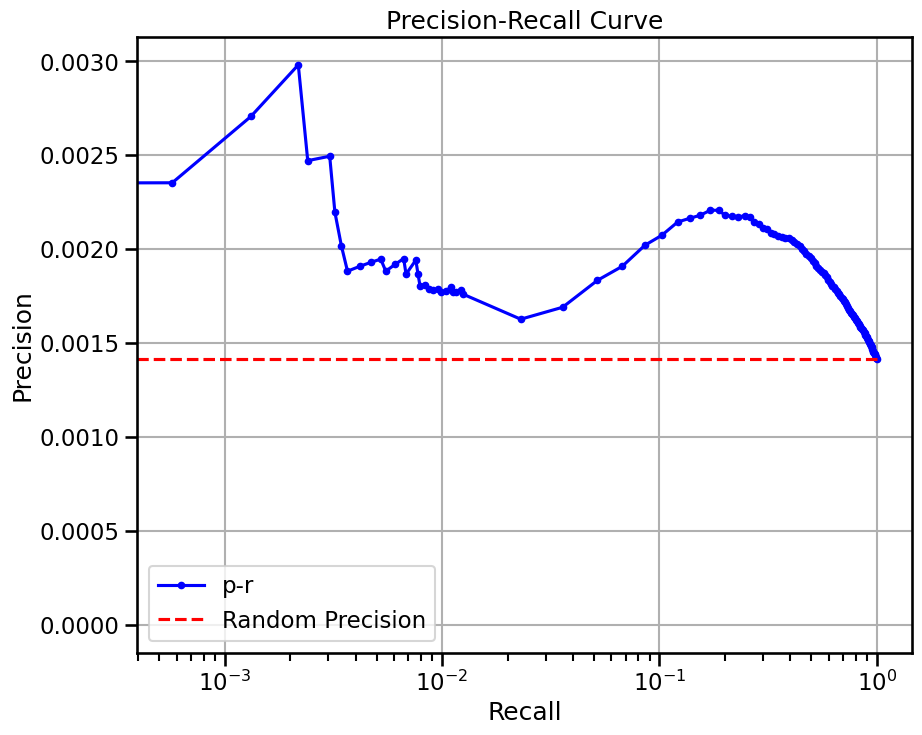

base enrichment


Top central genes: []


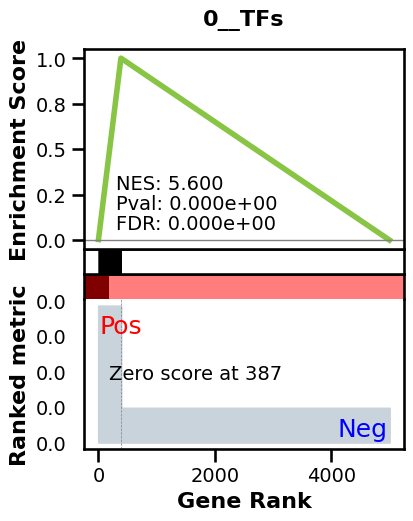

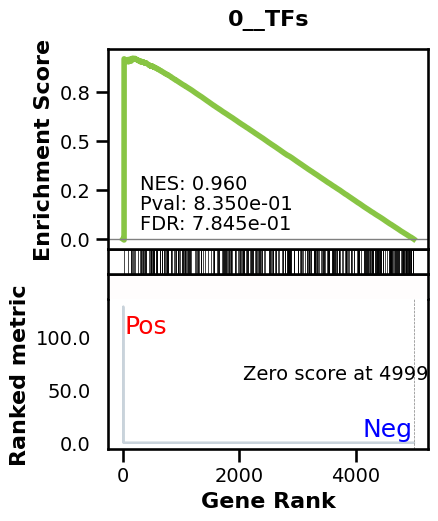

_________________________________________
TF specific enrichment


found some significant results for  2.0833333333333335 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3511 genes
intersection pct: 0.7022
precision:  0.007612673505194292 
recall:  0.50745669381668 
random precision: 0.001414682872956869



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 48.52it/s]


  8%|▊         | 10/128 [00:00<00:02, 48.71it/s]


 12%|█▏        | 15/128 [00:00<00:02, 48.70it/s]


 16%|█▌        | 20/128 [00:00<00:02, 48.36it/s]


 20%|█▉        | 25/128 [00:00<00:02, 48.34it/s]


 23%|██▎       | 30/128 [00:00<00:02, 48.23it/s]


 27%|██▋       | 35/128 [00:00<00:01, 48.44it/s]


 31%|███▏      | 40/128 [00:00<00:01, 48.60it/s]


 35%|███▌      | 45/128 [00:00<00:01, 48.50it/s]


 39%|███▉      | 50/128 [00:01<00:01, 39.04it/s]


 43%|████▎     | 55/128 [00:01<00:01, 41.58it/s]


 47%|████▋     | 60/128 [00:01<00:01, 43.47it/s]


 51%|█████     | 65/128 [00:01<00:01, 44.97it/s]


 55%|█████▍    | 70/128 [00:01<00:01, 46.02it/s]


 59%|█████▊    | 75/128 [00:01<00:01, 46.69it/s]


 62%|██████▎   | 80/128 [00:01<00:01, 46.96it/s]


 66%|██████▋   | 85/128 [00:01<00:00, 47.30it/s]


 70%|███████   | 90/128 [00:01<00:00, 47.61it/s]


 74%|███████▍  | 95/128 [00:02<00:00, 47.74it/s]


 78%|███████▊  | 100/128 [00:02<00:00, 47.93it/s]


 82%|████████▏ | 105/128 [00:02<00:00, 47.86it/s]


 86%|████████▌ | 110/128 [00:02<00:00, 48.09it/s]


 90%|████████▉ | 115/128 [00:02<00:00, 47.91it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 47.33it/s]


 98%|█████████▊| 125/128 [00:02<00:00, 47.59it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 46.79it/s]

Average Precision (AP):  0.007888226236081182
Area Under Precision-Recall Curve (AUPRC):  0.0072502405470152385
EPR: 16.012405615818103


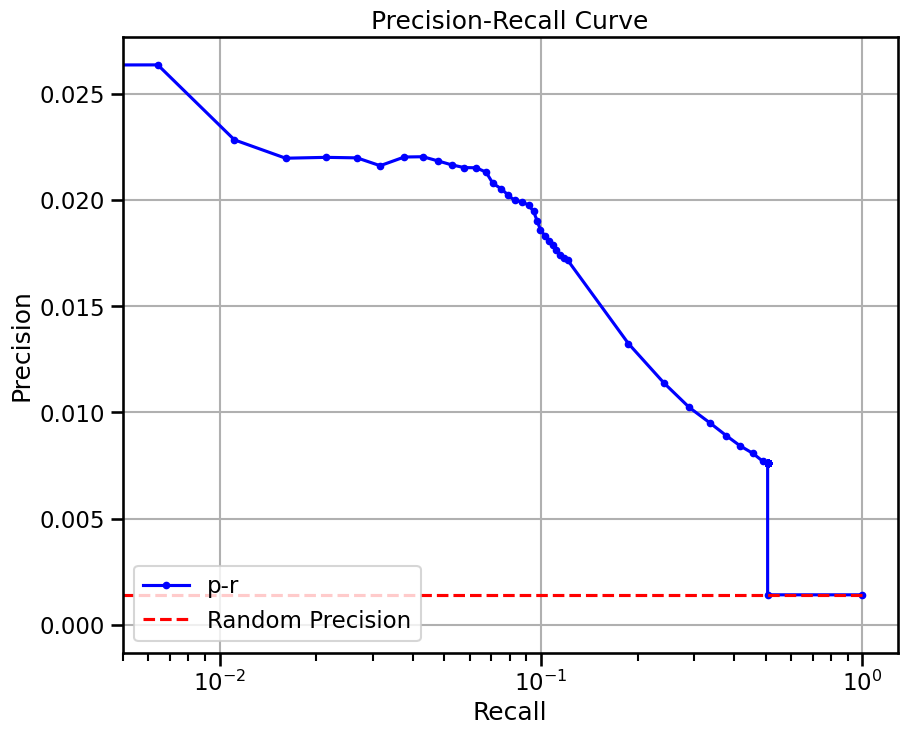


  0%|          | 0/2 [00:00<?, ?it/s]


 50%|█████     | 1/2 [00:06<00:06,  6.26s/it]


100%|██████████| 2/2 [00:10<00:00,  5.02s/it]


100%|██████████| 2/2 [00:10<00:00,  5.29s/it]

avg link count: 488586816, sparsity: 1.0


base enrichment


too many genes for central computation


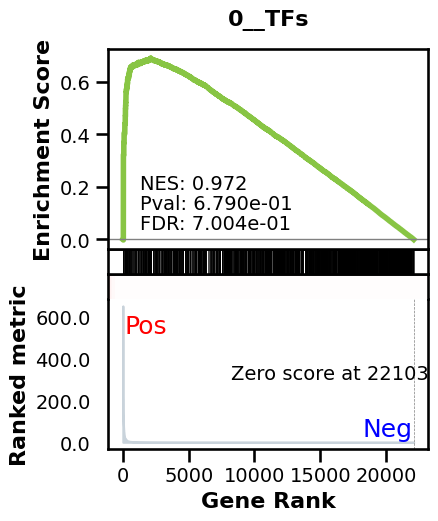

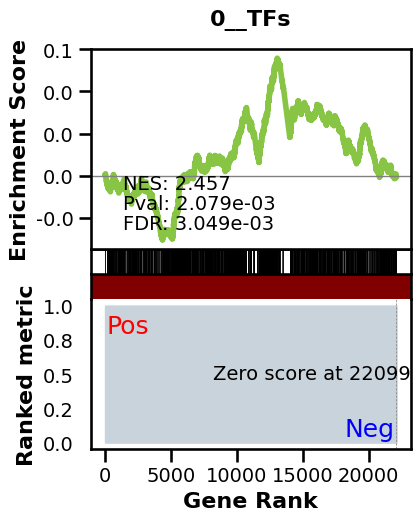

_________________________________________
TF specific enrichment


found some significant results for  59.82142857142857 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12029 genes
intersection pct: 0.5442001447701773


precision:  0.0009127289793424032 
recall:  1.0 
random precision: 0.0009128048630287469



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:25,  5.00it/s]


  2%|▏         | 2/128 [00:00<00:25,  4.97it/s]


  2%|▏         | 3/128 [00:00<00:25,  4.98it/s]


  3%|▎         | 4/128 [00:00<00:28,  4.33it/s]


  4%|▍         | 5/128 [00:01<00:27,  4.54it/s]


  5%|▍         | 6/128 [00:01<00:26,  4.67it/s]


  5%|▌         | 7/128 [00:01<00:25,  4.76it/s]


  6%|▋         | 8/128 [00:01<00:24,  4.82it/s]


  7%|▋         | 9/128 [00:01<00:24,  4.86it/s]


  8%|▊         | 10/128 [00:02<00:24,  4.89it/s]


  9%|▊         | 11/128 [00:02<00:23,  4.91it/s]


  9%|▉         | 12/128 [00:02<00:23,  4.92it/s]


 10%|█         | 13/128 [00:02<00:23,  4.93it/s]


 11%|█         | 14/128 [00:02<00:23,  4.94it/s]


 12%|█▏        | 15/128 [00:03<00:22,  4.95it/s]


 12%|█▎        | 16/128 [00:03<00:22,  4.95it/s]


 13%|█▎        | 17/128 [00:03<00:22,  4.95it/s]


 14%|█▍        | 18/128 [00:03<00:22,  4.96it/s]


 15%|█▍        | 19/128 [00:03<00:21,  4.97it/s]


 16%|█▌        | 20/128 [00:04<00:21,  4.97it/s]


 16%|█▋        | 21/128 [00:04<00:21,  4.97it/s]


 17%|█▋        | 22/128 [00:04<00:21,  4.98it/s]


 18%|█▊        | 23/128 [00:04<00:21,  4.97it/s]


 19%|█▉        | 24/128 [00:04<00:20,  4.96it/s]


 20%|█▉        | 25/128 [00:05<00:20,  4.96it/s]


 20%|██        | 26/128 [00:05<00:20,  4.96it/s]


 21%|██        | 27/128 [00:05<00:20,  4.96it/s]


 22%|██▏       | 28/128 [00:05<00:20,  4.96it/s]


 23%|██▎       | 29/128 [00:05<00:19,  4.96it/s]


 23%|██▎       | 30/128 [00:06<00:19,  4.97it/s]


 24%|██▍       | 31/128 [00:06<00:19,  4.97it/s]


 25%|██▌       | 32/128 [00:06<00:19,  4.97it/s]


 26%|██▌       | 33/128 [00:06<00:19,  4.97it/s]


 27%|██▋       | 34/128 [00:06<00:18,  4.97it/s]


 27%|██▋       | 35/128 [00:07<00:18,  4.96it/s]


 28%|██▊       | 36/128 [00:07<00:18,  4.96it/s]


 29%|██▉       | 37/128 [00:07<00:18,  4.96it/s]


 30%|██▉       | 38/128 [00:07<00:18,  4.96it/s]


 30%|███       | 39/128 [00:07<00:17,  4.96it/s]


 31%|███▏      | 40/128 [00:08<00:17,  4.97it/s]


 32%|███▏      | 41/128 [00:08<00:17,  4.97it/s]


 33%|███▎      | 42/128 [00:08<00:17,  4.97it/s]


 34%|███▎      | 43/128 [00:08<00:17,  4.96it/s]


 34%|███▍      | 44/128 [00:08<00:16,  4.95it/s]


 35%|███▌      | 45/128 [00:09<00:16,  4.96it/s]


 36%|███▌      | 46/128 [00:09<00:16,  4.96it/s]


 37%|███▋      | 47/128 [00:09<00:16,  4.96it/s]


 38%|███▊      | 48/128 [00:09<00:16,  4.96it/s]


 38%|███▊      | 49/128 [00:09<00:15,  4.96it/s]


 39%|███▉      | 50/128 [00:10<00:15,  4.97it/s]


 40%|███▉      | 51/128 [00:10<00:15,  4.96it/s]


 41%|████      | 52/128 [00:10<00:15,  4.96it/s]


 41%|████▏     | 53/128 [00:10<00:15,  4.97it/s]


 42%|████▏     | 54/128 [00:10<00:14,  4.97it/s]


 43%|████▎     | 55/128 [00:11<00:14,  4.97it/s]


 44%|████▍     | 56/128 [00:11<00:14,  4.96it/s]


 45%|████▍     | 57/128 [00:11<00:14,  4.96it/s]


 45%|████▌     | 58/128 [00:11<00:14,  4.96it/s]


 46%|████▌     | 59/128 [00:11<00:13,  4.95it/s]


 47%|████▋     | 60/128 [00:12<00:13,  4.95it/s]


 48%|████▊     | 61/128 [00:12<00:13,  4.95it/s]


 48%|████▊     | 62/128 [00:12<00:13,  4.96it/s]


 49%|████▉     | 63/128 [00:12<00:13,  4.96it/s]


 50%|█████     | 64/128 [00:12<00:12,  4.95it/s]


 51%|█████     | 65/128 [00:13<00:12,  4.95it/s]


 52%|█████▏    | 66/128 [00:13<00:12,  4.95it/s]


 52%|█████▏    | 67/128 [00:13<00:12,  4.95it/s]


 53%|█████▎    | 68/128 [00:13<00:12,  4.95it/s]


 54%|█████▍    | 69/128 [00:13<00:11,  4.95it/s]


 55%|█████▍    | 70/128 [00:14<00:11,  4.96it/s]


 55%|█████▌    | 71/128 [00:14<00:11,  4.96it/s]


 56%|█████▋    | 72/128 [00:14<00:11,  4.96it/s]


 57%|█████▋    | 73/128 [00:14<00:11,  4.96it/s]


 58%|█████▊    | 74/128 [00:14<00:10,  4.96it/s]


 59%|█████▊    | 75/128 [00:15<00:10,  4.97it/s]


 59%|█████▉    | 76/128 [00:15<00:10,  4.97it/s]


 60%|██████    | 77/128 [00:15<00:10,  4.97it/s]


 61%|██████    | 78/128 [00:15<00:10,  4.97it/s]


 62%|██████▏   | 79/128 [00:15<00:09,  4.97it/s]


 62%|██████▎   | 80/128 [00:16<00:09,  4.96it/s]


 63%|██████▎   | 81/128 [00:16<00:09,  4.97it/s]


 64%|██████▍   | 82/128 [00:16<00:09,  4.97it/s]


 65%|██████▍   | 83/128 [00:16<00:09,  4.97it/s]


 66%|██████▌   | 84/128 [00:17<00:08,  4.97it/s]


 66%|██████▋   | 85/128 [00:17<00:08,  4.97it/s]


 67%|██████▋   | 86/128 [00:17<00:08,  4.97it/s]


 68%|██████▊   | 87/128 [00:17<00:08,  4.97it/s]


 69%|██████▉   | 88/128 [00:17<00:08,  4.97it/s]


 70%|██████▉   | 89/128 [00:18<00:07,  4.97it/s]


 70%|███████   | 90/128 [00:18<00:07,  4.97it/s]


 71%|███████   | 91/128 [00:18<00:07,  4.97it/s]


 72%|███████▏  | 92/128 [00:18<00:07,  4.96it/s]


 73%|███████▎  | 93/128 [00:18<00:07,  4.96it/s]


 73%|███████▎  | 94/128 [00:19<00:06,  4.96it/s]


 74%|███████▍  | 95/128 [00:19<00:06,  4.96it/s]


 75%|███████▌  | 96/128 [00:19<00:06,  4.96it/s]


 76%|███████▌  | 97/128 [00:19<00:06,  4.96it/s]


 77%|███████▋  | 98/128 [00:19<00:06,  4.96it/s]


 77%|███████▋  | 99/128 [00:20<00:05,  4.96it/s]


 78%|███████▊  | 100/128 [00:20<00:05,  4.97it/s]


 79%|███████▉  | 101/128 [00:20<00:05,  4.96it/s]


 80%|███████▉  | 102/128 [00:20<00:05,  4.97it/s]


 80%|████████  | 103/128 [00:20<00:05,  4.97it/s]


 81%|████████▏ | 104/128 [00:21<00:04,  4.97it/s]


 82%|████████▏ | 105/128 [00:21<00:04,  4.97it/s]


 83%|████████▎ | 106/128 [00:21<00:04,  4.97it/s]


 84%|████████▎ | 107/128 [00:21<00:04,  4.97it/s]


 84%|████████▍ | 108/128 [00:21<00:04,  4.97it/s]


 85%|████████▌ | 109/128 [00:22<00:03,  4.96it/s]


 86%|████████▌ | 110/128 [00:22<00:03,  4.95it/s]


 87%|████████▋ | 111/128 [00:22<00:03,  4.95it/s]


 88%|████████▊ | 112/128 [00:22<00:03,  4.94it/s]


 88%|████████▊ | 113/128 [00:22<00:03,  4.95it/s]


 89%|████████▉ | 114/128 [00:23<00:02,  4.95it/s]


 90%|████████▉ | 115/128 [00:23<00:02,  4.95it/s]


 91%|█████████ | 116/128 [00:23<00:02,  4.95it/s]


 91%|█████████▏| 117/128 [00:23<00:02,  4.96it/s]


 92%|█████████▏| 118/128 [00:23<00:02,  4.95it/s]


 93%|█████████▎| 119/128 [00:24<00:01,  4.95it/s]


 94%|█████████▍| 120/128 [00:24<00:01,  4.95it/s]


 95%|█████████▍| 121/128 [00:24<00:01,  4.95it/s]


 95%|█████████▌| 122/128 [00:24<00:01,  4.95it/s]


 96%|█████████▌| 123/128 [00:24<00:01,  4.95it/s]


 97%|█████████▋| 124/128 [00:25<00:00,  4.95it/s]


 98%|█████████▊| 125/128 [00:25<00:00,  4.95it/s]


 98%|█████████▊| 126/128 [00:25<00:00,  4.95it/s]


 99%|█████████▉| 127/128 [00:25<00:00,  4.92it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:25<00:00,  4.93it/s]


100%|██████████| 128/128 [00:25<00:00,  4.95it/s]

Average Precision (AP):  0.001077169794855714
Area Under Precision-Recall Curve (AUPRC):  0.0010769677360814955


EPR: 1.6943419754719535


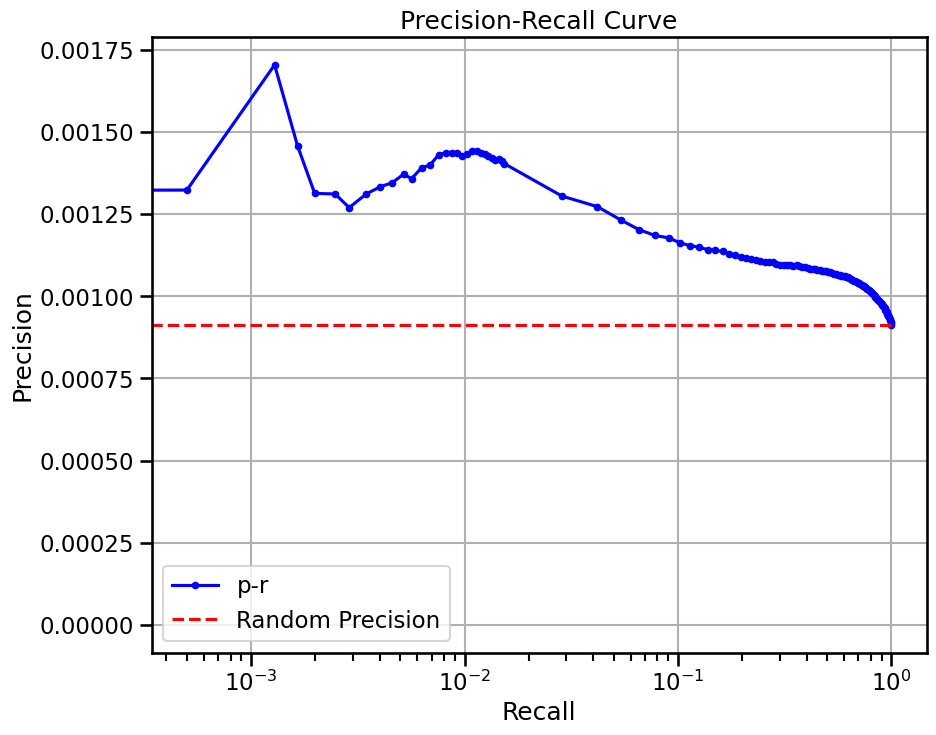


  0%|          | 0/3 [00:00<?, ?it/s]


 33%|███▎      | 1/3 [00:09<00:19,  9.77s/it]


 67%|██████▋   | 2/3 [00:12<00:05,  5.84s/it]


100%|██████████| 3/3 [00:21<00:00,  7.11s/it]


100%|██████████| 3/3 [00:21<00:00,  7.25s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


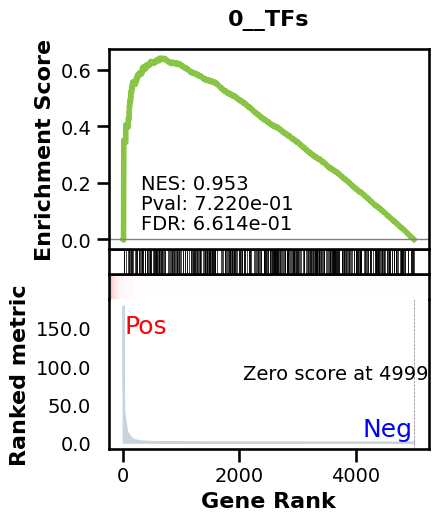

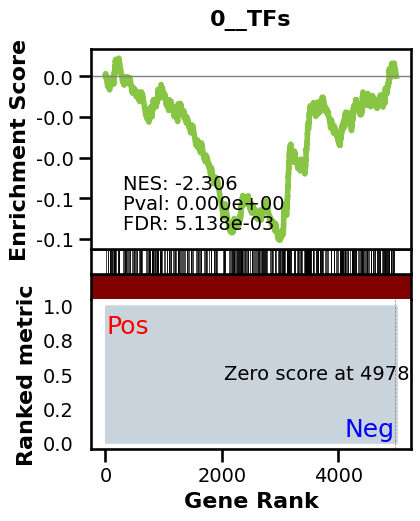

_________________________________________
TF specific enrichment


found some significant results for  23.80952380952381 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3536 genes
intersection pct: 0.7072
precision:  0.0013506038727708277 
recall:  1.0 
random precision: 0.0013509859389300276



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 55.51it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.60it/s]


 14%|█▍        | 18/128 [00:00<00:01, 55.63it/s]


 19%|█▉        | 24/128 [00:00<00:01, 55.51it/s]


 23%|██▎       | 30/128 [00:00<00:01, 55.52it/s]


 28%|██▊       | 36/128 [00:00<00:01, 55.52it/s]


 33%|███▎      | 42/128 [00:00<00:01, 55.27it/s]


 38%|███▊      | 48/128 [00:00<00:01, 55.16it/s]


 42%|████▏     | 54/128 [00:00<00:01, 55.36it/s]


 47%|████▋     | 60/128 [00:01<00:01, 55.49it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 55.46it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 55.27it/s]


 61%|██████    | 78/128 [00:01<00:00, 55.38it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 55.42it/s]


 70%|███████   | 90/128 [00:01<00:00, 55.54it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 55.46it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 55.52it/s]


 84%|████████▍ | 108/128 [00:01<00:00, 55.62it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 55.44it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 55.52it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 55.32it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 55.38it/s]

Average Precision (AP):  0.0015079391518097833
Area Under Precision-Recall Curve (AUPRC):  0.0015074274782339626


EPR: 0.8763581651319855


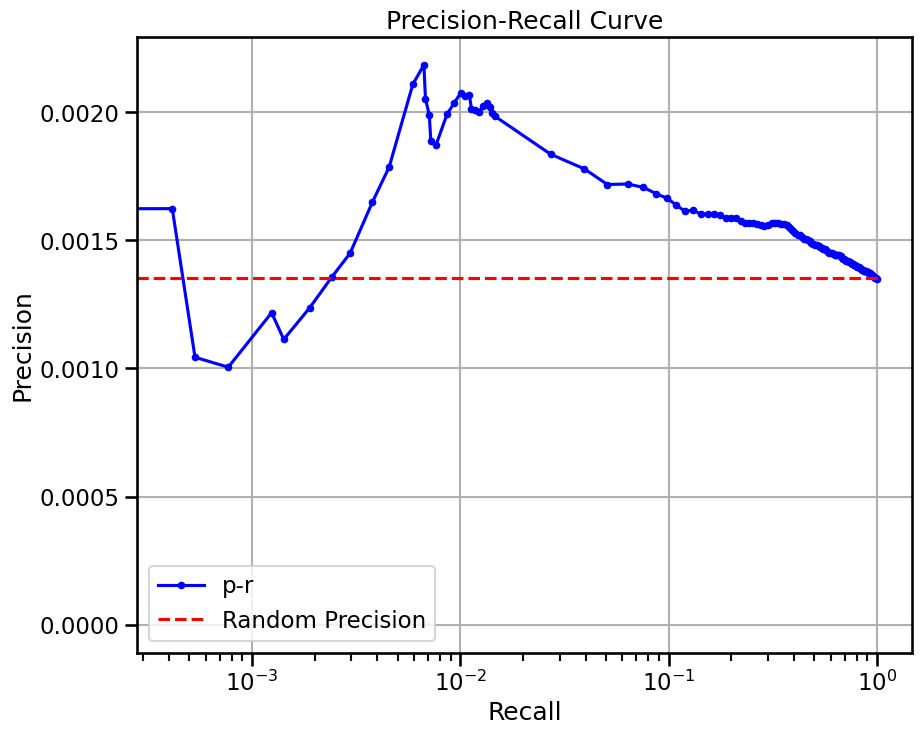

base enrichment


Top central genes: []


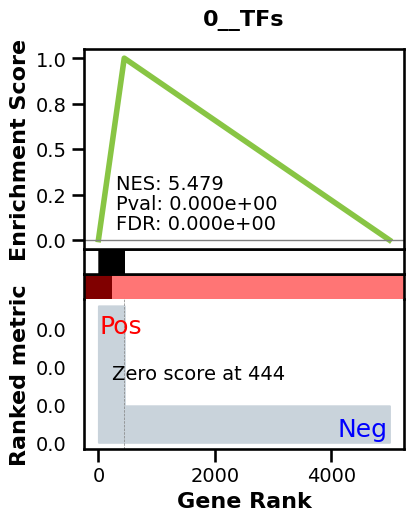

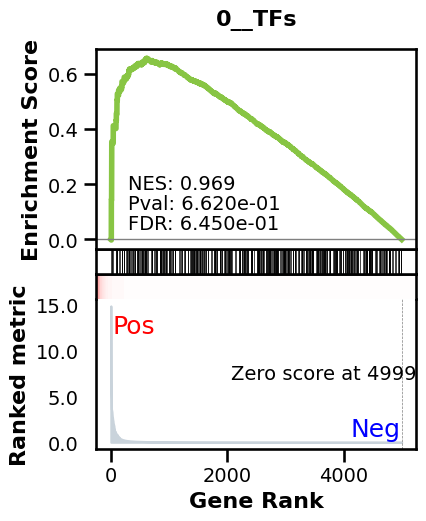

_________________________________________
TF specific enrichment


found some significant results for  14.285714285714286 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3536 genes
intersection pct: 0.7072
precision:  0.006564024211083035 
recall:  0.5291644460235684 
random precision: 0.0013509859389300276



  0%|          | 0/128 [00:00<?, ?it/s]


  4%|▍         | 5/128 [00:00<00:02, 48.63it/s]


  8%|▊         | 10/128 [00:00<00:02, 48.44it/s]


 12%|█▏        | 15/128 [00:00<00:02, 48.44it/s]


 16%|█▌        | 20/128 [00:00<00:02, 48.51it/s]


 20%|█▉        | 25/128 [00:00<00:02, 48.40it/s]


 23%|██▎       | 30/128 [00:00<00:02, 48.41it/s]


 27%|██▋       | 35/128 [00:00<00:01, 48.50it/s]


 31%|███▏      | 40/128 [00:00<00:01, 48.49it/s]


 35%|███▌      | 45/128 [00:00<00:01, 48.50it/s]


 39%|███▉      | 50/128 [00:01<00:01, 48.49it/s]


 43%|████▎     | 55/128 [00:01<00:01, 48.52it/s]


 47%|████▋     | 60/128 [00:01<00:01, 48.59it/s]


 51%|█████     | 65/128 [00:01<00:01, 48.59it/s]


 55%|█████▍    | 70/128 [00:01<00:01, 48.53it/s]


 59%|█████▊    | 75/128 [00:01<00:01, 48.58it/s]


 62%|██████▎   | 80/128 [00:01<00:00, 48.53it/s]


 66%|██████▋   | 85/128 [00:01<00:00, 48.59it/s]


 70%|███████   | 90/128 [00:01<00:00, 48.50it/s]


 74%|███████▍  | 95/128 [00:01<00:00, 48.03it/s]


 78%|███████▊  | 100/128 [00:02<00:00, 48.17it/s]


 82%|████████▏ | 105/128 [00:02<00:00, 48.30it/s]


 86%|████████▌ | 110/128 [00:02<00:00, 48.45it/s]


 90%|████████▉ | 115/128 [00:02<00:00, 48.51it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 48.54it/s]


 98%|█████████▊| 125/128 [00:02<00:00, 48.61it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 48.47it/s]

Average Precision (AP):  0.005352453664725343
Area Under Precision-Recall Curve (AUPRC):  0.004858237909762494
EPR: 8.221705300059472


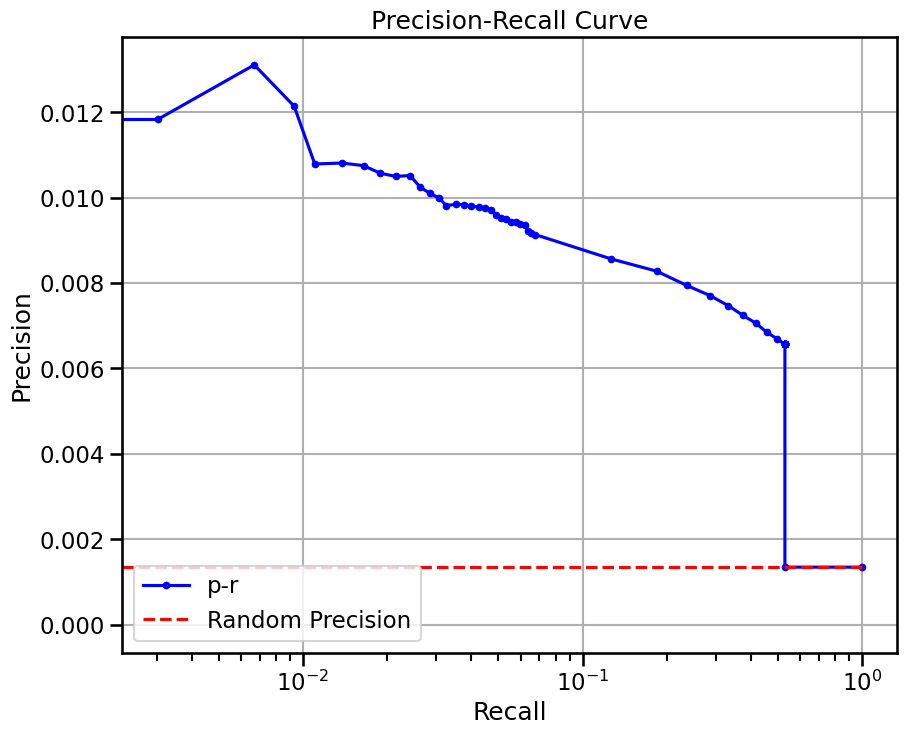

base enrichment


Top central genes: []
The DataFrame contains only the same values.


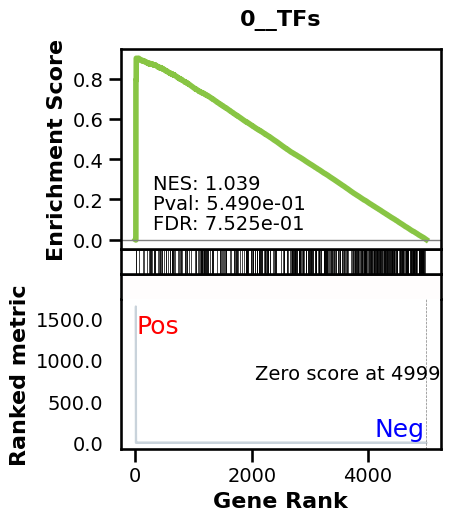

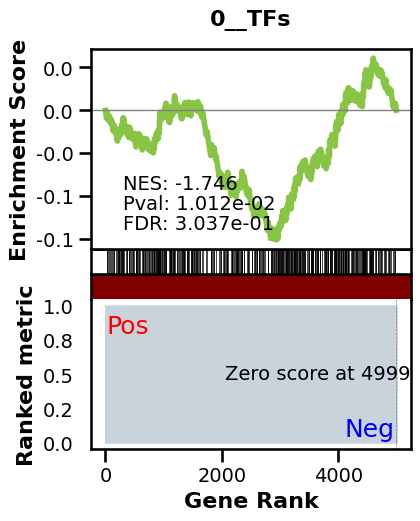

_________________________________________
TF specific enrichment


found some significant results for  11.904761904761905 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3536 genes
intersection pct: 0.7072
precision:  0.0013506038727708277 
recall:  1.0 
random precision: 0.0013509859389300276



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 52.66it/s]


  9%|▉         | 12/128 [00:00<00:02, 53.33it/s]


 14%|█▍        | 18/128 [00:00<00:02, 53.17it/s]


 19%|█▉        | 24/128 [00:00<00:01, 53.30it/s]


 23%|██▎       | 30/128 [00:00<00:01, 53.38it/s]


 28%|██▊       | 36/128 [00:00<00:01, 53.66it/s]


 33%|███▎      | 42/128 [00:00<00:01, 53.55it/s]


 38%|███▊      | 48/128 [00:00<00:01, 53.69it/s]


 42%|████▏     | 54/128 [00:01<00:01, 53.72it/s]


 47%|████▋     | 60/128 [00:01<00:01, 53.63it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 53.57it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 53.64it/s]


 61%|██████    | 78/128 [00:01<00:00, 53.48it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 53.44it/s]


 70%|███████   | 90/128 [00:01<00:00, 53.66it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 53.70it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 53.51it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 52.79it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 53.38it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 53.59it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 53.85it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 53.51it/s]

Average Precision (AP):  0.0020084346136481092
Area Under Precision-Recall Curve (AUPRC):  0.0020023497851532155
EPR: 2.5529365914315325


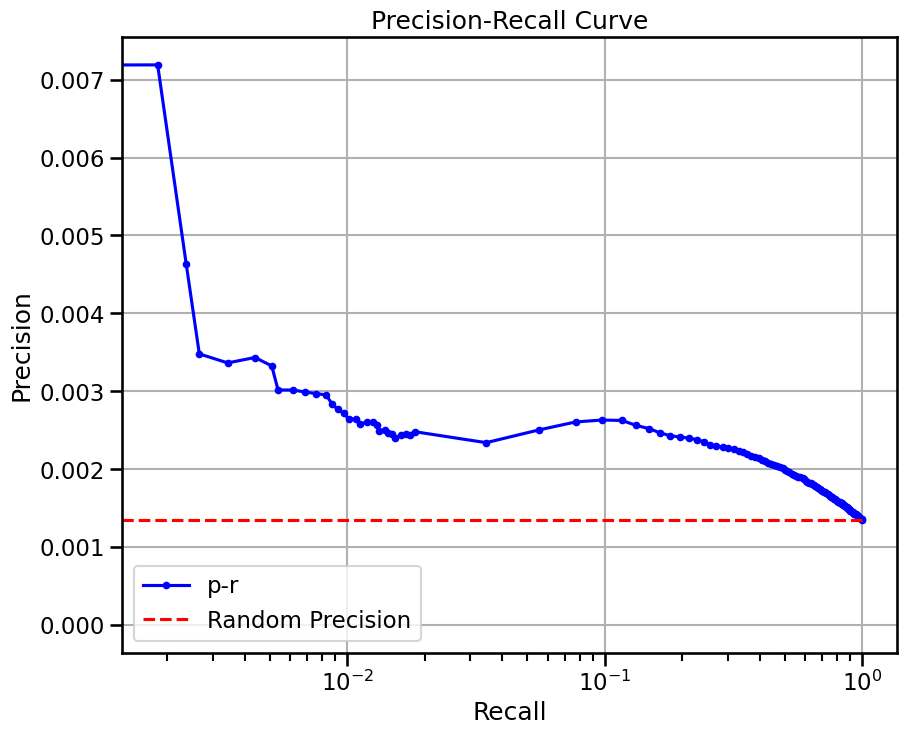

base enrichment


Top central genes: []


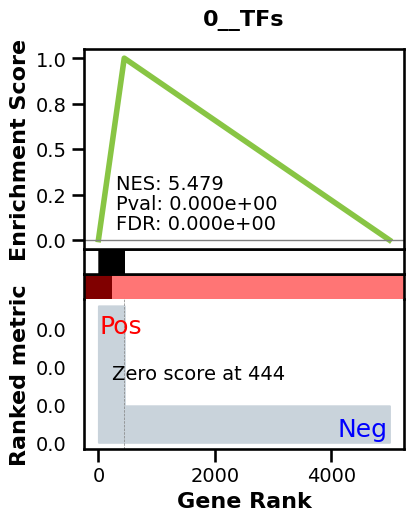

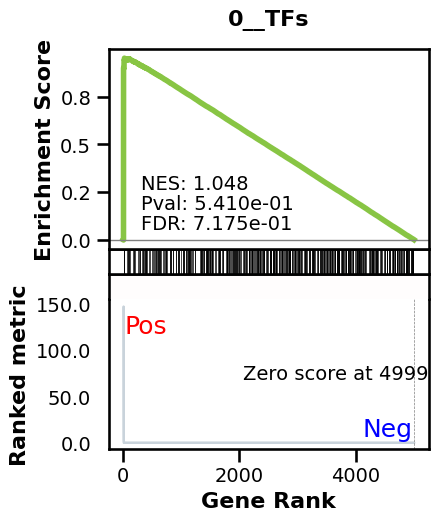

_________________________________________
TF specific enrichment


found some significant results for  9.523809523809524 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3536 genes
intersection pct: 0.7072
precision:  0.006564024211083035 
recall:  0.5291644460235684 
random precision: 0.0013509859389300276



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 54.82it/s]


  9%|▉         | 12/128 [00:00<00:02, 55.10it/s]


 14%|█▍        | 18/128 [00:00<00:02, 54.64it/s]


 19%|█▉        | 24/128 [00:00<00:01, 54.76it/s]


 23%|██▎       | 30/128 [00:00<00:01, 53.93it/s]


 28%|██▊       | 36/128 [00:00<00:01, 53.76it/s]


 33%|███▎      | 42/128 [00:00<00:01, 53.77it/s]


 38%|███▊      | 48/128 [00:00<00:01, 53.66it/s]


 42%|████▏     | 54/128 [00:00<00:01, 54.17it/s]


 47%|████▋     | 60/128 [00:01<00:01, 54.03it/s]


 52%|█████▏    | 66/128 [00:01<00:01, 54.21it/s]


 56%|█████▋    | 72/128 [00:01<00:01, 53.57it/s]


 61%|██████    | 78/128 [00:01<00:00, 53.44it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 53.30it/s]


 70%|███████   | 90/128 [00:01<00:00, 53.59it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 53.42it/s]


 80%|███████▉  | 102/128 [00:01<00:00, 53.95it/s]


 84%|████████▍ | 108/128 [00:02<00:00, 53.89it/s]


 89%|████████▉ | 114/128 [00:02<00:00, 53.46it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 53.47it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 53.26it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 53.75it/s]

Average Precision (AP):  0.008155271538027259
Area Under Precision-Recall Curve (AUPRC):  0.007606453929581312
EPR: 20.229272014048046


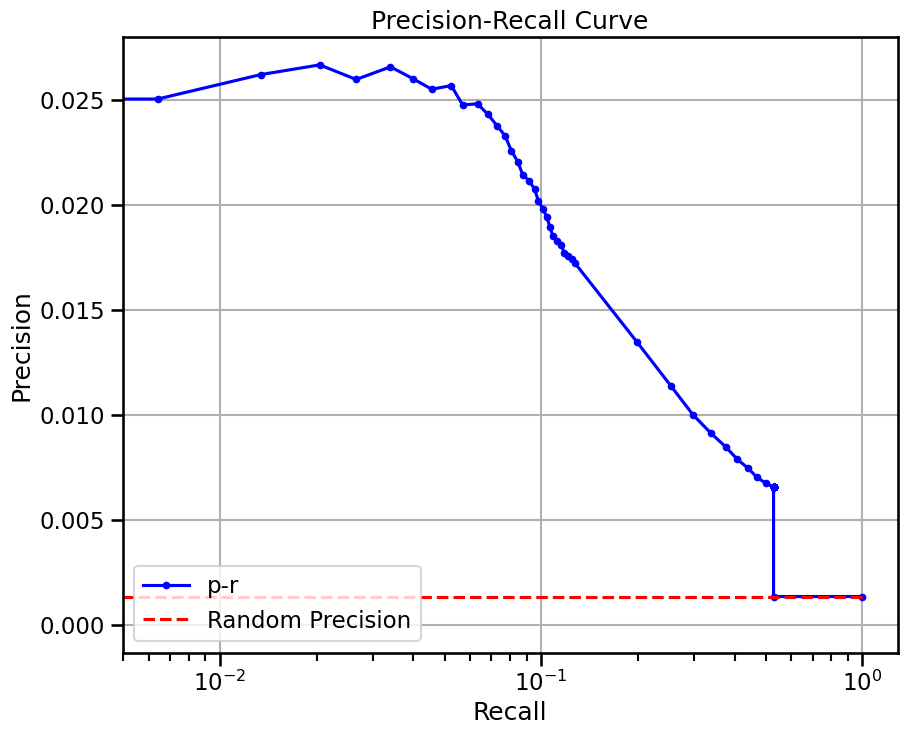


  0%|          | 0/8 [00:00<?, ?it/s]


 12%|█▎        | 1/8 [00:04<00:30,  4.29s/it]


 25%|██▌       | 2/8 [00:06<00:18,  3.01s/it]


 38%|███▊      | 3/8 [00:08<00:14,  2.81s/it]


 50%|█████     | 4/8 [00:10<00:08,  2.12s/it]


 62%|██████▎   | 5/8 [00:11<00:05,  1.73s/it]


 75%|███████▌  | 6/8 [00:12<00:03,  1.75s/it]


 88%|████████▊ | 7/8 [00:13<00:01,  1.51s/it]


100%|██████████| 8/8 [00:15<00:00,  1.66s/it]


100%|██████████| 8/8 [00:16<00:00,  2.01s/it]

avg link count: 535876201, sparsity: 1.0


base enrichment


too many genes for central computation


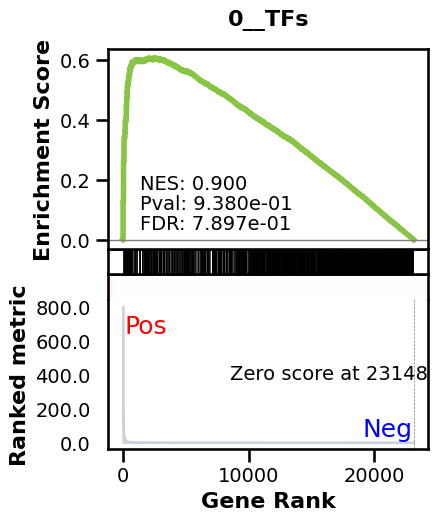

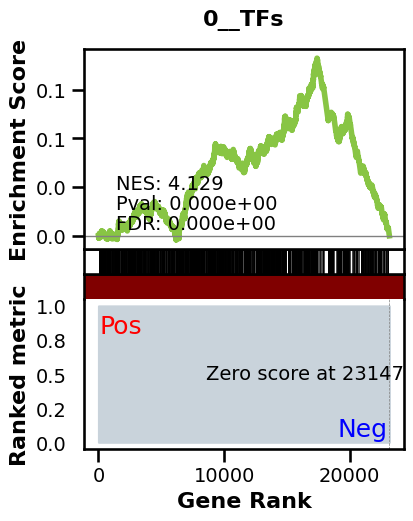

_________________________________________
TF specific enrichment


found some significant results for  66.07142857142857 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:28,  4.42it/s]


  2%|▏         | 2/128 [00:00<00:28,  4.38it/s]


  2%|▏         | 3/128 [00:00<00:28,  4.41it/s]


  3%|▎         | 4/128 [00:00<00:28,  4.37it/s]


  4%|▍         | 5/128 [00:01<00:28,  4.38it/s]


  5%|▍         | 6/128 [00:01<00:27,  4.36it/s]


  5%|▌         | 7/128 [00:01<00:27,  4.39it/s]


  6%|▋         | 8/128 [00:01<00:27,  4.39it/s]


  7%|▋         | 9/128 [00:02<00:27,  4.40it/s]


  8%|▊         | 10/128 [00:02<00:26,  4.39it/s]


  9%|▊         | 11/128 [00:02<00:26,  4.40it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.40it/s]


 10%|█         | 13/128 [00:02<00:26,  4.42it/s]


 11%|█         | 14/128 [00:03<00:25,  4.41it/s]


 12%|█▏        | 15/128 [00:03<00:25,  4.42it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.41it/s]


 13%|█▎        | 17/128 [00:03<00:25,  4.42it/s]


 14%|█▍        | 18/128 [00:04<00:24,  4.41it/s]


 15%|█▍        | 19/128 [00:04<00:24,  4.43it/s]


 16%|█▌        | 20/128 [00:04<00:24,  4.42it/s]


 16%|█▋        | 21/128 [00:04<00:24,  4.43it/s]


 17%|█▋        | 22/128 [00:04<00:23,  4.42it/s]


 18%|█▊        | 23/128 [00:05<00:23,  4.43it/s]


 19%|█▉        | 24/128 [00:05<00:23,  4.40it/s]


 20%|█▉        | 25/128 [00:05<00:23,  4.42it/s]


 20%|██        | 26/128 [00:05<00:23,  4.42it/s]


 21%|██        | 27/128 [00:06<00:22,  4.40it/s]


 22%|██▏       | 28/128 [00:06<00:22,  4.39it/s]


 23%|██▎       | 29/128 [00:06<00:22,  4.38it/s]


 23%|██▎       | 30/128 [00:06<00:22,  4.39it/s]


 24%|██▍       | 31/128 [00:07<00:22,  4.39it/s]


 25%|██▌       | 32/128 [00:07<00:21,  4.40it/s]


 26%|██▌       | 33/128 [00:07<00:21,  4.41it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.40it/s]


 27%|██▋       | 35/128 [00:07<00:21,  4.42it/s]


 28%|██▊       | 36/128 [00:08<00:20,  4.41it/s]


 29%|██▉       | 37/128 [00:08<00:20,  4.42it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.41it/s]


 30%|███       | 39/128 [00:08<00:20,  4.43it/s]


 31%|███▏      | 40/128 [00:09<00:19,  4.43it/s]


 32%|███▏      | 41/128 [00:09<00:19,  4.43it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.43it/s]


 34%|███▎      | 43/128 [00:09<00:19,  4.44it/s]


 34%|███▍      | 44/128 [00:09<00:18,  4.43it/s]


 35%|███▌      | 45/128 [00:10<00:18,  4.44it/s]


 36%|███▌      | 46/128 [00:10<00:18,  4.42it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.42it/s]


 38%|███▊      | 48/128 [00:10<00:18,  4.41it/s]


 38%|███▊      | 49/128 [00:11<00:17,  4.39it/s]


 39%|███▉      | 50/128 [00:11<00:17,  4.42it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.42it/s]


 41%|████      | 52/128 [00:11<00:17,  4.39it/s]


 41%|████▏     | 53/128 [00:12<00:17,  4.41it/s]


 42%|████▏     | 54/128 [00:12<00:16,  4.39it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.41it/s]


 44%|████▍     | 56/128 [00:12<00:16,  4.41it/s]


 45%|████▍     | 57/128 [00:12<00:16,  4.42it/s]


 45%|████▌     | 58/128 [00:13<00:15,  4.38it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.39it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.40it/s]


 48%|████▊     | 61/128 [00:13<00:15,  4.39it/s]


 48%|████▊     | 62/128 [00:14<00:14,  4.40it/s]


 49%|████▉     | 63/128 [00:14<00:14,  4.41it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.28it/s]


 51%|█████     | 65/128 [00:14<00:14,  4.32it/s]


 52%|█████▏    | 66/128 [00:14<00:14,  4.35it/s]


 52%|█████▏    | 67/128 [00:15<00:13,  4.38it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.39it/s]


 54%|█████▍    | 69/128 [00:15<00:13,  4.41it/s]


 55%|█████▍    | 70/128 [00:15<00:13,  4.41it/s]


 55%|█████▌    | 71/128 [00:16<00:12,  4.41it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.39it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.41it/s]


 58%|█████▊    | 74/128 [00:16<00:12,  4.37it/s]


 59%|█████▊    | 75/128 [00:17<00:12,  4.39it/s]


 59%|█████▉    | 76/128 [00:17<00:11,  4.37it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.35it/s]


 61%|██████    | 78/128 [00:17<00:11,  4.35it/s]


 62%|██████▏   | 79/128 [00:17<00:11,  4.38it/s]


 62%|██████▎   | 80/128 [00:18<00:10,  4.38it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.40it/s]


 64%|██████▍   | 82/128 [00:18<00:10,  4.40it/s]


 65%|██████▍   | 83/128 [00:18<00:10,  4.32it/s]


 66%|██████▌   | 84/128 [00:19<00:10,  4.35it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.37it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.38it/s]


 68%|██████▊   | 87/128 [00:19<00:09,  4.40it/s]


 69%|██████▉   | 88/128 [00:20<00:09,  4.40it/s]


 70%|██████▉   | 89/128 [00:20<00:08,  4.41it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.41it/s]


 71%|███████   | 91/128 [00:20<00:08,  4.41it/s]


 72%|███████▏  | 92/128 [00:20<00:08,  4.42it/s]


 73%|███████▎  | 93/128 [00:21<00:07,  4.42it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.43it/s]


 74%|███████▍  | 95/128 [00:21<00:07,  4.42it/s]


 75%|███████▌  | 96/128 [00:21<00:07,  4.41it/s]


 76%|███████▌  | 97/128 [00:22<00:07,  4.41it/s]


 77%|███████▋  | 98/128 [00:22<00:06,  4.42it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.38it/s]


 78%|███████▊  | 100/128 [00:22<00:06,  4.40it/s]


 79%|███████▉  | 101/128 [00:22<00:06,  4.38it/s]


 80%|███████▉  | 102/128 [00:23<00:05,  4.40it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.38it/s]


 81%|████████▏ | 104/128 [00:23<00:05,  4.41it/s]


 82%|████████▏ | 105/128 [00:23<00:05,  4.41it/s]


 83%|████████▎ | 106/128 [00:24<00:04,  4.42it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.41it/s]


 84%|████████▍ | 108/128 [00:24<00:04,  4.43it/s]


 85%|████████▌ | 109/128 [00:24<00:04,  4.43it/s]


 86%|████████▌ | 110/128 [00:24<00:04,  4.42it/s]


 87%|████████▋ | 111/128 [00:25<00:03,  4.42it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.42it/s]


 88%|████████▊ | 113/128 [00:25<00:03,  4.42it/s]


 89%|████████▉ | 114/128 [00:25<00:03,  4.42it/s]


 90%|████████▉ | 115/128 [00:26<00:02,  4.41it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.42it/s]


 91%|█████████▏| 117/128 [00:26<00:02,  4.41it/s]


 92%|█████████▏| 118/128 [00:26<00:02,  4.43it/s]


 93%|█████████▎| 119/128 [00:27<00:02,  4.40it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.42it/s]


 95%|█████████▍| 121/128 [00:27<00:01,  4.38it/s]


 95%|█████████▌| 122/128 [00:27<00:01,  4.40it/s]


 96%|█████████▌| 123/128 [00:27<00:01,  4.39it/s]


 97%|█████████▋| 124/128 [00:28<00:00,  4.37it/s]


 98%|█████████▊| 125/128 [00:28<00:00,  4.39it/s]


 98%|█████████▊| 126/128 [00:28<00:00,  4.38it/s]


 99%|█████████▉| 127/128 [00:28<00:00,  4.40it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:29<00:00,  4.40it/s]


100%|██████████| 128/128 [00:29<00:00,  4.40it/s]

Average Precision (AP):  0.0010742714946324187
Area Under Precision-Recall Curve (AUPRC):  0.001073502426690566


EPR: 2.1135635492242177


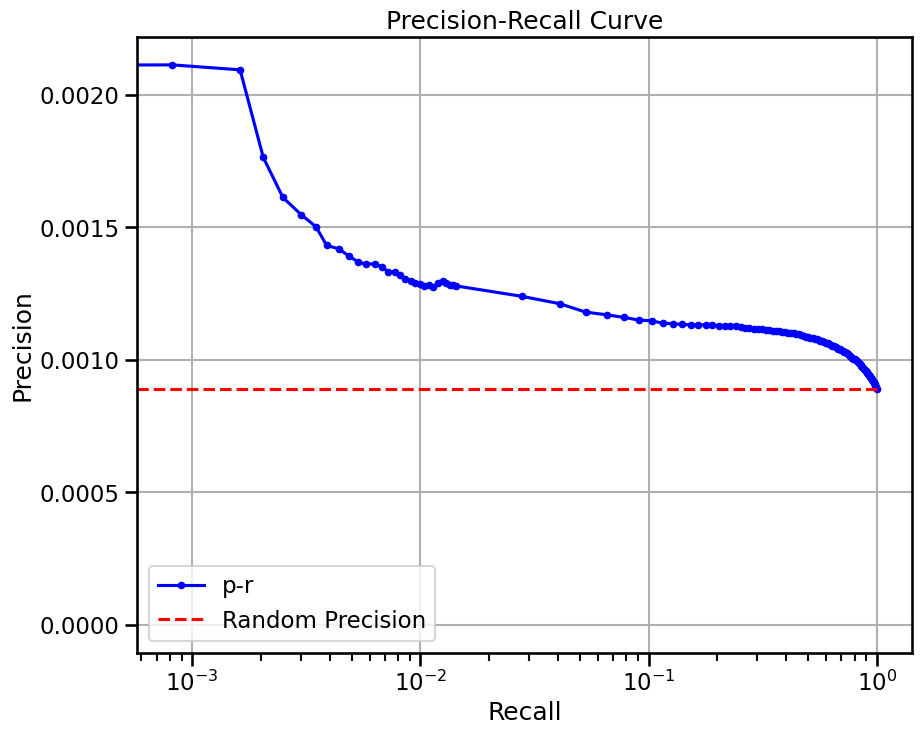


  0%|          | 0/16 [00:00<?, ?it/s]


  6%|▋         | 1/16 [00:02<00:35,  2.37s/it]


 12%|█▎        | 2/16 [00:03<00:23,  1.65s/it]


 19%|█▉        | 3/16 [00:04<00:18,  1.42s/it]


 25%|██▌       | 4/16 [00:05<00:15,  1.31s/it]


 31%|███▏      | 5/16 [00:06<00:13,  1.25s/it]


 38%|███▊      | 6/16 [00:08<00:12,  1.22s/it]


 44%|████▍     | 7/16 [00:09<00:10,  1.21s/it]


 50%|█████     | 8/16 [00:10<00:09,  1.20s/it]


 56%|█████▋    | 9/16 [00:11<00:08,  1.19s/it]


 62%|██████▎   | 10/16 [00:12<00:07,  1.18s/it]


 69%|██████▉   | 11/16 [00:13<00:05,  1.18s/it]


 75%|███████▌  | 12/16 [00:15<00:04,  1.18s/it]


 81%|████████▏ | 13/16 [00:16<00:03,  1.18s/it]


 88%|████████▊ | 14/16 [00:17<00:02,  1.17s/it]


 94%|█████████▍| 15/16 [00:18<00:01,  1.17s/it]


100%|██████████| 16/16 [00:19<00:00,  1.11s/it]


100%|██████████| 16/16 [00:19<00:00,  1.24s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


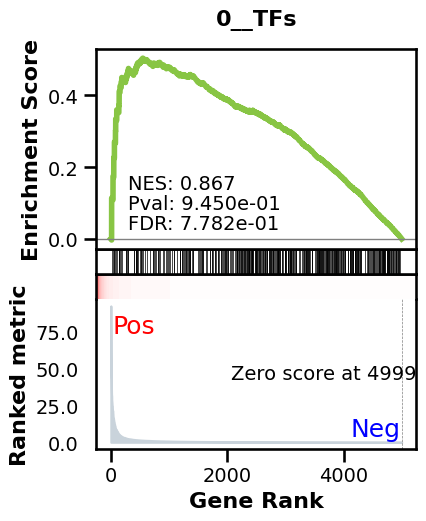

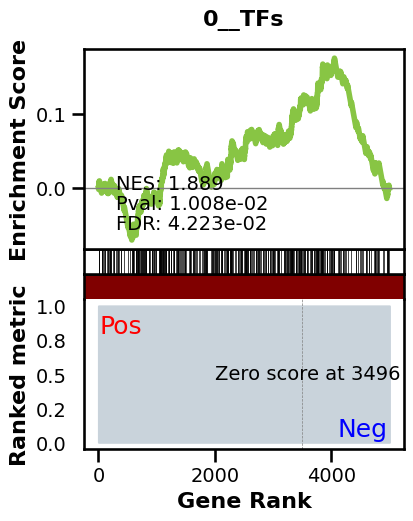

_________________________________________
TF specific enrichment


found some significant results for  33.333333333333336 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2763 genes
intersection pct: 0.5526
precision:  0.0013802419097612326 
recall:  1.0 
random precision: 0.0013807416352897488



  0%|          | 0/128 [00:00<?, ?it/s]


  6%|▋         | 8/128 [00:00<00:01, 78.78it/s]


 12%|█▎        | 16/128 [00:00<00:01, 79.04it/s]


 19%|█▉        | 24/128 [00:00<00:01, 78.97it/s]


 25%|██▌       | 32/128 [00:00<00:01, 78.89it/s]


 31%|███▏      | 40/128 [00:00<00:01, 78.95it/s]


 38%|███▊      | 48/128 [00:00<00:01, 79.05it/s]


 44%|████▍     | 56/128 [00:00<00:00, 79.01it/s]


 50%|█████     | 64/128 [00:00<00:00, 78.99it/s]


 56%|█████▋    | 72/128 [00:00<00:00, 79.30it/s]


 62%|██████▎   | 80/128 [00:01<00:00, 79.36it/s]


 69%|██████▉   | 88/128 [00:01<00:00, 79.43it/s]


 75%|███████▌  | 96/128 [00:01<00:00, 79.23it/s]


 81%|████████▏ | 104/128 [00:01<00:00, 79.13it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 79.17it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 79.20it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:01<00:00, 79.04it/s]


100%|██████████| 128/128 [00:01<00:00, 79.08it/s]

Average Precision (AP):  0.001717302011630567
Area Under Precision-Recall Curve (AUPRC):  0.0017148180574565056
EPR: 1.376103160796211


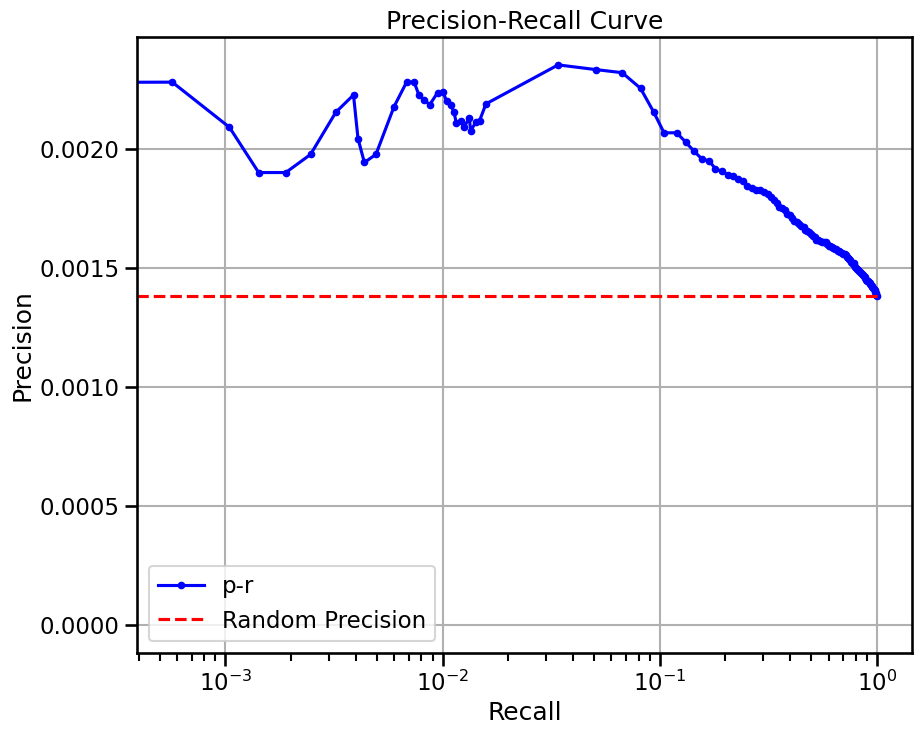

base enrichment


Top central genes: []


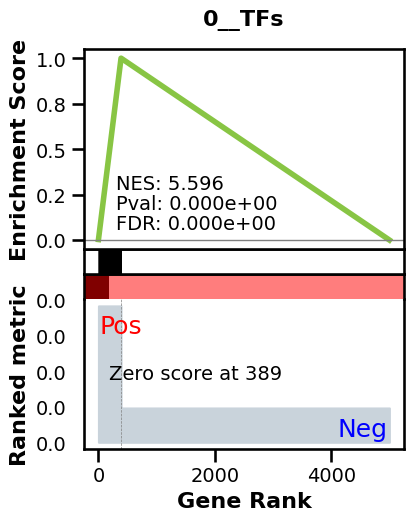

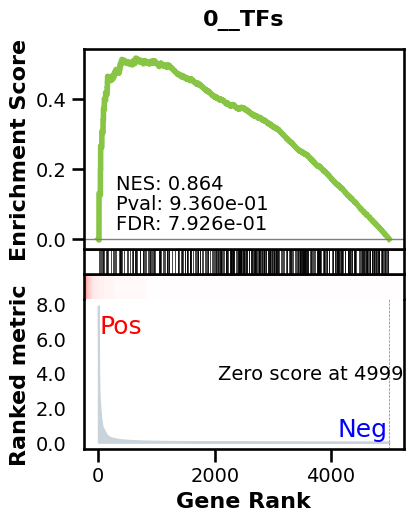

_________________________________________
TF specific enrichment


found some significant results for  4.166666666666667 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2763 genes
intersection pct: 0.5526
precision:  0.007077897576199607 
recall:  0.6106102306159248 
random precision: 0.0013807416352897488



  0%|          | 0/128 [00:00<?, ?it/s]


  6%|▋         | 8/128 [00:00<00:01, 79.60it/s]


 13%|█▎        | 17/128 [00:00<00:01, 80.17it/s]


 20%|██        | 26/128 [00:00<00:01, 80.19it/s]


 27%|██▋       | 35/128 [00:00<00:01, 80.14it/s]


 34%|███▍      | 44/128 [00:00<00:01, 80.16it/s]


 41%|████▏     | 53/128 [00:00<00:00, 80.16it/s]


 48%|████▊     | 62/128 [00:00<00:00, 80.24it/s]


 55%|█████▌    | 71/128 [00:00<00:00, 80.06it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 80.04it/s]


 70%|██████▉   | 89/128 [00:01<00:00, 80.15it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 80.19it/s]


 84%|████████▎ | 107/128 [00:01<00:00, 80.24it/s]


 91%|█████████ | 116/128 [00:01<00:00, 80.29it/s]


 98%|█████████▊| 125/128 [00:01<00:00, 80.32it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 80.15it/s]

Average Precision (AP):  0.006269645552433898
Area Under Precision-Recall Curve (AUPRC):  0.005846335011275789
EPR: 8.416012442425687


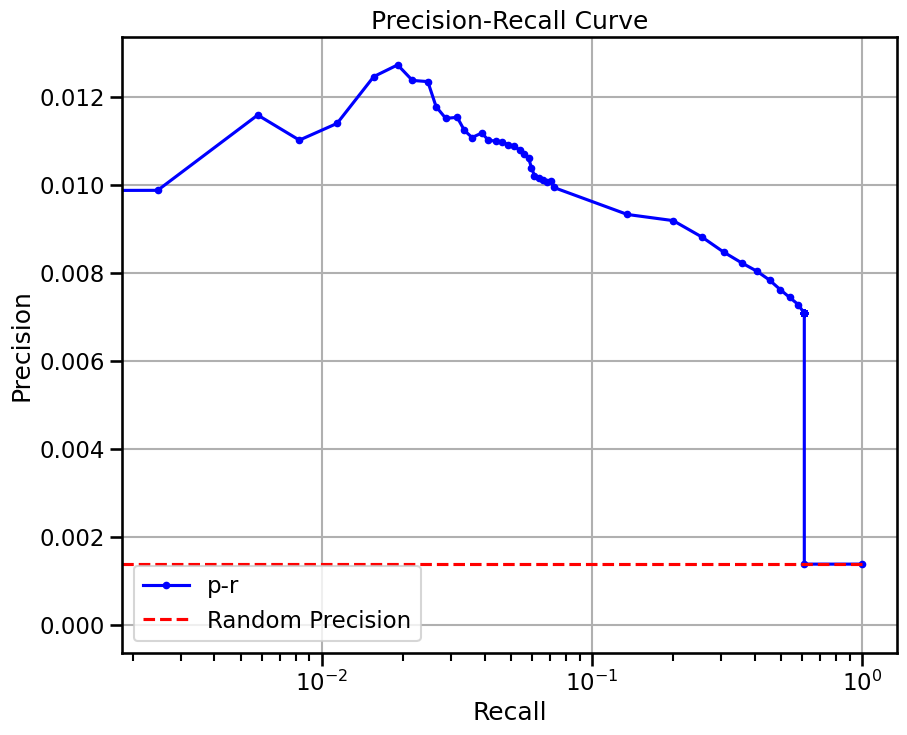

base enrichment


Top central genes: []
The DataFrame contains only the same values.


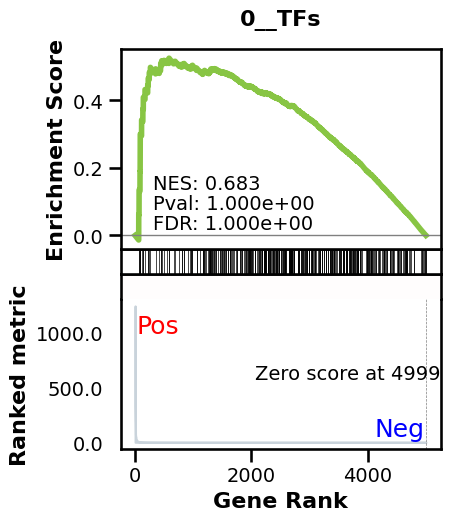

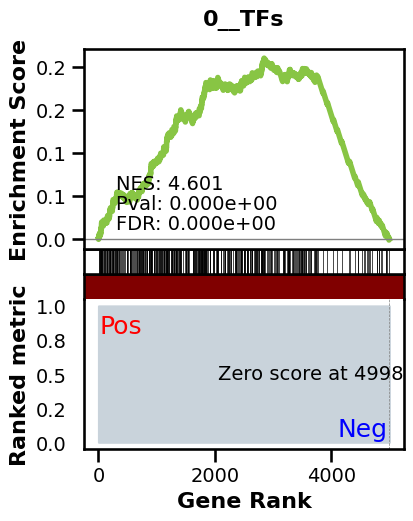

_________________________________________
TF specific enrichment


found some significant results for  8.333333333333334 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2763 genes
intersection pct: 0.5526
precision:  0.0013802419097612326 
recall:  1.0 
random precision: 0.0013807416352897488



  0%|          | 0/128 [00:00<?, ?it/s]


  8%|▊         | 10/128 [00:00<00:01, 90.10it/s]


 16%|█▌        | 20/128 [00:00<00:01, 90.01it/s]


 23%|██▎       | 30/128 [00:00<00:01, 90.01it/s]


 31%|███▏      | 40/128 [00:00<00:00, 90.08it/s]


 39%|███▉      | 50/128 [00:00<00:00, 90.12it/s]


 47%|████▋     | 60/128 [00:00<00:00, 90.12it/s]


 55%|█████▍    | 70/128 [00:00<00:00, 90.04it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 90.04it/s]


 70%|███████   | 90/128 [00:00<00:00, 90.00it/s]


 78%|███████▊  | 100/128 [00:01<00:00, 89.94it/s]


 85%|████████▌ | 109/128 [00:01<00:00, 89.89it/s]


 92%|█████████▏| 118/128 [00:01<00:00, 89.91it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 89.88it/s]


100%|██████████| 128/128 [00:01<00:00, 89.94it/s]

Average Precision (AP):  0.0012797868554791816
Area Under Precision-Recall Curve (AUPRC):  0.0012660840614129548
EPR: 1.1000450161273083


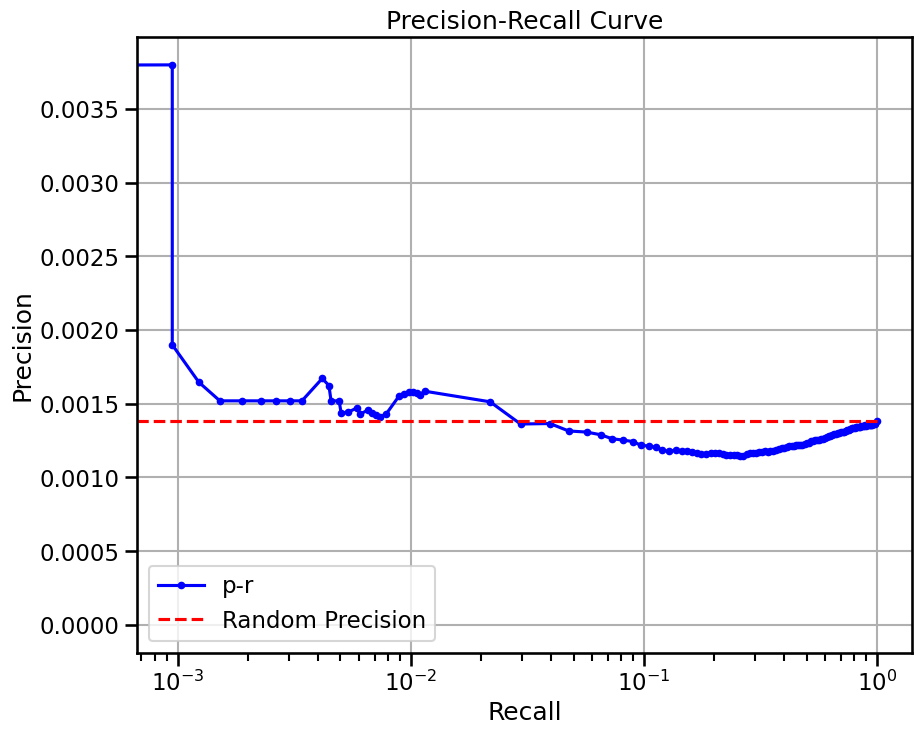

base enrichment


Top central genes: []


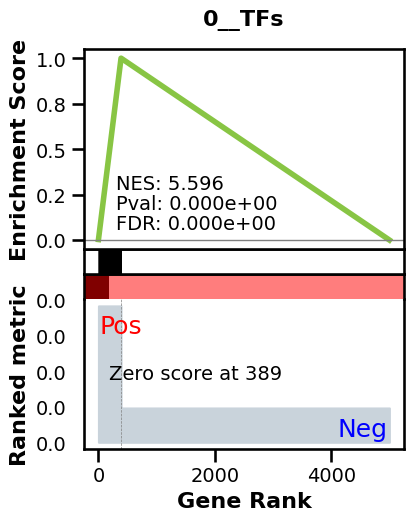

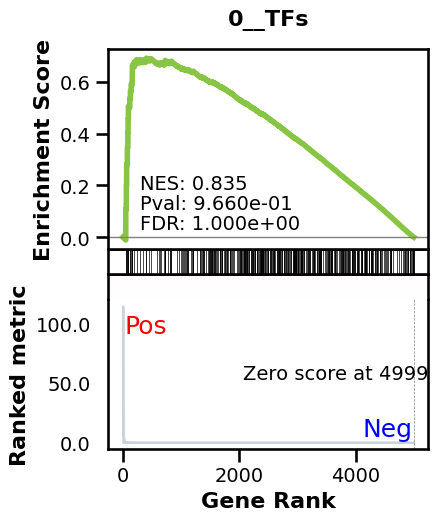

_________________________________________
TF specific enrichment


found some significant results for  4.166666666666667 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2763 genes
intersection pct: 0.5526
precision:  0.007077897576199607 
recall:  0.6106102306159248 
random precision: 0.0013807416352897488



  0%|          | 0/128 [00:00<?, ?it/s]


  8%|▊         | 10/128 [00:00<00:01, 90.62it/s]


 16%|█▌        | 20/128 [00:00<00:01, 90.60it/s]


 23%|██▎       | 30/128 [00:00<00:01, 90.58it/s]


 31%|███▏      | 40/128 [00:00<00:00, 90.70it/s]


 39%|███▉      | 50/128 [00:00<00:00, 90.77it/s]


 47%|████▋     | 60/128 [00:00<00:00, 90.83it/s]


 55%|█████▍    | 70/128 [00:00<00:00, 90.84it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 88.78it/s]


 70%|███████   | 90/128 [00:00<00:00, 89.29it/s]


 78%|███████▊  | 100/128 [00:01<00:00, 89.75it/s]


 86%|████████▌ | 110/128 [00:01<00:00, 90.07it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 90.32it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 90.20it/s]

Average Precision (AP):  0.004924199212892394
Area Under Precision-Recall Curve (AUPRC):  0.004447488732306727
EPR: 6.063107099196447


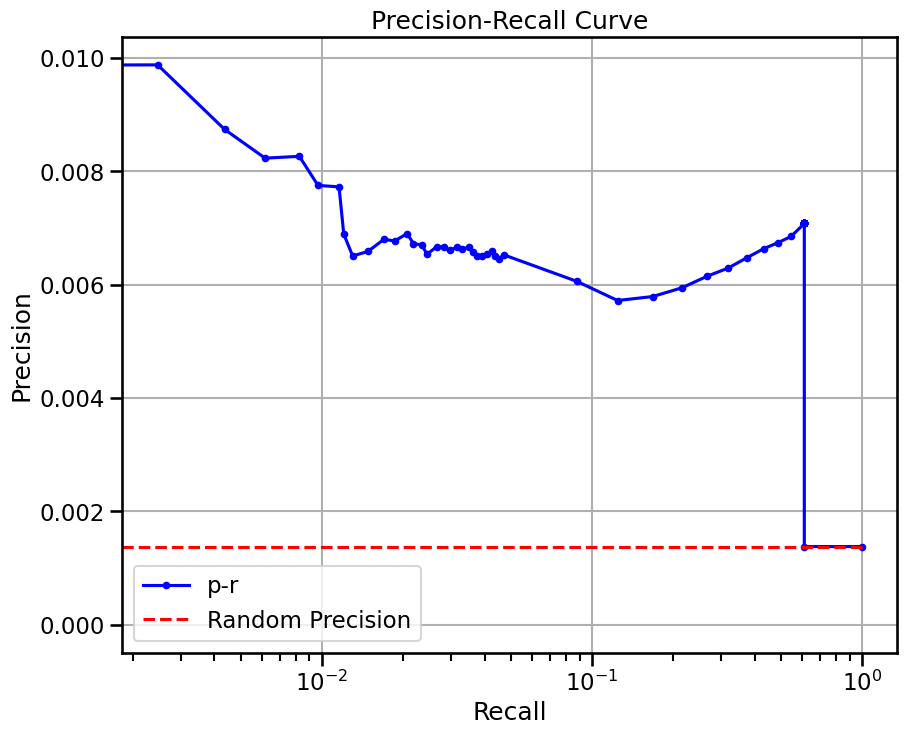


  0%|          | 0/6 [00:00<?, ?it/s]


 17%|█▋        | 1/6 [00:02<00:11,  2.30s/it]


 33%|███▎      | 2/6 [00:03<00:06,  1.61s/it]


 50%|█████     | 3/6 [00:04<00:03,  1.31s/it]


 67%|██████▋   | 4/6 [00:05<00:02,  1.17s/it]


 83%|████████▎ | 5/6 [00:06<00:01,  1.11s/it]


100%|██████████| 6/6 [00:07<00:00,  1.02it/s]


100%|██████████| 6/6 [00:07<00:00,  1.21s/it]

avg link count: 535876201, sparsity: 1.0


base enrichment


too many genes for central computation


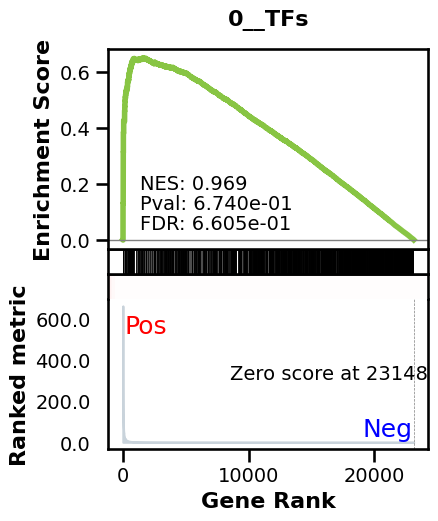

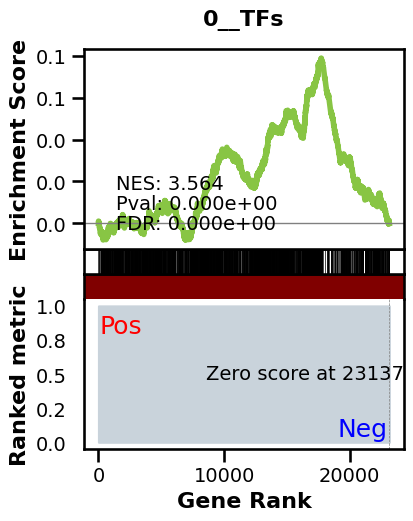

_________________________________________
TF specific enrichment


found some significant results for  63.392857142857146 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:28,  4.38it/s]


  2%|▏         | 2/128 [00:00<00:28,  4.37it/s]


  2%|▏         | 3/128 [00:00<00:28,  4.36it/s]


  3%|▎         | 4/128 [00:00<00:28,  4.35it/s]


  4%|▍         | 5/128 [00:01<00:28,  4.35it/s]


  5%|▍         | 6/128 [00:01<00:28,  4.35it/s]


  5%|▌         | 7/128 [00:01<00:27,  4.35it/s]


  6%|▋         | 8/128 [00:01<00:27,  4.34it/s]


  7%|▋         | 9/128 [00:02<00:27,  4.33it/s]


  8%|▊         | 10/128 [00:02<00:27,  4.34it/s]


  9%|▊         | 11/128 [00:02<00:27,  4.33it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.34it/s]


 10%|█         | 13/128 [00:02<00:26,  4.35it/s]


 11%|█         | 14/128 [00:03<00:26,  4.34it/s]


 12%|█▏        | 15/128 [00:03<00:26,  4.34it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.34it/s]


 13%|█▎        | 17/128 [00:03<00:25,  4.34it/s]


 14%|█▍        | 18/128 [00:04<00:25,  4.34it/s]


 15%|█▍        | 19/128 [00:04<00:25,  4.33it/s]


 16%|█▌        | 20/128 [00:04<00:24,  4.33it/s]


 16%|█▋        | 21/128 [00:04<00:24,  4.33it/s]


 17%|█▋        | 22/128 [00:05<00:24,  4.34it/s]


 18%|█▊        | 23/128 [00:05<00:24,  4.34it/s]


 19%|█▉        | 24/128 [00:05<00:26,  3.95it/s]


 20%|█▉        | 25/128 [00:05<00:25,  4.06it/s]


 20%|██        | 26/128 [00:06<00:24,  4.14it/s]


 21%|██        | 27/128 [00:06<00:24,  4.21it/s]


 22%|██▏       | 28/128 [00:06<00:23,  4.25it/s]


 23%|██▎       | 29/128 [00:06<00:23,  4.28it/s]


 23%|██▎       | 30/128 [00:06<00:22,  4.30it/s]


 24%|██▍       | 31/128 [00:07<00:22,  4.30it/s]


 25%|██▌       | 32/128 [00:07<00:22,  4.32it/s]


 26%|██▌       | 33/128 [00:07<00:21,  4.33it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.34it/s]


 27%|██▋       | 35/128 [00:08<00:21,  4.35it/s]


 28%|██▊       | 36/128 [00:08<00:21,  4.34it/s]


 29%|██▉       | 37/128 [00:08<00:20,  4.35it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.34it/s]


 30%|███       | 39/128 [00:09<00:20,  4.34it/s]


 31%|███▏      | 40/128 [00:09<00:20,  4.35it/s]


 32%|███▏      | 41/128 [00:09<00:20,  4.34it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.34it/s]


 34%|███▎      | 43/128 [00:09<00:19,  4.34it/s]


 34%|███▍      | 44/128 [00:10<00:19,  4.34it/s]


 35%|███▌      | 45/128 [00:10<00:19,  4.34it/s]


 36%|███▌      | 46/128 [00:10<00:18,  4.34it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.34it/s]


 38%|███▊      | 48/128 [00:11<00:18,  4.34it/s]


 38%|███▊      | 49/128 [00:11<00:18,  4.34it/s]


 39%|███▉      | 50/128 [00:11<00:17,  4.33it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.33it/s]


 41%|████      | 52/128 [00:12<00:17,  4.34it/s]


 41%|████▏     | 53/128 [00:12<00:17,  4.34it/s]


 42%|████▏     | 54/128 [00:12<00:17,  4.34it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.34it/s]


 44%|████▍     | 56/128 [00:12<00:16,  4.34it/s]


 45%|████▍     | 57/128 [00:13<00:16,  4.34it/s]


 45%|████▌     | 58/128 [00:13<00:16,  4.34it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.35it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.35it/s]


 48%|████▊     | 61/128 [00:14<00:15,  4.35it/s]


 48%|████▊     | 62/128 [00:14<00:15,  4.35it/s]


 49%|████▉     | 63/128 [00:14<00:14,  4.35it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.34it/s]


 51%|█████     | 65/128 [00:15<00:14,  4.35it/s]


 52%|█████▏    | 66/128 [00:15<00:14,  4.35it/s]


 52%|█████▏    | 67/128 [00:15<00:14,  4.36it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.35it/s]


 54%|█████▍    | 69/128 [00:15<00:13,  4.35it/s]


 55%|█████▍    | 70/128 [00:16<00:13,  4.35it/s]


 55%|█████▌    | 71/128 [00:16<00:13,  4.36it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.35it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.35it/s]


 58%|█████▊    | 74/128 [00:17<00:12,  4.35it/s]


 59%|█████▊    | 75/128 [00:17<00:12,  4.35it/s]


 59%|█████▉    | 76/128 [00:17<00:11,  4.36it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.36it/s]


 61%|██████    | 78/128 [00:18<00:11,  4.35it/s]


 62%|██████▏   | 79/128 [00:18<00:11,  4.35it/s]


 62%|██████▎   | 80/128 [00:18<00:11,  4.35it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.35it/s]


 64%|██████▍   | 82/128 [00:18<00:10,  4.35it/s]


 65%|██████▍   | 83/128 [00:19<00:10,  4.34it/s]


 66%|██████▌   | 84/128 [00:19<00:10,  4.35it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.36it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.35it/s]


 68%|██████▊   | 87/128 [00:20<00:09,  4.36it/s]


 69%|██████▉   | 88/128 [00:20<00:09,  4.35it/s]


 70%|██████▉   | 89/128 [00:20<00:08,  4.35it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.35it/s]


 71%|███████   | 91/128 [00:21<00:08,  4.36it/s]


 72%|███████▏  | 92/128 [00:21<00:08,  4.35it/s]


 73%|███████▎  | 93/128 [00:21<00:08,  4.35it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.35it/s]


 74%|███████▍  | 95/128 [00:21<00:07,  4.34it/s]


 75%|███████▌  | 96/128 [00:22<00:07,  4.34it/s]


 76%|███████▌  | 97/128 [00:22<00:07,  4.35it/s]


 77%|███████▋  | 98/128 [00:22<00:06,  4.35it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.35it/s]


 78%|███████▊  | 100/128 [00:23<00:06,  4.35it/s]


 79%|███████▉  | 101/128 [00:23<00:06,  4.35it/s]


 80%|███████▉  | 102/128 [00:23<00:05,  4.35it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.35it/s]


 81%|████████▏ | 104/128 [00:24<00:05,  4.35it/s]


 82%|████████▏ | 105/128 [00:24<00:05,  4.36it/s]


 83%|████████▎ | 106/128 [00:24<00:05,  4.36it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.36it/s]


 84%|████████▍ | 108/128 [00:24<00:04,  4.36it/s]


 85%|████████▌ | 109/128 [00:25<00:04,  4.36it/s]


 86%|████████▌ | 110/128 [00:25<00:04,  4.35it/s]


 87%|████████▋ | 111/128 [00:25<00:03,  4.35it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.35it/s]


 88%|████████▊ | 113/128 [00:26<00:03,  4.35it/s]


 89%|████████▉ | 114/128 [00:26<00:03,  4.35it/s]


 90%|████████▉ | 115/128 [00:26<00:02,  4.35it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.35it/s]


 91%|█████████▏| 117/128 [00:26<00:02,  4.35it/s]


 92%|█████████▏| 118/128 [00:27<00:02,  4.35it/s]


 93%|█████████▎| 119/128 [00:27<00:02,  4.35it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.35it/s]


 95%|█████████▍| 121/128 [00:27<00:01,  4.35it/s]


 95%|█████████▌| 122/128 [00:28<00:01,  4.35it/s]


 96%|█████████▌| 123/128 [00:28<00:01,  4.35it/s]


 97%|█████████▋| 124/128 [00:28<00:00,  4.35it/s]


 98%|█████████▊| 125/128 [00:28<00:00,  4.34it/s]


 98%|█████████▊| 126/128 [00:29<00:00,  4.34it/s]


 99%|█████████▉| 127/128 [00:29<00:00,  4.35it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:29<00:00,  4.34it/s]


100%|██████████| 128/128 [00:29<00:00,  4.34it/s]

Average Precision (AP):  0.0010861021447566054
Area Under Precision-Recall Curve (AUPRC):  0.001085932963102716


EPR: 1.7370207552608286


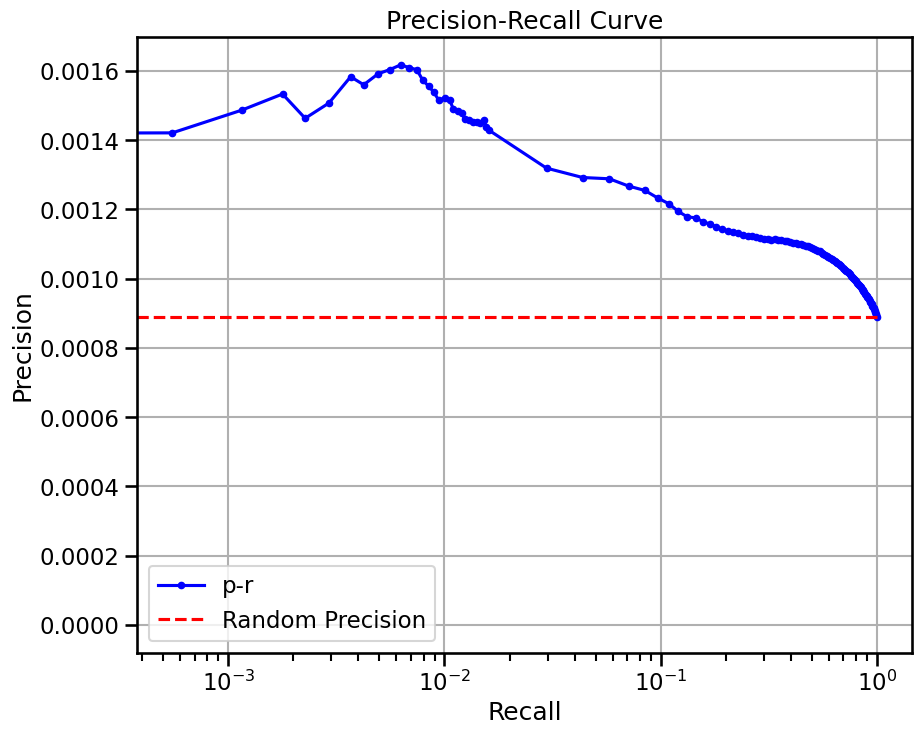


  0%|          | 0/12 [00:00<?, ?it/s]


  8%|▊         | 1/12 [00:02<00:30,  2.74s/it]


 17%|█▋        | 2/12 [00:04<00:19,  1.91s/it]


 25%|██▌       | 3/12 [00:05<00:15,  1.77s/it]


 33%|███▎      | 4/12 [00:06<00:12,  1.59s/it]


 42%|████▏     | 5/12 [00:08<00:10,  1.55s/it]


 50%|█████     | 6/12 [00:09<00:08,  1.49s/it]


 58%|█████▊    | 7/12 [00:11<00:07,  1.45s/it]


 67%|██████▋   | 8/12 [00:12<00:05,  1.41s/it]


 75%|███████▌  | 9/12 [00:13<00:04,  1.38s/it]


 83%|████████▎ | 10/12 [00:15<00:02,  1.36s/it]


 92%|█████████▏| 11/12 [00:16<00:01,  1.35s/it]


100%|██████████| 12/12 [00:17<00:00,  1.15s/it]


100%|██████████| 12/12 [00:17<00:00,  1.45s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


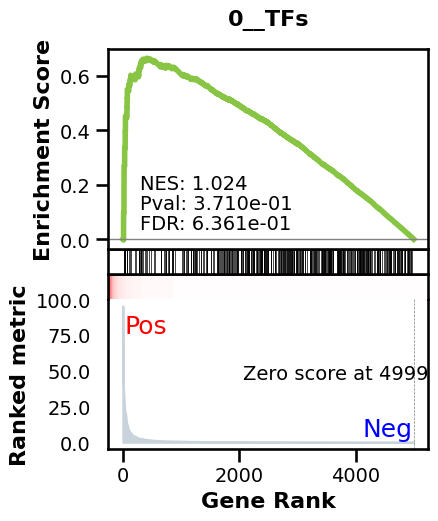

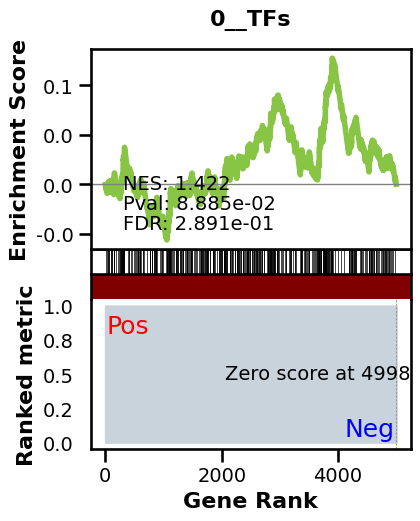

_________________________________________
TF specific enrichment


found some significant results for  14.814814814814815 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3169 genes
intersection pct: 0.6338
precision:  0.00138142053605649 
recall:  1.0 
random precision: 0.001381856590518629



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 68.27it/s]


 11%|█         | 14/128 [00:00<00:01, 68.28it/s]


 16%|█▋        | 21/128 [00:00<00:01, 68.31it/s]


 22%|██▏       | 28/128 [00:00<00:01, 68.31it/s]


 27%|██▋       | 35/128 [00:00<00:01, 68.35it/s]


 33%|███▎      | 42/128 [00:00<00:01, 68.35it/s]


 38%|███▊      | 49/128 [00:00<00:01, 68.36it/s]


 44%|████▍     | 56/128 [00:00<00:01, 68.34it/s]


 49%|████▉     | 63/128 [00:00<00:00, 68.33it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 68.32it/s]


 60%|██████    | 77/128 [00:01<00:00, 68.33it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 68.33it/s]


 71%|███████   | 91/128 [00:01<00:00, 68.35it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 68.35it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 68.37it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 68.33it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 68.35it/s]


 98%|█████████▊| 126/128 [00:01<00:00, 68.36it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 68.30it/s]

Average Precision (AP):  0.001815536675700358
Area Under Precision-Recall Curve (AUPRC):  0.0018147919924962632
EPR: 0.8342336963017163


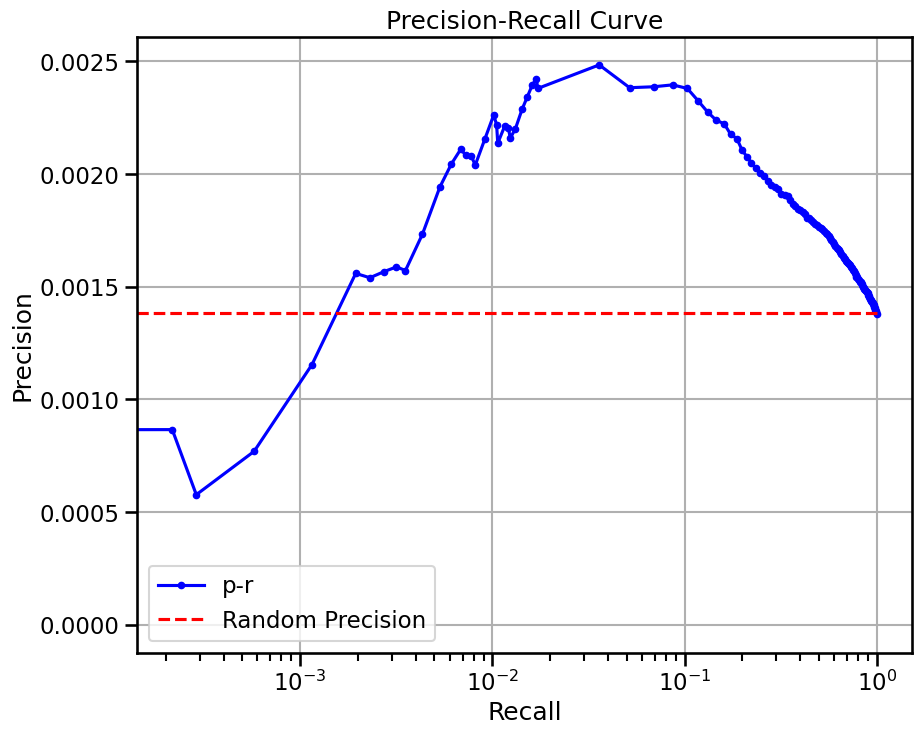

base enrichment


Top central genes: []


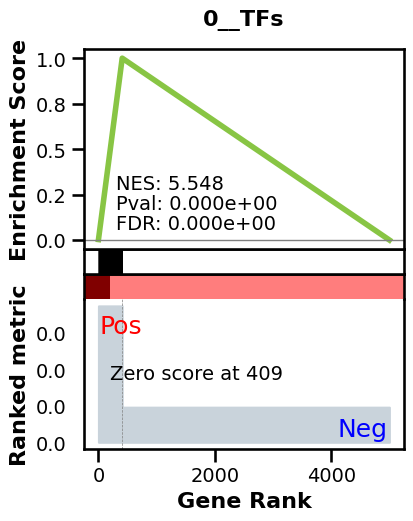

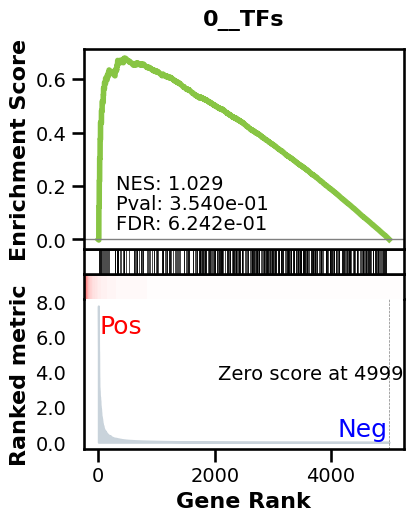

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3169 genes
intersection pct: 0.6338
precision:  0.006449082630843438 
recall:  0.5156058530959418 
random precision: 0.001381856590518629



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▌         | 7/128 [00:00<00:01, 61.93it/s]


 11%|█         | 14/128 [00:00<00:01, 61.94it/s]


 16%|█▋        | 21/128 [00:00<00:01, 61.98it/s]


 22%|██▏       | 28/128 [00:00<00:01, 61.95it/s]


 27%|██▋       | 35/128 [00:00<00:01, 61.95it/s]


 33%|███▎      | 42/128 [00:00<00:01, 61.96it/s]


 38%|███▊      | 49/128 [00:00<00:01, 61.97it/s]


 44%|████▍     | 56/128 [00:00<00:01, 61.95it/s]


 49%|████▉     | 63/128 [00:01<00:01, 61.95it/s]


 55%|█████▍    | 70/128 [00:01<00:00, 61.86it/s]


 60%|██████    | 77/128 [00:01<00:00, 61.33it/s]


 66%|██████▌   | 84/128 [00:01<00:00, 61.38it/s]


 71%|███████   | 91/128 [00:01<00:00, 61.50it/s]


 77%|███████▋  | 98/128 [00:01<00:00, 61.63it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 61.77it/s]


 88%|████████▊ | 112/128 [00:01<00:00, 61.80it/s]


 93%|█████████▎| 119/128 [00:01<00:00, 61.84it/s]


 98%|█████████▊| 126/128 [00:02<00:00, 61.85it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 61.75it/s]

Average Precision (AP):  0.005604071428148116
Area Under Precision-Recall Curve (AUPRC):  0.005224730465856555
EPR: 8.464108391793188


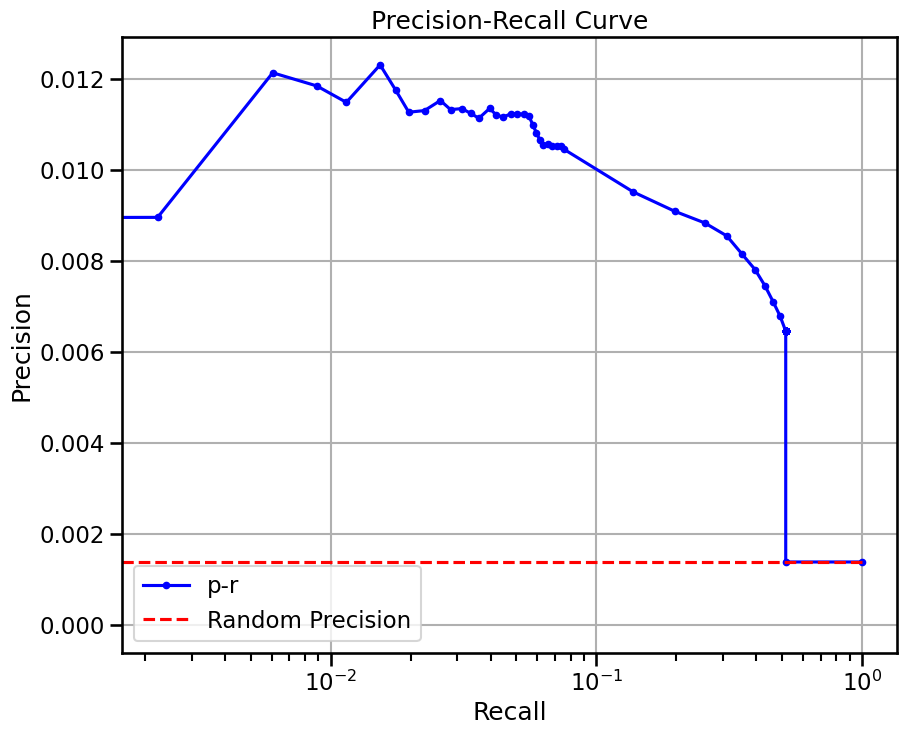

base enrichment


Top central genes: []
The DataFrame contains only the same values.


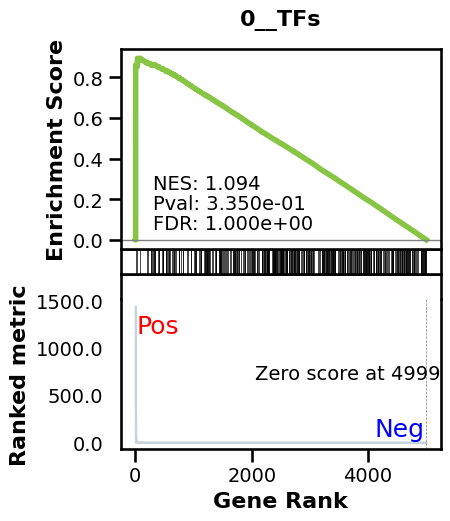

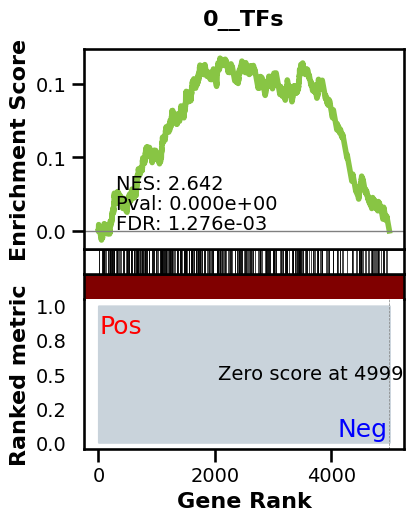

_________________________________________
TF specific enrichment


found some significant results for  9.25925925925926 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3169 genes
intersection pct: 0.6338
precision:  0.00138142053605649 
recall:  1.0 
random precision: 0.001381856590518629



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 58.61it/s]


  9%|▉         | 12/128 [00:00<00:01, 59.07it/s]


 14%|█▍        | 18/128 [00:00<00:01, 59.22it/s]


 19%|█▉        | 24/128 [00:00<00:01, 59.21it/s]


 23%|██▎       | 30/128 [00:00<00:01, 59.32it/s]


 28%|██▊       | 36/128 [00:00<00:01, 59.35it/s]


 34%|███▎      | 43/128 [00:00<00:01, 59.41it/s]


 38%|███▊      | 49/128 [00:00<00:01, 59.59it/s]


 43%|████▎     | 55/128 [00:00<00:01, 59.67it/s]


 48%|████▊     | 61/128 [00:01<00:01, 59.62it/s]


 52%|█████▏    | 67/128 [00:01<00:01, 59.52it/s]


 57%|█████▋    | 73/128 [00:01<00:00, 59.50it/s]


 62%|██████▏   | 79/128 [00:01<00:00, 59.45it/s]


 66%|██████▋   | 85/128 [00:01<00:00, 59.49it/s]


 72%|███████▏  | 92/128 [00:01<00:00, 59.58it/s]


 77%|███████▋  | 99/128 [00:01<00:00, 59.56it/s]


 82%|████████▏ | 105/128 [00:01<00:00, 59.68it/s]


 87%|████████▋ | 111/128 [00:01<00:00, 59.72it/s]


 91%|█████████▏| 117/128 [00:01<00:00, 59.63it/s]


 96%|█████████▌| 123/128 [00:02<00:00, 59.60it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 59.48it/s]

Average Precision (AP):  0.0014356194028970065
Area Under Precision-Recall Curve (AUPRC):  0.0014288070917690006
EPR: 2.989634965619781


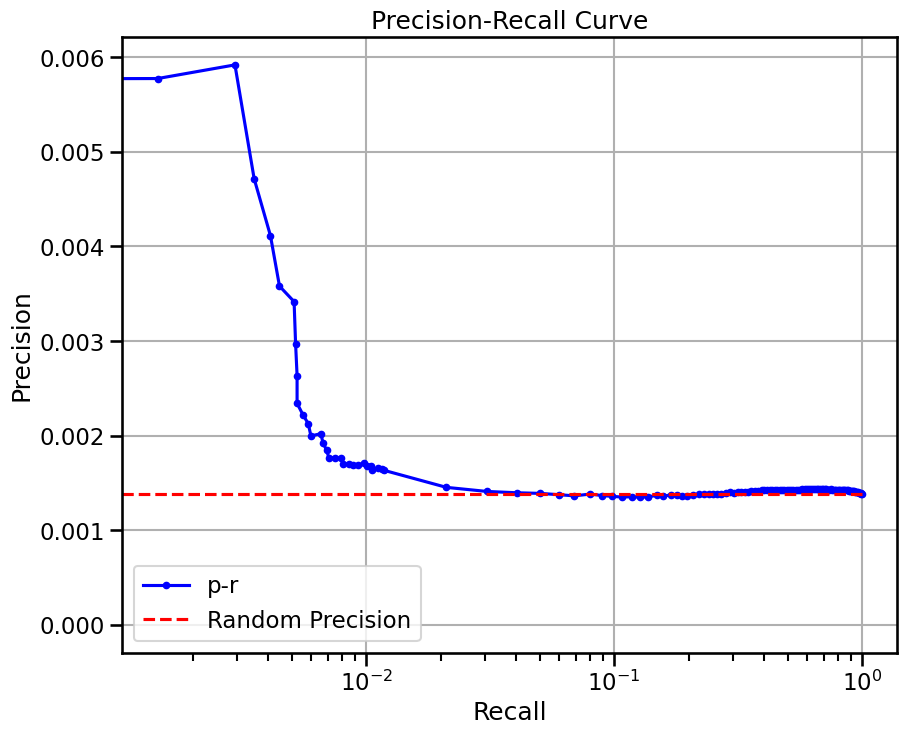

base enrichment


Top central genes: []


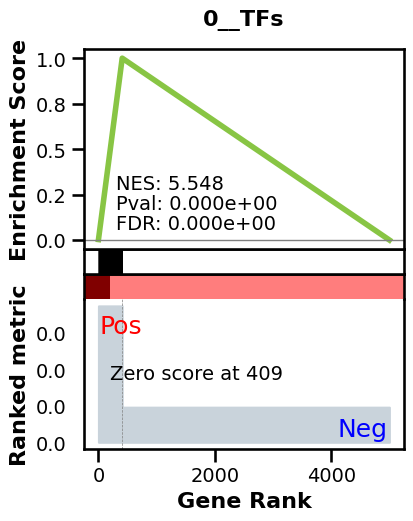

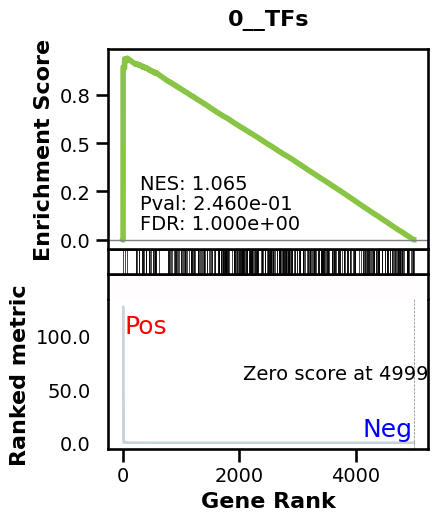

_________________________________________
TF specific enrichment


found some significant results for  7.407407407407407 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3169 genes
intersection pct: 0.6338
precision:  0.006449082630843438 
recall:  0.5156058530959418 
random precision: 0.001381856590518629



  0%|          | 0/128 [00:00<?, ?it/s]


  5%|▍         | 6/128 [00:00<00:02, 59.75it/s]


  9%|▉         | 12/128 [00:00<00:01, 59.73it/s]


 14%|█▍        | 18/128 [00:00<00:01, 59.76it/s]


 19%|█▉        | 24/128 [00:00<00:01, 59.69it/s]


 23%|██▎       | 30/128 [00:00<00:01, 59.67it/s]


 28%|██▊       | 36/128 [00:00<00:01, 59.72it/s]


 34%|███▎      | 43/128 [00:00<00:01, 59.76it/s]


 39%|███▉      | 50/128 [00:00<00:01, 59.82it/s]


 45%|████▍     | 57/128 [00:00<00:01, 59.85it/s]


 50%|█████     | 64/128 [00:01<00:01, 59.88it/s]


 55%|█████▌    | 71/128 [00:01<00:00, 59.90it/s]


 60%|██████    | 77/128 [00:01<00:00, 59.87it/s]


 65%|██████▍   | 83/128 [00:01<00:00, 59.88it/s]


 70%|██████▉   | 89/128 [00:01<00:00, 59.84it/s]


 74%|███████▍  | 95/128 [00:01<00:00, 59.75it/s]


 79%|███████▉  | 101/128 [00:01<00:00, 59.64it/s]


 84%|████████▎ | 107/128 [00:01<00:00, 59.61it/s]


 88%|████████▊ | 113/128 [00:01<00:00, 59.61it/s]


 94%|█████████▍| 120/128 [00:02<00:00, 59.71it/s]


 99%|█████████▉| 127/128 [00:02<00:00, 59.73it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:02<00:00, 59.73it/s]

Average Precision (AP):  0.004552812430404774
Area Under Precision-Recall Curve (AUPRC):  0.0040836351193342625
EPR: 4.796520817419393


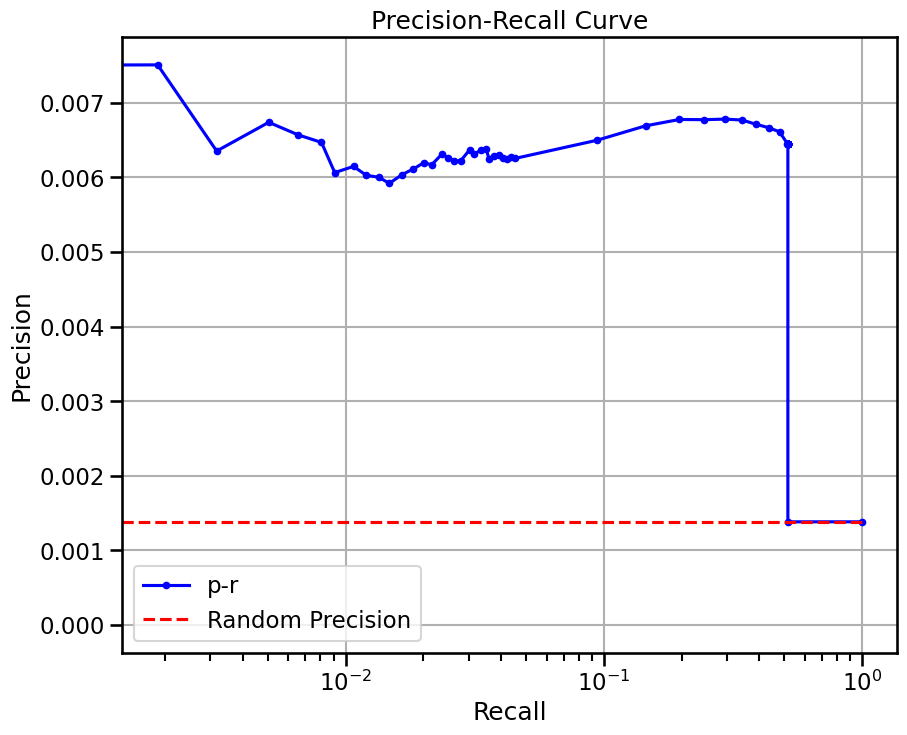


  0%|          | 0/32 [00:00<?, ?it/s]


  3%|▎         | 1/32 [00:02<01:10,  2.26s/it]


  6%|▋         | 2/32 [00:03<00:47,  1.59s/it]


  9%|▉         | 3/32 [00:04<00:37,  1.29s/it]


 12%|█▎        | 4/32 [00:05<00:32,  1.16s/it]


 16%|█▌        | 5/32 [00:06<00:29,  1.08s/it]


 19%|█▉        | 6/32 [00:07<00:26,  1.04s/it]


 22%|██▏       | 7/32 [00:08<00:25,  1.01s/it]


 25%|██▌       | 8/32 [00:09<00:23,  1.00it/s]


 28%|██▊       | 9/32 [00:10<00:22,  1.02it/s]


 31%|███▏      | 10/32 [00:10<00:21,  1.03it/s]


 34%|███▍      | 11/32 [00:11<00:20,  1.04it/s]


 38%|███▊      | 12/32 [00:12<00:19,  1.05it/s]


 41%|████      | 13/32 [00:13<00:18,  1.05it/s]


 44%|████▍     | 14/32 [00:14<00:17,  1.05it/s]


 47%|████▋     | 15/32 [00:15<00:16,  1.04it/s]


 50%|█████     | 16/32 [00:16<00:15,  1.05it/s]


 53%|█████▎    | 17/32 [00:17<00:14,  1.05it/s]


 56%|█████▋    | 18/32 [00:18<00:13,  1.06it/s]


 59%|█████▉    | 19/32 [00:19<00:12,  1.06it/s]


 62%|██████▎   | 20/32 [00:20<00:11,  1.06it/s]


 66%|██████▌   | 21/32 [00:21<00:10,  1.06it/s]


 69%|██████▉   | 22/32 [00:22<00:09,  1.07it/s]


 72%|███████▏  | 23/32 [00:23<00:08,  1.07it/s]


 75%|███████▌  | 24/32 [00:24<00:07,  1.07it/s]


 78%|███████▊  | 25/32 [00:25<00:06,  1.07it/s]


 81%|████████▏ | 26/32 [00:26<00:05,  1.07it/s]


 84%|████████▍ | 27/32 [00:26<00:04,  1.07it/s]


 88%|████████▊ | 28/32 [00:27<00:03,  1.05it/s]


 91%|█████████ | 29/32 [00:28<00:02,  1.06it/s]


 94%|█████████▍| 30/32 [00:29<00:01,  1.06it/s]


 97%|█████████▋| 31/32 [00:30<00:00,  1.06it/s]


100%|██████████| 32/32 [00:31<00:00,  1.06it/s]


100%|██████████| 32/32 [00:31<00:00,  1.00it/s]

avg link count: 535876201, sparsity: 1.0


base enrichment


too many genes for central computation


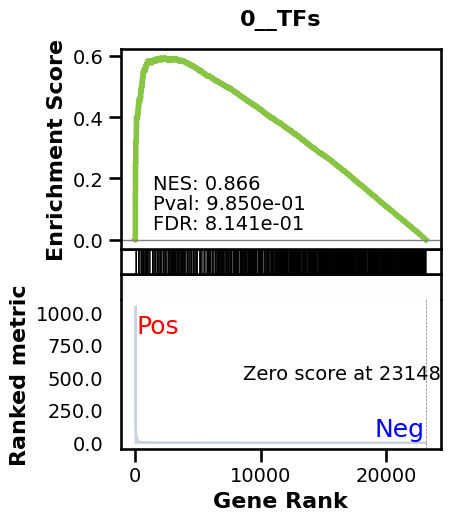

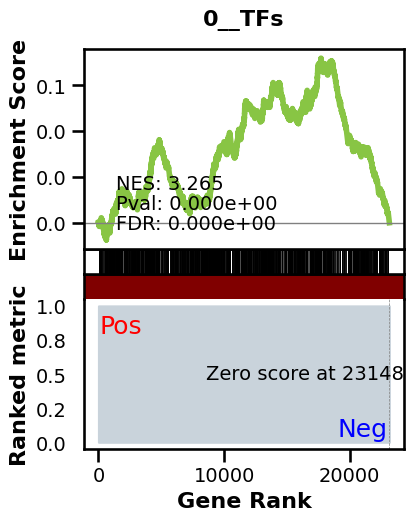

_________________________________________
TF specific enrichment


found some significant results for  66.96428571428571 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5380362002678302


precision:  0.0008896322223674437 
recall:  1.0 
random precision: 0.0008897036558203398



  0%|          | 0/128 [00:00<?, ?it/s]


  1%|          | 1/128 [00:00<00:28,  4.38it/s]


  2%|▏         | 2/128 [00:00<00:28,  4.36it/s]


  2%|▏         | 3/128 [00:00<00:28,  4.35it/s]


  3%|▎         | 4/128 [00:00<00:28,  4.34it/s]


  4%|▍         | 5/128 [00:01<00:28,  4.34it/s]


  5%|▍         | 6/128 [00:01<00:28,  4.35it/s]


  5%|▌         | 7/128 [00:01<00:27,  4.35it/s]


  6%|▋         | 8/128 [00:01<00:27,  4.34it/s]


  7%|▋         | 9/128 [00:02<00:27,  4.34it/s]


  8%|▊         | 10/128 [00:02<00:27,  4.34it/s]


  9%|▊         | 11/128 [00:02<00:26,  4.34it/s]


  9%|▉         | 12/128 [00:02<00:26,  4.35it/s]


 10%|█         | 13/128 [00:02<00:26,  4.34it/s]


 11%|█         | 14/128 [00:03<00:26,  4.34it/s]


 12%|█▏        | 15/128 [00:03<00:26,  4.34it/s]


 12%|█▎        | 16/128 [00:03<00:25,  4.34it/s]


 13%|█▎        | 17/128 [00:03<00:25,  4.33it/s]


 14%|█▍        | 18/128 [00:04<00:25,  4.33it/s]


 15%|█▍        | 19/128 [00:04<00:25,  4.33it/s]


 16%|█▌        | 20/128 [00:04<00:24,  4.33it/s]


 16%|█▋        | 21/128 [00:04<00:24,  4.33it/s]


 17%|█▋        | 22/128 [00:05<00:24,  4.33it/s]


 18%|█▊        | 23/128 [00:05<00:24,  4.33it/s]


 19%|█▉        | 24/128 [00:05<00:23,  4.34it/s]


 20%|█▉        | 25/128 [00:05<00:23,  4.33it/s]


 20%|██        | 26/128 [00:05<00:23,  4.33it/s]


 21%|██        | 27/128 [00:06<00:23,  4.33it/s]


 22%|██▏       | 28/128 [00:06<00:23,  4.33it/s]


 23%|██▎       | 29/128 [00:06<00:22,  4.34it/s]


 23%|██▎       | 30/128 [00:06<00:22,  4.34it/s]


 24%|██▍       | 31/128 [00:07<00:22,  4.34it/s]


 25%|██▌       | 32/128 [00:07<00:22,  4.34it/s]


 26%|██▌       | 33/128 [00:07<00:21,  4.34it/s]


 27%|██▋       | 34/128 [00:07<00:21,  4.33it/s]


 27%|██▋       | 35/128 [00:08<00:21,  4.34it/s]


 28%|██▊       | 36/128 [00:08<00:21,  4.34it/s]


 29%|██▉       | 37/128 [00:08<00:20,  4.34it/s]


 30%|██▉       | 38/128 [00:08<00:20,  4.34it/s]


 30%|███       | 39/128 [00:08<00:20,  4.33it/s]


 31%|███▏      | 40/128 [00:09<00:20,  4.34it/s]


 32%|███▏      | 41/128 [00:09<00:20,  4.34it/s]


 33%|███▎      | 42/128 [00:09<00:19,  4.34it/s]


 34%|███▎      | 43/128 [00:09<00:19,  4.33it/s]


 34%|███▍      | 44/128 [00:10<00:19,  4.33it/s]


 35%|███▌      | 45/128 [00:10<00:19,  4.33it/s]


 36%|███▌      | 46/128 [00:10<00:18,  4.32it/s]


 37%|███▋      | 47/128 [00:10<00:18,  4.33it/s]


 38%|███▊      | 48/128 [00:11<00:18,  4.33it/s]


 38%|███▊      | 49/128 [00:11<00:18,  4.33it/s]


 39%|███▉      | 50/128 [00:11<00:17,  4.33it/s]


 40%|███▉      | 51/128 [00:11<00:17,  4.33it/s]


 41%|████      | 52/128 [00:11<00:17,  4.34it/s]


 41%|████▏     | 53/128 [00:12<00:17,  4.34it/s]


 42%|████▏     | 54/128 [00:12<00:17,  4.34it/s]


 43%|████▎     | 55/128 [00:12<00:16,  4.34it/s]


 44%|████▍     | 56/128 [00:12<00:16,  4.33it/s]


 45%|████▍     | 57/128 [00:13<00:16,  4.34it/s]


 45%|████▌     | 58/128 [00:13<00:16,  4.34it/s]


 46%|████▌     | 59/128 [00:13<00:15,  4.34it/s]


 47%|████▋     | 60/128 [00:13<00:15,  4.33it/s]


 48%|████▊     | 61/128 [00:14<00:15,  4.33it/s]


 48%|████▊     | 62/128 [00:14<00:15,  4.33it/s]


 49%|████▉     | 63/128 [00:14<00:14,  4.33it/s]


 50%|█████     | 64/128 [00:14<00:14,  4.34it/s]


 51%|█████     | 65/128 [00:14<00:14,  4.34it/s]


 52%|█████▏    | 66/128 [00:15<00:14,  4.34it/s]


 52%|█████▏    | 67/128 [00:15<00:14,  4.34it/s]


 53%|█████▎    | 68/128 [00:15<00:13,  4.34it/s]


 54%|█████▍    | 69/128 [00:15<00:13,  4.33it/s]


 55%|█████▍    | 70/128 [00:16<00:13,  4.34it/s]


 55%|█████▌    | 71/128 [00:16<00:13,  4.34it/s]


 56%|█████▋    | 72/128 [00:16<00:12,  4.34it/s]


 57%|█████▋    | 73/128 [00:16<00:12,  4.35it/s]


 58%|█████▊    | 74/128 [00:17<00:12,  4.34it/s]


 59%|█████▊    | 75/128 [00:17<00:12,  4.34it/s]


 59%|█████▉    | 76/128 [00:17<00:11,  4.34it/s]


 60%|██████    | 77/128 [00:17<00:11,  4.34it/s]


 61%|██████    | 78/128 [00:17<00:11,  4.34it/s]


 62%|██████▏   | 79/128 [00:18<00:11,  4.34it/s]


 62%|██████▎   | 80/128 [00:18<00:11,  4.35it/s]


 63%|██████▎   | 81/128 [00:18<00:10,  4.34it/s]


 64%|██████▍   | 82/128 [00:18<00:10,  4.34it/s]


 65%|██████▍   | 83/128 [00:19<00:10,  4.34it/s]


 66%|██████▌   | 84/128 [00:19<00:10,  4.34it/s]


 66%|██████▋   | 85/128 [00:19<00:09,  4.34it/s]


 67%|██████▋   | 86/128 [00:19<00:09,  4.33it/s]


 68%|██████▊   | 87/128 [00:20<00:09,  4.33it/s]


 69%|██████▉   | 88/128 [00:20<00:09,  4.33it/s]


 70%|██████▉   | 89/128 [00:20<00:09,  4.33it/s]


 70%|███████   | 90/128 [00:20<00:08,  4.33it/s]


 71%|███████   | 91/128 [00:20<00:08,  4.32it/s]


 72%|███████▏  | 92/128 [00:21<00:08,  4.32it/s]


 73%|███████▎  | 93/128 [00:21<00:08,  4.33it/s]


 73%|███████▎  | 94/128 [00:21<00:07,  4.33it/s]


 74%|███████▍  | 95/128 [00:21<00:07,  4.33it/s]


 75%|███████▌  | 96/128 [00:22<00:07,  4.33it/s]


 76%|███████▌  | 97/128 [00:22<00:07,  4.33it/s]


 77%|███████▋  | 98/128 [00:22<00:06,  4.33it/s]


 77%|███████▋  | 99/128 [00:22<00:06,  4.33it/s]


 78%|███████▊  | 100/128 [00:23<00:06,  4.34it/s]


 79%|███████▉  | 101/128 [00:23<00:06,  4.34it/s]


 80%|███████▉  | 102/128 [00:23<00:05,  4.34it/s]


 80%|████████  | 103/128 [00:23<00:05,  4.33it/s]


 81%|████████▏ | 104/128 [00:23<00:05,  4.33it/s]


 82%|████████▏ | 105/128 [00:24<00:05,  4.32it/s]


 83%|████████▎ | 106/128 [00:24<00:05,  4.33it/s]


 84%|████████▎ | 107/128 [00:24<00:04,  4.34it/s]


 84%|████████▍ | 108/128 [00:24<00:04,  4.33it/s]


 85%|████████▌ | 109/128 [00:25<00:04,  4.33it/s]


 86%|████████▌ | 110/128 [00:25<00:04,  4.33it/s]


 87%|████████▋ | 111/128 [00:25<00:03,  4.33it/s]


 88%|████████▊ | 112/128 [00:25<00:03,  4.33it/s]


 88%|████████▊ | 113/128 [00:26<00:03,  4.33it/s]


 89%|████████▉ | 114/128 [00:26<00:03,  4.33it/s]


 90%|████████▉ | 115/128 [00:26<00:02,  4.34it/s]


 91%|█████████ | 116/128 [00:26<00:02,  4.33it/s]


 91%|█████████▏| 117/128 [00:26<00:02,  4.33it/s]


 92%|█████████▏| 118/128 [00:27<00:02,  4.33it/s]


 93%|█████████▎| 119/128 [00:27<00:02,  4.33it/s]


 94%|█████████▍| 120/128 [00:27<00:01,  4.33it/s]


 95%|█████████▍| 121/128 [00:27<00:01,  4.33it/s]


 95%|█████████▌| 122/128 [00:28<00:01,  4.33it/s]


 96%|█████████▌| 123/128 [00:28<00:01,  4.33it/s]


 97%|█████████▋| 124/128 [00:28<00:00,  4.33it/s]


 98%|█████████▊| 125/128 [00:28<00:00,  4.34it/s]


 98%|█████████▊| 126/128 [00:29<00:00,  4.34it/s]


 99%|█████████▉| 127/128 [00:29<00:00,  4.34it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()



100%|██████████| 128/128 [00:29<00:00,  4.34it/s]


100%|██████████| 128/128 [00:29<00:00,  4.34it/s]

Average Precision (AP):  0.0010974962413193253
Area Under Precision-Recall Curve (AUPRC):  0.0010959315340667139


EPR: 1.9743478659587455


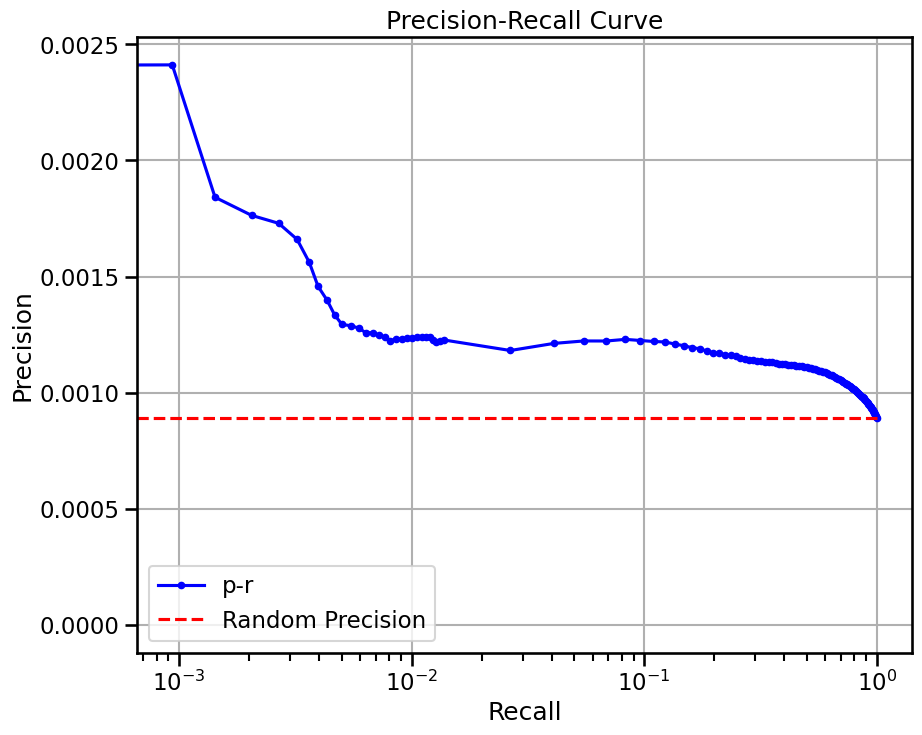


  0%|          | 0/64 [00:00<?, ?it/s]


  2%|▏         | 1/64 [00:02<02:58,  2.84s/it]


  3%|▎         | 2/64 [00:04<02:01,  1.97s/it]


  5%|▍         | 3/64 [00:10<04:09,  4.09s/it]


  6%|▋         | 4/64 [00:12<03:06,  3.11s/it]


  8%|▊         | 5/64 [00:13<02:25,  2.47s/it]


  9%|▉         | 6/64 [00:15<02:00,  2.08s/it]


 11%|█         | 7/64 [00:16<01:45,  1.86s/it]


 12%|█▎        | 8/64 [00:17<01:35,  1.70s/it]


 14%|█▍        | 9/64 [00:19<01:27,  1.59s/it]


 16%|█▌        | 10/64 [00:20<01:22,  1.53s/it]


 17%|█▋        | 11/64 [00:21<01:18,  1.48s/it]


 19%|█▉        | 12/64 [00:23<01:14,  1.44s/it]


 20%|██        | 13/64 [00:24<01:13,  1.43s/it]


 22%|██▏       | 14/64 [00:26<01:10,  1.41s/it]


 23%|██▎       | 15/64 [00:27<01:07,  1.38s/it]


 25%|██▌       | 16/64 [00:28<01:05,  1.37s/it]


 27%|██▋       | 17/64 [00:30<01:03,  1.36s/it]


 28%|██▊       | 18/64 [00:31<01:02,  1.36s/it]


 30%|██▉       | 19/64 [00:32<01:00,  1.34s/it]


 31%|███▏      | 20/64 [00:34<00:58,  1.34s/it]


 33%|███▎      | 21/64 [00:35<00:57,  1.33s/it]


 34%|███▍      | 22/64 [00:36<00:55,  1.33s/it]


 36%|███▌      | 23/64 [00:37<00:54,  1.32s/it]


 38%|███▊      | 24/64 [00:39<00:52,  1.31s/it]


 39%|███▉      | 25/64 [00:40<00:50,  1.30s/it]


 41%|████      | 26/64 [00:41<00:48,  1.28s/it]


 42%|████▏     | 27/64 [00:43<00:46,  1.27s/it]


 44%|████▍     | 28/64 [00:44<00:45,  1.26s/it]


 45%|████▌     | 29/64 [00:45<00:43,  1.25s/it]


 47%|████▋     | 30/64 [00:46<00:42,  1.24s/it]


 48%|████▊     | 31/64 [00:47<00:40,  1.24s/it]


 50%|█████     | 32/64 [00:49<00:39,  1.23s/it]


 52%|█████▏    | 33/64 [00:50<00:38,  1.23s/it]


 53%|█████▎    | 34/64 [00:51<00:36,  1.23s/it]


 55%|█████▍    | 35/64 [00:52<00:35,  1.23s/it]


 56%|█████▋    | 36/64 [00:54<00:34,  1.23s/it]


 58%|█████▊    | 37/64 [00:55<00:33,  1.25s/it]


 59%|█████▉    | 38/64 [00:56<00:32,  1.24s/it]


 61%|██████    | 39/64 [00:57<00:30,  1.24s/it]


 62%|██████▎   | 40/64 [00:59<00:29,  1.24s/it]


 64%|██████▍   | 41/64 [01:00<00:28,  1.24s/it]


 66%|██████▌   | 42/64 [01:01<00:27,  1.23s/it]


 67%|██████▋   | 43/64 [01:02<00:25,  1.24s/it]


 69%|██████▉   | 44/64 [01:03<00:24,  1.24s/it]


 70%|███████   | 45/64 [01:05<00:23,  1.24s/it]


 72%|███████▏  | 46/64 [01:06<00:22,  1.23s/it]


 73%|███████▎  | 47/64 [01:07<00:21,  1.24s/it]


 75%|███████▌  | 48/64 [01:08<00:19,  1.23s/it]


 77%|███████▋  | 49/64 [01:10<00:18,  1.23s/it]


 78%|███████▊  | 50/64 [01:11<00:17,  1.23s/it]


 80%|███████▉  | 51/64 [01:12<00:16,  1.23s/it]


 81%|████████▏ | 52/64 [01:13<00:14,  1.23s/it]


 83%|████████▎ | 53/64 [01:15<00:13,  1.24s/it]


 84%|████████▍ | 54/64 [01:16<00:12,  1.24s/it]


 86%|████████▌ | 55/64 [01:17<00:11,  1.24s/it]


 88%|████████▊ | 56/64 [01:18<00:09,  1.24s/it]


 89%|████████▉ | 57/64 [01:20<00:08,  1.24s/it]


 91%|█████████ | 58/64 [01:21<00:07,  1.24s/it]


 92%|█████████▏| 59/64 [01:22<00:06,  1.24s/it]


 94%|█████████▍| 60/64 [01:23<00:04,  1.24s/it]


 95%|█████████▌| 61/64 [01:24<00:03,  1.23s/it]


 97%|█████████▋| 62/64 [01:26<00:02,  1.23s/it]


 98%|█████████▊| 63/64 [01:27<00:01,  1.23s/it]


100%|██████████| 64/64 [01:28<00:00,  1.23s/it]


100%|██████████| 64/64 [01:28<00:00,  1.39s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


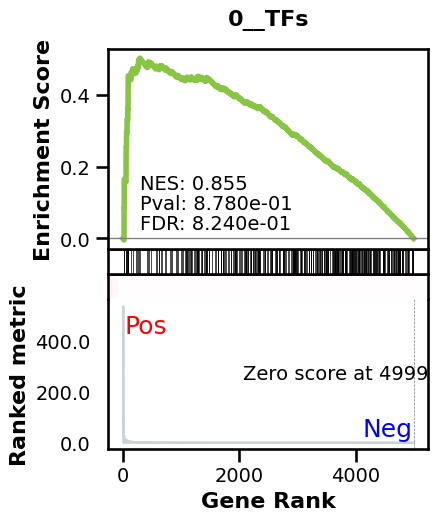

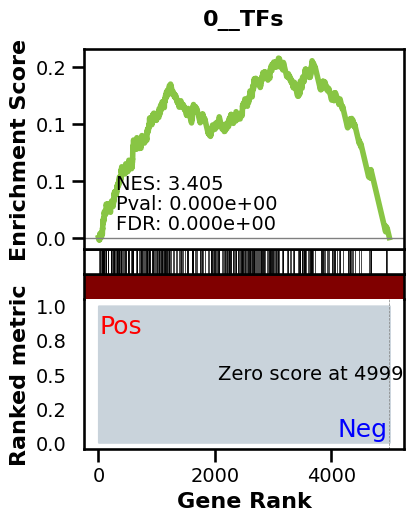

_________________________________________
TF specific enrichment


found some significant results for  45.45454545454545 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2705 genes
intersection pct: 0.541
precision:  0.0012886384835366833 
recall:  1.0 
random precision: 0.0012891150510231984



  0%|          | 0/128 [00:00<?, ?it/s]


  8%|▊         | 10/128 [00:00<00:01, 93.37it/s]


 16%|█▌        | 20/128 [00:00<00:01, 93.48it/s]


 23%|██▎       | 30/128 [00:00<00:01, 93.58it/s]


 31%|███▏      | 40/128 [00:00<00:00, 93.47it/s]


 39%|███▉      | 50/128 [00:00<00:00, 93.51it/s]


 47%|████▋     | 60/128 [00:00<00:00, 93.32it/s]


 55%|█████▍    | 70/128 [00:00<00:00, 93.50it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 93.57it/s]


 70%|███████   | 90/128 [00:00<00:00, 93.53it/s]


 78%|███████▊  | 100/128 [00:01<00:00, 93.56it/s]


 86%|████████▌ | 110/128 [00:01<00:00, 93.62it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 93.63it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 93.49it/s]

Average Precision (AP):  0.001485374437183574
Area Under Precision-Recall Curve (AUPRC):  0.0014835645149570025
EPR: 0.49297628192893606


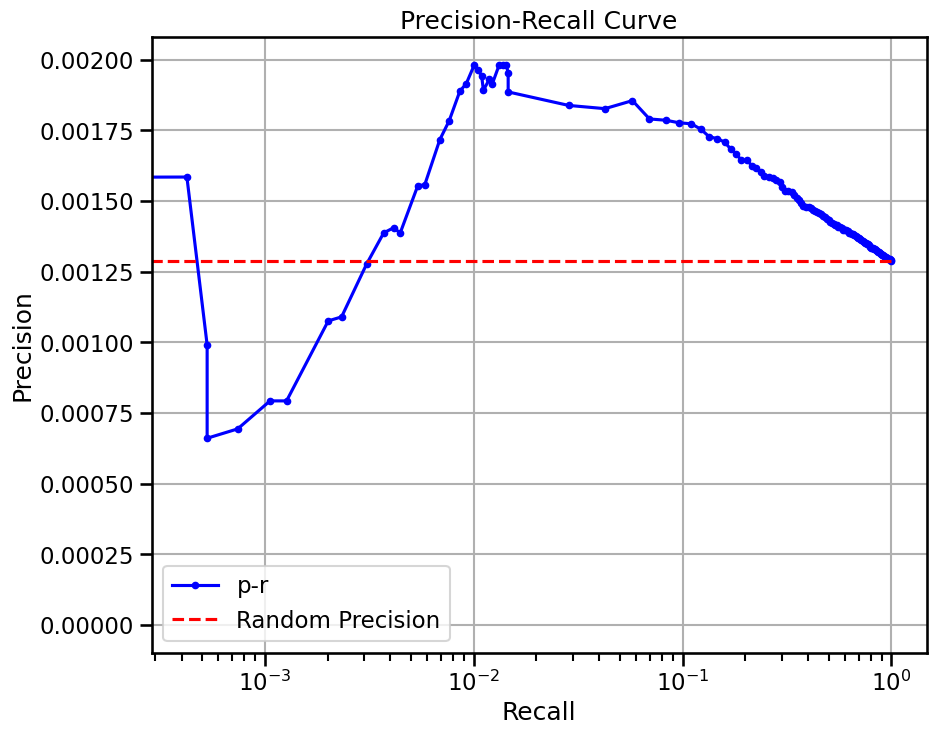

base enrichment


Top central genes: []


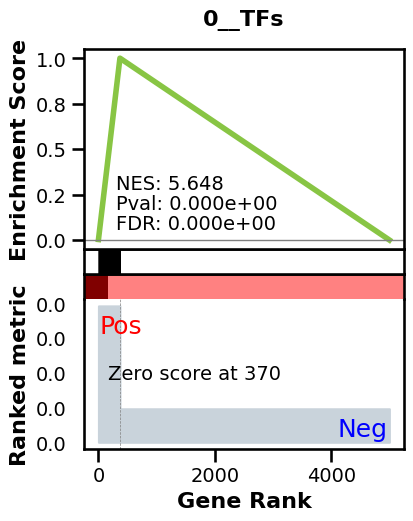

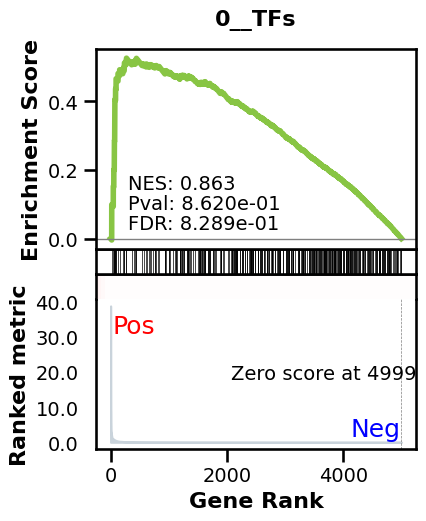

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2705 genes
intersection pct: 0.541
precision:  0.007002614850547766 
recall:  0.6589245943366211 
random precision: 0.0012891150510231984



  0%|          | 0/128 [00:00<?, ?it/s]


  8%|▊         | 10/128 [00:00<00:01, 95.08it/s]


 16%|█▌        | 20/128 [00:00<00:01, 95.34it/s]


 23%|██▎       | 30/128 [00:00<00:01, 95.16it/s]


 31%|███▏      | 40/128 [00:00<00:00, 95.03it/s]


 39%|███▉      | 50/128 [00:00<00:00, 95.12it/s]


 47%|████▋     | 60/128 [00:00<00:00, 95.27it/s]


 55%|█████▍    | 70/128 [00:00<00:00, 95.28it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 95.30it/s]


 70%|███████   | 90/128 [00:00<00:00, 95.28it/s]


 78%|███████▊  | 100/128 [00:01<00:00, 95.31it/s]


 86%|████████▌ | 110/128 [00:01<00:00, 95.33it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 95.34it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 95.21it/s]

Average Precision (AP):  0.005917213317653831
Area Under Precision-Recall Curve (AUPRC):  0.005587059834725581
EPR: 7.784300599663409


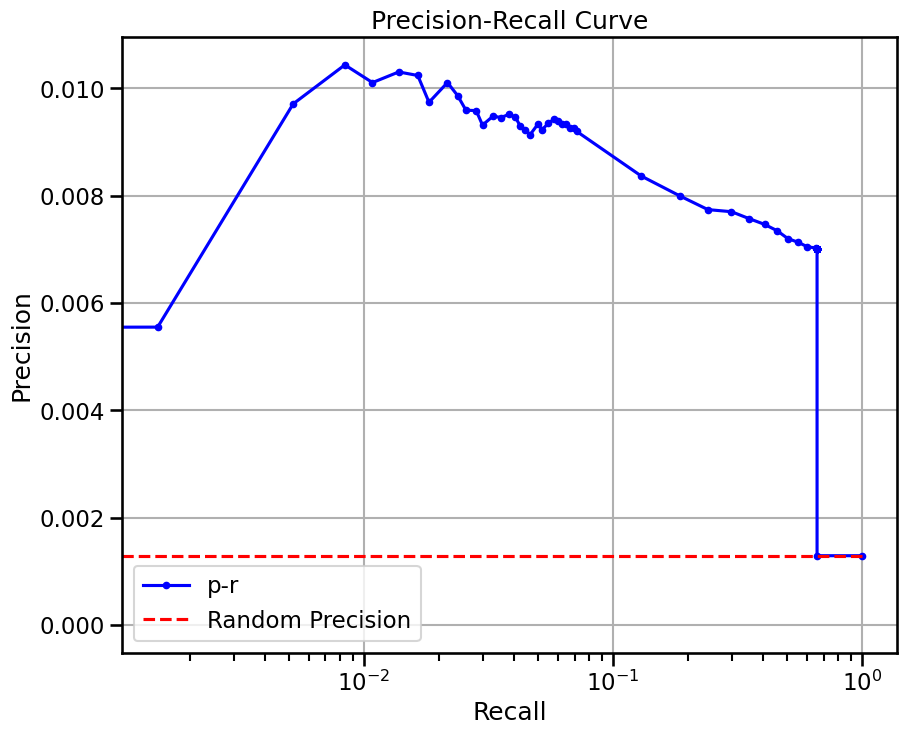

base enrichment


Top central genes: []
The DataFrame contains only the same values.


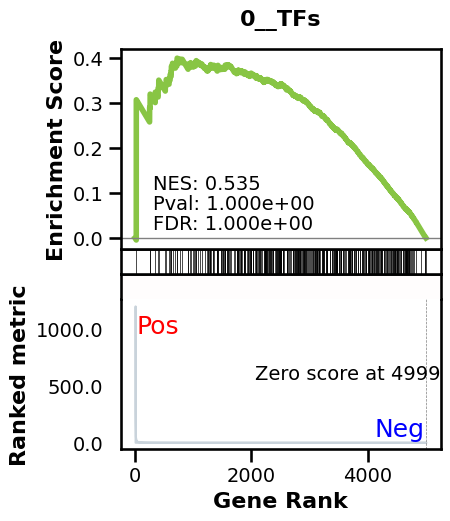

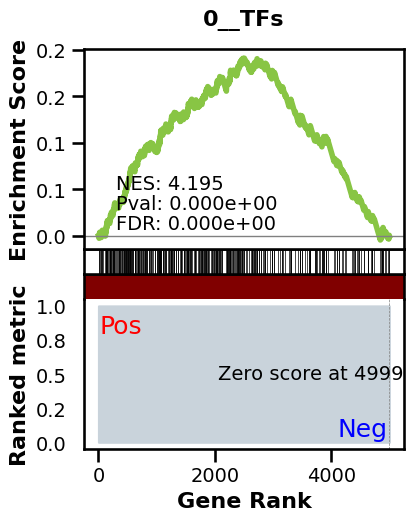

_________________________________________
TF specific enrichment


found some significant results for  9.090909090909092 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2705 genes
intersection pct: 0.541
precision:  0.0012886384835366833 
recall:  1.0 
random precision: 0.0012891150510231984



  0%|          | 0/128 [00:00<?, ?it/s]


  8%|▊         | 10/128 [00:00<00:01, 95.12it/s]


 16%|█▌        | 20/128 [00:00<00:01, 94.48it/s]


 23%|██▎       | 30/128 [00:00<00:01, 94.70it/s]


 31%|███▏      | 40/128 [00:00<00:00, 94.91it/s]


 39%|███▉      | 50/128 [00:00<00:00, 94.96it/s]


 47%|████▋     | 60/128 [00:00<00:00, 95.17it/s]


 55%|█████▍    | 70/128 [00:00<00:00, 95.23it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 94.70it/s]


 70%|███████   | 90/128 [00:00<00:00, 94.84it/s]


 78%|███████▊  | 100/128 [00:01<00:00, 95.00it/s]


 86%|████████▌ | 110/128 [00:01<00:00, 95.18it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 95.23it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 95.00it/s]

Average Precision (AP):  0.0010503917238118405
Area Under Precision-Recall Curve (AUPRC):  0.0010489163615977756
EPR: 0.49297628192893606


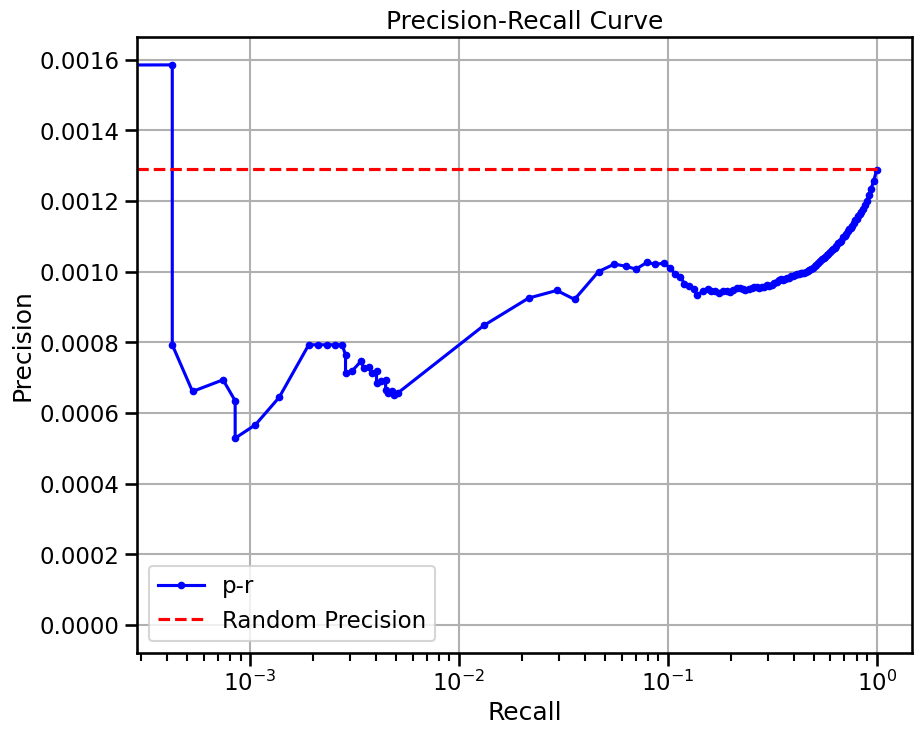

base enrichment


Top central genes: []


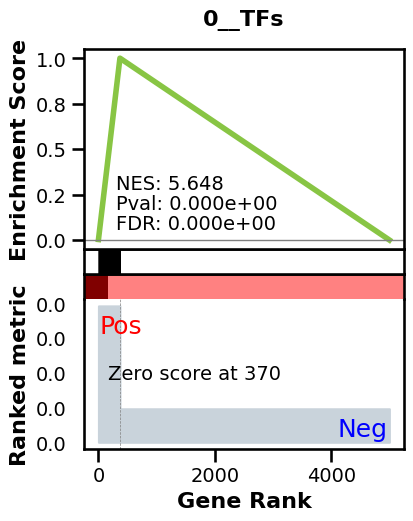

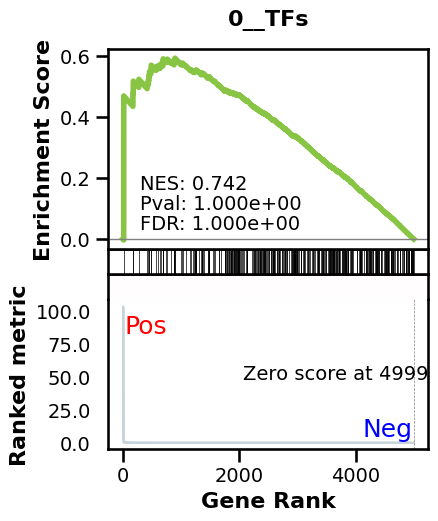

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 2705 genes
intersection pct: 0.541
precision:  0.007002614850547766 
recall:  0.6589245943366211 
random precision: 0.0012891150510231984



  0%|          | 0/128 [00:00<?, ?it/s]


  8%|▊         | 10/128 [00:00<00:01, 95.13it/s]


 16%|█▌        | 20/128 [00:00<00:01, 95.11it/s]


 23%|██▎       | 30/128 [00:00<00:01, 95.10it/s]


 31%|███▏      | 40/128 [00:00<00:00, 95.18it/s]


 39%|███▉      | 50/128 [00:00<00:00, 95.19it/s]


 47%|████▋     | 60/128 [00:00<00:00, 95.30it/s]


 55%|█████▍    | 70/128 [00:00<00:00, 95.18it/s]


 62%|██████▎   | 80/128 [00:00<00:00, 95.12it/s]


 70%|███████   | 90/128 [00:00<00:00, 95.06it/s]


 78%|███████▊  | 100/128 [00:01<00:00, 95.11it/s]


 86%|████████▌ | 110/128 [00:01<00:00, 95.10it/s]


 94%|█████████▍| 120/128 [00:01<00:00, 95.04it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()

100%|██████████| 128/128 [00:01<00:00, 95.04it/s]

Average Precision (AP):  0.004367208221968824
Area Under Precision-Recall Curve (AUPRC):  0.004031224048789882
EPR: 2.8102190395455104


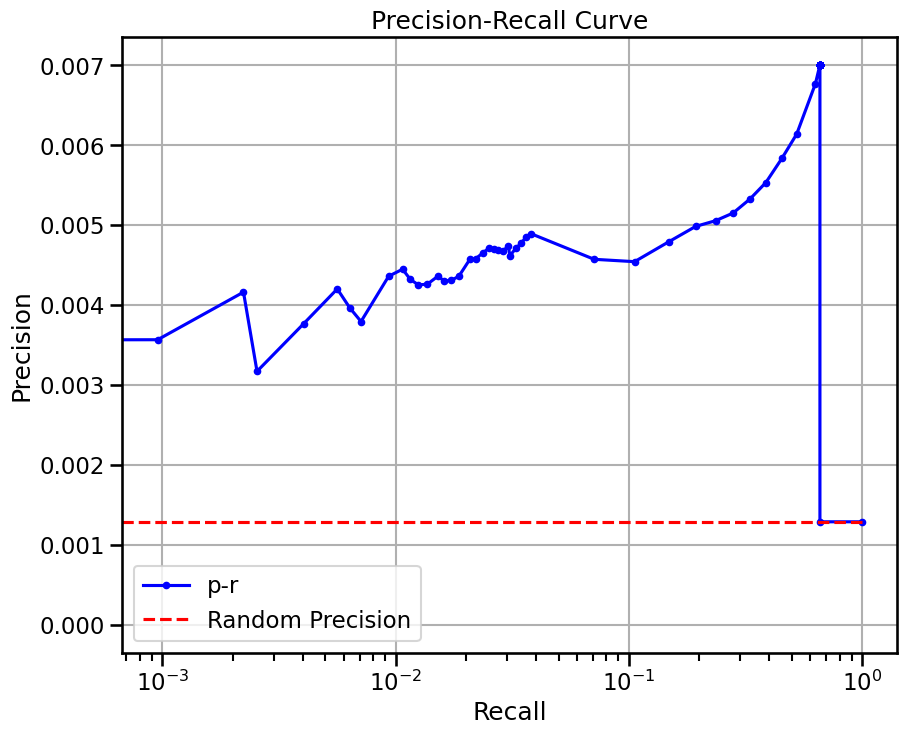

In [6]:
metrics = {}
clf_omni = None
for celltype in CELLTYPES:
    grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                        how="random expr",
                        preprocess="softmax",
                        head_agg='mean',
                        filtration="none",
                        forward_mode="none",
                        num_genes=2200,
                        max_cells=MAXCELLS,
                        doplot=False,
                        batch_size=32,
                        )
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    metrics[celltype+'_scprint_full'] = BenGRN(grn).scprint_benchmark()
    del grn
    grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                        how="most var across",
                        preprocess="softmax",
                        head_agg='none',
                        filtration="none",
                        forward_mode="none",
                        num_genes=NUM_GENES,
                        max_cells=1024,
                        doplot=False,
                        batch_size=16,
                        )
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    grn.varp['all'] = grn.varp['GRN']
    grn.varp['GRN'] = grn.varp['GRN'][:,:,:].mean(-1)
    metrics[celltype+'_scprint_mean'] = BenGRN(grn).scprint_benchmark()
    grn.varp['GRN'][~grn.var.isTF,:]=0
    metrics[celltype+'_scprint_tf_mean'] = BenGRN(grn).scprint_benchmark()
    if clf_omni == None:
        grn.varp['GRN'] = grn.varp['all']
        _, m, clf_omni = train_classifier(grn, C=1, train_size=0.6, class_weight={
                                        1: 200, 0: 1}, shuffle=True, max_iter=200, return_full=False)
        joblib.dump(clf_omni, 'clf_omni.pkl')
    grn.varp['GRN'] = grn.varp['all'][:,:,clf_omni.coef_[0] > 0].mean(-1)
    metrics[celltype+'_scprint_class'] = BenGRN(grn).scprint_benchmark()
    grn.varp['GRN'][~grn.var.isTF,:]=0
    metrics[celltype+'_scprint_tf_class'] = BenGRN(grn).scprint_benchmark()
    del grn

In [7]:
metrics

{'kidney distal convoluted tubule epithelial cell_scprint_full': {'enriched_terms_Regulators': ['celltype.gmt__Proximal tubule cells',
   'celltype.gmt__Distal tubule cells',
   'celltype.gmt__CD8+ NKT-like cells',
   'celltype.gmt__Myofibroblasts',
   'celltype.gmt__Natural killer cells',
   'celltype.gmt__CD4+ NKT-like cells'],
  'TF_enr': True,
  'enriched_terms_Targets': ['0__TFs',
   'celltype.gmt__Enterocytes',
   'celltype.gmt__Pro-B cells',
   'celltype.gmt__Hepatocytes',
   'celltype.gmt__Beta cells',
   'celltype.gmt__Goblet cells',
   'celltype.gmt__Macrophages',
   'celltype.gmt__Immune system cells',
   'celltype.gmt__Gamma (PP) cells',
   'celltype.gmt__Lymphatic Endothelial cells',
   'celltype.gmt__Naive CD8+ T cells',
   'celltype.gmt__Naive CD4+ T cells',
   'celltype.gmt__-T cells',
   'celltype.gmt__Non-classical monocytes',
   'celltype.gmt__Adipose progenitor cells',
   'celltype.gmt__Classical Monocytes',
   'celltype.gmt__Myocytes',
   'celltype.gmt__Memory B ce

In [ ]:
True
True
True
True
True
False
True
True
True
True
False
False
False
False
False
False
False
False
False
False
False
False
False
True
False
False
False
False
False
False
True
False
False
True
True
True
True
False
True
True
False
False
False
False
False
False
False
True
False
True

In [8]:
import pandas as pd

In [9]:
res = []
for k, v in metrics.items():
    res.append([k.split('_')[-1], k.split('_')[0], v['epr'], v['auprc'], v['rand_precision'], v['significant_enriched_TFtargets'], v.get('TF_enr', False), 'tf_' in k])

df = pd.DataFrame(res, columns=['tools','name','EPR', 'AUPRC', 'RAND', 'TF_targ', 'TF_enr', 'TF_only'])
df

,tools,name,EPR,AUPRC,RAND,TF_targ,TF_enr,TF_only
0,full,kidney distal convoluted tubule epithelial cell,1.810653,0.001026,0.000890,60.714286,True,False
1,mean,kidney distal convoluted tubule epithelial cell,2.783606,0.000890,0.000826,20.588235,False,False
2,mean,kidney distal convoluted tubule epithelial cell,4.368297,0.001676,0.000826,14.705882,True,True
3,class,kidney distal convoluted tubule epithelial cell,4.979990,0.000994,0.000826,2.941176,False,False
4,class,kidney distal convoluted tubule epithelial cell,12.416586,0.002227,0.000826,8.823529,True,True
5,full,kidney loop of Henle thick ascending limb epit...,1.679765,0.001030,0.000890,66.071429,True,False
6,mean,kidney loop of Henle thick ascending limb epit...,1.968219,0.000897,0.000834,23.076923,True,False
7,mean,kidney loop of Henle thick ascending limb epit...,9.971630,0.002689,0.000834,3.846154,True,True
8,class,kidney loop of Henle thick ascending limb epit...,5.319020,0.000959,0.000834,7.692308,True,False
9,class,kidney loop of Henle thick ascending limb epit...,18.579117,0.003498,0.000834,3.846154,True,True
